In [327]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import copy

import math
import torch
from torch.nn.modules.transformer import TransformerEncoder, TransformerEncoderLayer
from torch.nn.modules import LayerNorm, Linear, ReLU
import torch.nn as nn
import torch.nn.functional as F
import sklearn.metrics
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import pickle
from torch.utils.data import DataLoader



device = 'cuda' if torch.cuda.is_available() else 'cpu'


# Data Loader

In [328]:
X = np.load('/kaggle/input/active-learning-subset/tar_image_subset.npy') 
y = np.load('/kaggle/input/active-learning-subset/label_target_subset.npy')


test_size = 20/100
X_pool, X_val, y_pool, y_val = train_test_split(X, y, test_size=test_size, stratify=y, random_state=42)

initial_labeled = 20
initial_labeled= 1-initial_labeled/len(X_pool)
X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_pool, y_pool, test_size=initial_labeled, stratify=y_pool, random_state=42)


print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")
print(f"X_labeled shape: {X_labeled.shape}")
print(f"y_labeled shape: {y_labeled.shape}")
print(f"X_unlabeled shape: {X_unlabeled.shape}")
print(f"y_unlabeled shape: {y_unlabeled.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_val  shape: {y_val .shape}")


X shape: (20000, 6, 28)
y shape: (20000,)
X_labeled shape: (20, 6, 28)
y_labeled shape: (20,)
X_unlabeled shape: (15980, 6, 28)
y_unlabeled shape: (15980,)
X_val shape: (4000, 6, 28)
y_val  shape: (4000,)


In [329]:
y_sample = y_val
X_sample = X_val

# Label distribution
label_counts = Counter(y_sample)
df_labels = pd.DataFrame.from_dict(label_counts, orient='index').sort_index()
df_labels.columns = ['count']
df_labels['percent'] = 100 * df_labels['count'] / len(y_sample)
print("\nLabel distribution:")
print(df_labels)

channel_variance = np.var(X_sample, axis=2).mean(axis=0)
channel_mean = X_sample.mean(axis=(0, 2))
channel_std = X_sample.std(axis=(0, 2))
df_stats = pd.DataFrame({
    'channel': range(6),
    'mean': channel_mean,
    'std_dev': channel_std,
    'variance': channel_variance
})
print("\nMean, Std Dev and Variance per Channel:")
print(df_stats)


Label distribution:
   count  percent
0   1816   45.400
1    521   13.025
2   1663   41.575

Mean, Std Dev and Variance per Channel:
   channel      mean   std_dev  variance
0        0  0.009762  0.997754  0.730740
1        1  0.011106  0.995511  0.719789
2        2  0.008543  0.997186  0.755344
3        3  0.008551  0.996257  0.782027
4        4  0.012396  0.999044  0.637619
5        5  0.009685  1.002726  0.733507


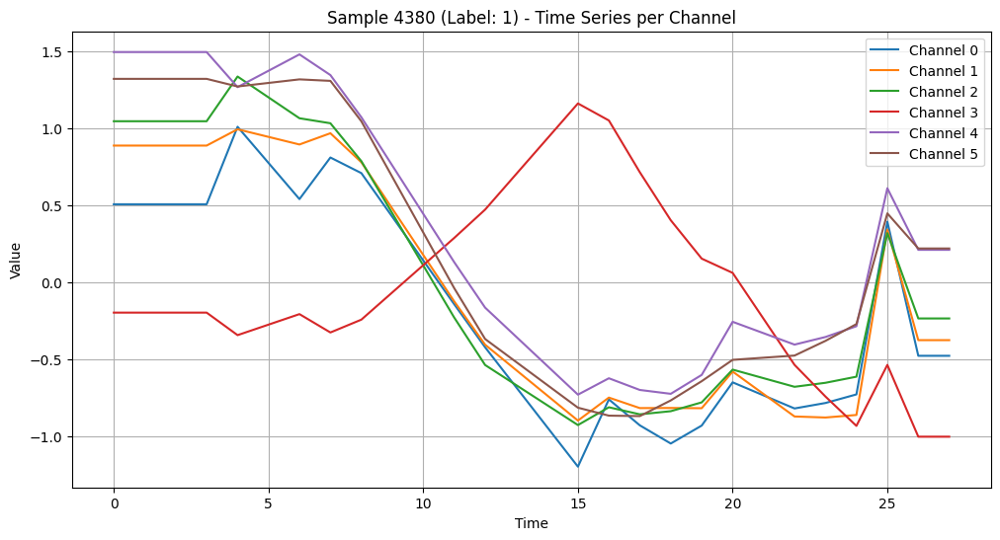

In [330]:
i = np.random.randint(0, len(X))
sample = X[i]  # Shape: (6, T)

plt.figure(figsize=(12, 6))
for c in range(6):
    plt.plot(sample[c], label=f'Channel {c}')
plt.title(f"Sample {i} (Label: {y[i]}) - Time Series per Channel")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

# Dataloader

In [331]:
class Dataset():
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __getitem__(self, index):
        return {
            "x": self.X[index],  # shape: [C, T]
            "y": self.y[index]
        }

    def __len__(self):
        return len(self.X)

In [332]:
labeled_dataset = Dataset(X_labeled, y_labeled)
unlabeled_dataset = Dataset(X_unlabeled, y_unlabeled)
val_dataset = Dataset(X_val, y_val)

# Model

In [333]:
################ CNN Backbone 
def conv_block(in_channels: int, out_channels: int) -> nn.Module:
    return nn.Sequential(
        nn.Conv1d(in_channels, out_channels, 5,padding='same'),
        nn.BatchNorm1d(out_channels),
        nn.ReLU(),
    )
 
class cnn(nn.Module):
    def __init__(self):
        super(cnn, self).__init__()
        self.conv1 = conv_block(6, 64)
        self.conv2 = conv_block(64, 128)
        self.conv3 = conv_block(128, 256)
        self.conv4 = conv_block(256, 512)
        self.conv5 = conv_block(512, 1024)
        self.global_pool = nn.AdaptiveAvgPool1d((1))
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x=self.global_pool(x)
        x = x.view(x.size(0), -1)
        return x
 
################ Fully connected network
class FC(nn.Module):
    def __init__(self,input_dim):
        super(FC, self).__init__()
        self.fco = nn.Linear(input_dim, 3)
    def forward(self, x):
        x=self.fco(x)
        return x


class FullModel(nn.Module):
    def __init__(self, backbone, fc):
        super().__init__()
        self.backbone = backbone
        self.fc = fc

    def forward(self, x):
        feat = self.backbone(x)
        out = self.fc(feat)
        return feat, out

# Loading weights

In [334]:
#pretrained weights
map_location=torch.device(device)

backbone = cnn()
fc = FC(1024)

#loading backbone weights
state_dict = torch.load('/kaggle/input/active-learning-subset/backboneSiteA2019.pth', map_location=map_location)
# Remove "module." prefix
new_state_dict = {}
for k, v in state_dict.items():
    new_key = k.replace("module.", "")  # remove module. prefix
    new_state_dict[new_key] = v

backbone.load_state_dict(new_state_dict)

#loading fc weights
state_dict = torch.load('/kaggle/input/active-learning-subset/fcSiteA2019.pth', map_location=map_location)
# Remove "module." prefix
new_state_dict = {}
for k, v in state_dict.items():
    new_key = k.replace("module.", "")  # remove module. prefix
    new_state_dict[new_key] = v

fc.load_state_dict(new_state_dict)

model = FullModel(backbone, fc).to(device)

# Train/eval loop

In [335]:
def train_one_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss, all_preds, all_targets = 0, [], []

    for batch in dataloader:
        x, y = batch["x"].to(device), batch["y"].to(device)

        optimizer.zero_grad()
        _, out = model(x)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * len(x)
        preds = torch.argmax(out, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(y.cpu().numpy())

    avg_loss = total_loss / len(dataloader.dataset)
    acc = np.mean(np.array(all_preds) == np.array(all_targets))
    f1s = sklearn.metrics.f1_score(all_targets, all_preds, average=None)
    return avg_loss, acc, f1s, np.mean(f1s)



def _eval_perf(model, dataloader, device, criterion=None):
    model.eval()
    pred, gt = [], []
    total_loss = 0

    with torch.no_grad():
        for batch in dataloader:
            x, y = batch["x"].to(device), batch["y"].to(device)
            _, outputs = model(x)
            preds = torch.argmax(outputs, dim=1)
            if criterion:
                total_loss += criterion(outputs, y).item() * len(x)

            pred.extend(preds.cpu().numpy())
            gt.extend(y.cpu().numpy())

    acc = np.mean(np.array(pred) == np.array(gt))
    f1s = sklearn.metrics.f1_score(gt, pred, average=None)
    avg_f1 = np.mean(f1s)

    if criterion:
        avg_loss = total_loss / len(dataloader.dataset)
        return avg_loss, f1s, acc, avg_f1
    else:
        return 0, f1s, acc, avg_f1



# Active Learning methods

In [336]:
def plot_round_metrics(history):
    round_id = len(history["epoch_metrics"]) - 1
    epoch_stats = history["epoch_metrics"][round_id]
    epochs = list(range(1, len(epoch_stats) + 1))

    train_loss = [e["train_loss"] for e in epoch_stats]
    val_loss = [e["val_loss"] for e in epoch_stats]
    train_acc = [e["train_acc"] for e in epoch_stats]
    train_f1 = [e["train_avg_f1"] for e in epoch_stats]
    val_acc = [e["val_acc"] for e in epoch_stats]
    val_f1 = [e["val_avg_f1"] for e in epoch_stats]

    plt.figure(figsize=(15, 4))

    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(epochs, train_loss, label="Train Loss")
    plt.plot(epochs, val_loss, label="Val Loss")
    plt.title(f"[Round {round_id+1}] Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # Accuracy plot
    plt.subplot(1, 3, 2)
    plt.plot(epochs, train_acc, label="Train Acc")
    plt.plot(epochs, val_acc, label="Val Acc")
    plt.title(f"[Round {round_id+1}] Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    # Avg F1 plot
    plt.subplot(1, 3, 3)
    plt.plot(epochs, train_f1, label="Train F1")
    plt.plot(epochs, val_f1, label="Val F1")
    plt.title(f"[Round {round_id+1}] Avg F1")
    plt.xlabel("Epoch")
    plt.ylabel("Avg F1")
    plt.legend()

    plt.tight_layout()
    plt.show()



def plot_final_performance(history):
    samples = history["samples"]
    val_acc = history["round_val_acc"]
    val_f1 = history["round_val_avg_f1"]

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(samples, val_acc, marker='o')
    plt.title("Val Accuracy vs Labeled Samples")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Accuracy")

    plt.subplot(1, 2, 2)
    plt.plot(samples, val_f1, marker='o')
    plt.title("Val Avg F1 vs Labeled Samples")
    plt.xlabel("Labeled Samples")
    plt.ylabel("Avg F1")

    plt.tight_layout()
    plt.show()


In [337]:
def query_samples(model, dataset, query_size, strategy, device):
    model.eval()
    dataloader = DataLoader(dataset, batch_size=128)
    all_scores = []

    with torch.no_grad():
        for batch in dataloader:
            x = batch["x"].to(device)
            _, out = model(x)
            probs = F.softmax(out, dim=1)

            if strategy == "entropy":
                score = -torch.sum(probs * torch.log(probs + 1e-10), dim=1)
            elif strategy == "least_confident":
                score = 1 - probs.max(dim=1)[0]
            elif strategy == "margin":
                sorted_probs, _ = probs.sort(dim=1, descending=True)
                score = sorted_probs[:, 0] - sorted_probs[:, 1]
                score = -score
            elif strategy == "random":
                score = torch.rand(len(x), device=device)
            else:
                raise ValueError(f"Unknown strategy {strategy}")
            
            all_scores.extend(score.cpu().numpy())

    indices = np.argsort(all_scores)[-query_size:]
    return indices


# Active Learning Loop

In [338]:
def active_learning_loop(initial_model, labeled_dataset, unlabeled_dataset, val_dataset, strategy, device, iters=10, query_size=100, epochs=5):
    criterion = nn.CrossEntropyLoss()

    history = {
        "strategy": strategy,
        "samples": [],
        "epoch_metrics": [],
        "round_val_acc": [],
        "round_val_avg_f1": []
    }

    for it in range(iters):
        print(f"\n[AL Round {it+1}/{iters}] — Labeled samples: {len(labeled_dataset)}")

        # Cold start: reset model and optimizer
        model = copy.deepcopy(initial_model).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

        train_loader = DataLoader(labeled_dataset, batch_size=64, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=64)

        epoch_stats = []

        for ep in tqdm(range(epochs), desc="Epoch", leave=False):
            tr_loss, tr_acc, tr_f1s, tr_avgf1 = train_one_epoch(model, train_loader, optimizer, criterion, device)
            val_loss, val_f1s, val_acc, val_avgf1 = _eval_perf(model, val_loader, device, criterion)

            epoch_stats.append({
                "train_loss": tr_loss,
                "train_acc": tr_acc,
                "train_avg_f1": tr_avgf1,
                "val_loss": val_loss,
                "val_acc": val_acc,
                "val_avg_f1": val_avgf1
            })

        history["samples"].append(len(labeled_dataset))
        history["epoch_metrics"].append(epoch_stats)
        history["round_val_acc"].append(val_acc)
        history["round_val_avg_f1"].append(val_avgf1)

        # Query next samples
        if len(unlabeled_dataset) < query_size:
            print("Unlabeled pool exhausted.")
            break

        selected_idxs = query_samples(model, unlabeled_dataset, query_size, strategy, device)

        new_x = [unlabeled_dataset.X[i] for i in selected_idxs]
        new_y = [unlabeled_dataset.y[i] for i in selected_idxs]

        labeled_dataset.X = torch.cat([labeled_dataset.X, torch.stack(new_x)], dim=0)
        labeled_dataset.y = torch.cat([labeled_dataset.y, torch.tensor(new_y)], dim=0)

        keep_idxs = list(set(range(len(unlabeled_dataset))) - set(selected_idxs))
        unlabeled_dataset.X = torch.stack([unlabeled_dataset.X[i] for i in keep_idxs])
        unlabeled_dataset.y = torch.tensor([unlabeled_dataset.y[i] for i in keep_idxs])

        print(f"\nEpoch {epochs}/{epochs}")
        print(f"Train — Loss: {tr_loss:.4f} | Acc: {tr_acc:.4f} | Avg F1: {tr_avgf1:.4f}")
        print(f"Val   — Loss: {val_loss:.4f} | Acc: {val_acc:.4f} | Avg F1: {val_avgf1:.4f}")

        
        plot_round_metrics(history)

    plot_final_performance(history)
    return history



=== Running strategy: ENTROPY ===

[AL Round 1/50] — Labeled samples: 20



Epoch 10/10
Train — Loss: 0.0093 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 4.8349 | Acc: 0.3538 | Avg F1: 0.3509


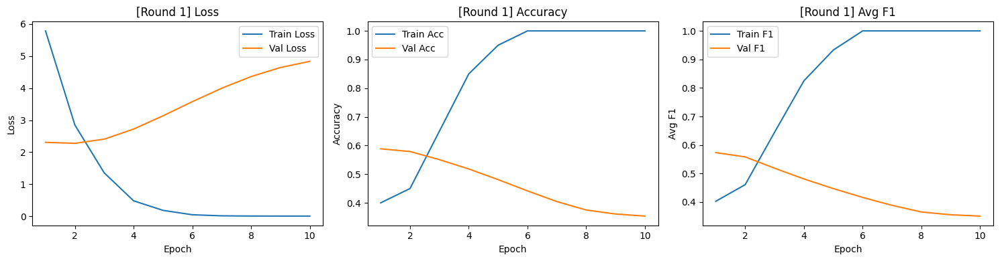


[AL Round 2/50] — Labeled samples: 40



Epoch 10/10
Train — Loss: 0.0085 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 5.6070 | Acc: 0.4280 | Avg F1: 0.4198


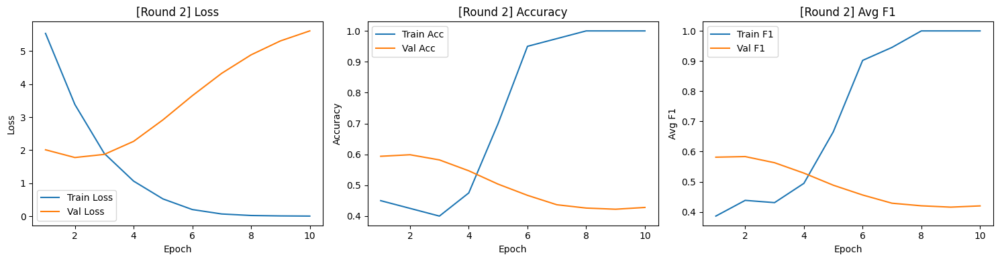


[AL Round 3/50] — Labeled samples: 60



Epoch 10/10
Train — Loss: 0.0526 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 6.1268 | Acc: 0.4300 | Avg F1: 0.4183


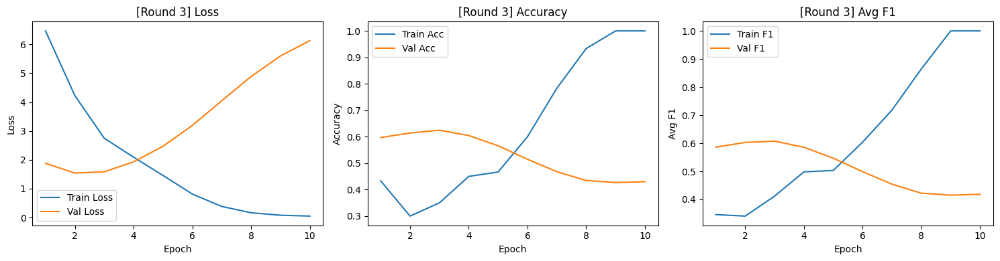


[AL Round 4/50] — Labeled samples: 80



Epoch 10/10
Train — Loss: 0.1230 | Acc: 0.9625 | Avg F1: 0.8927
Val   — Loss: 6.0299 | Acc: 0.5533 | Avg F1: 0.5210


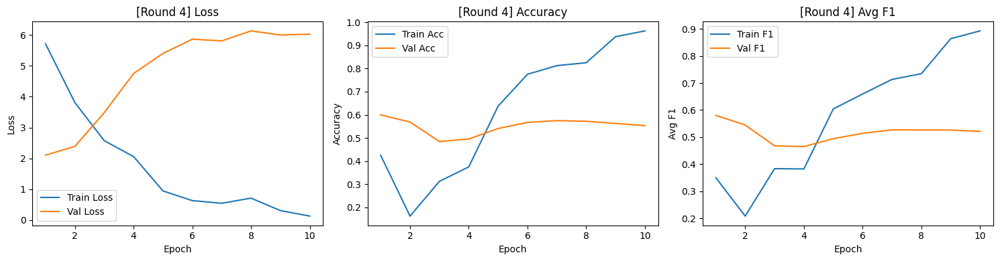


[AL Round 5/50] — Labeled samples: 100



Epoch 10/10
Train — Loss: 0.1050 | Acc: 0.9800 | Avg F1: 0.9288
Val   — Loss: 5.8234 | Acc: 0.5553 | Avg F1: 0.5272


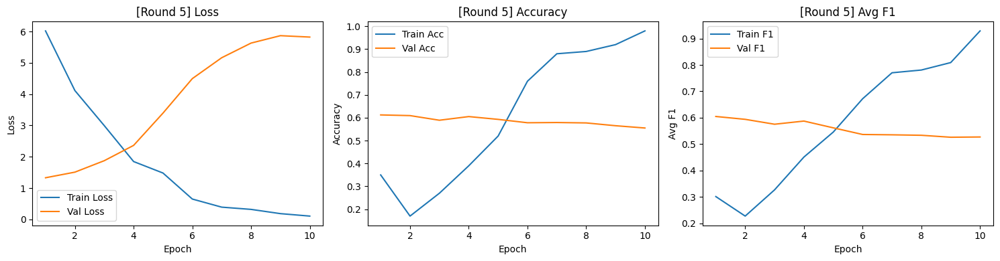


[AL Round 6/50] — Labeled samples: 120



Epoch 10/10
Train — Loss: 0.1037 | Acc: 0.9750 | Avg F1: 0.9035
Val   — Loss: 5.6260 | Acc: 0.5385 | Avg F1: 0.5132


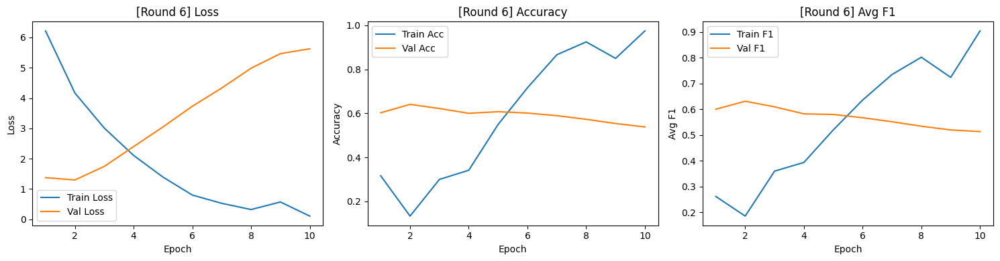


[AL Round 7/50] — Labeled samples: 140



Epoch 10/10
Train — Loss: 0.2451 | Acc: 0.9143 | Avg F1: 0.7767
Val   — Loss: 6.4609 | Acc: 0.4800 | Avg F1: 0.4747


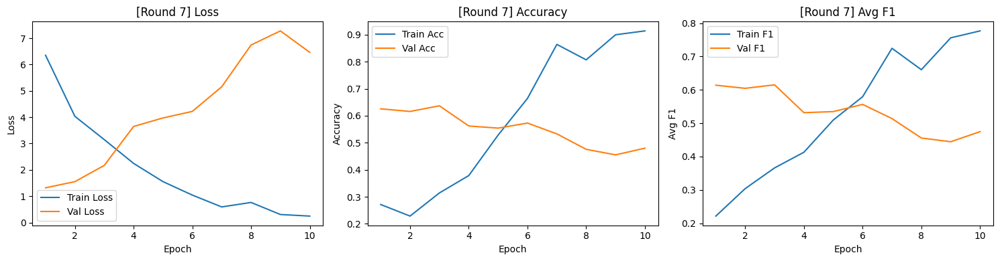


[AL Round 8/50] — Labeled samples: 160



Epoch 10/10
Train — Loss: 0.2404 | Acc: 0.9125 | Avg F1: 0.7699
Val   — Loss: 7.5349 | Acc: 0.3860 | Avg F1: 0.3907


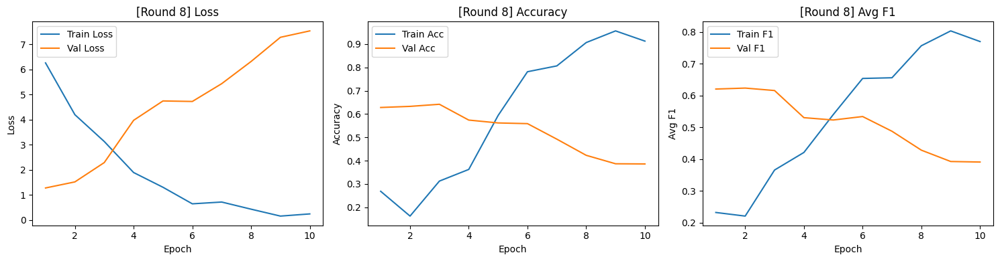


[AL Round 9/50] — Labeled samples: 180



Epoch 10/10
Train — Loss: 0.1941 | Acc: 0.9722 | Avg F1: 0.8780
Val   — Loss: 6.9082 | Acc: 0.4848 | Avg F1: 0.4707


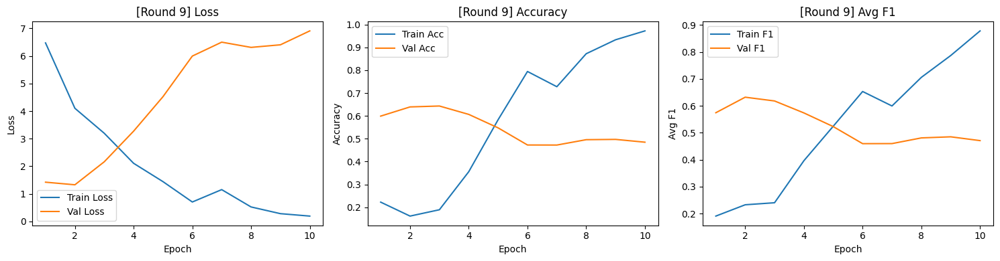


[AL Round 10/50] — Labeled samples: 200



Epoch 10/10
Train — Loss: 0.2649 | Acc: 0.9100 | Avg F1: 0.7578
Val   — Loss: 4.5716 | Acc: 0.4815 | Avg F1: 0.4870


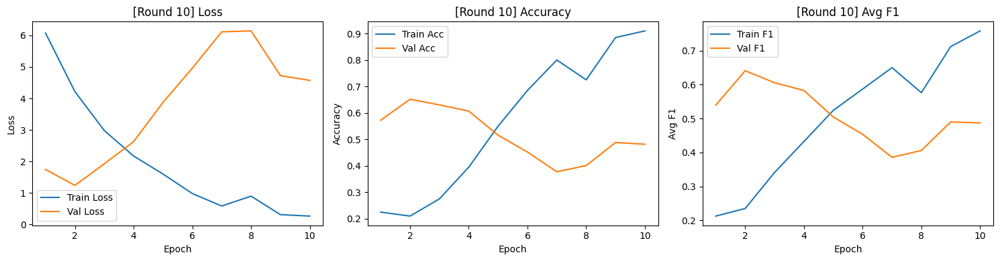


[AL Round 11/50] — Labeled samples: 220



Epoch 10/10
Train — Loss: 0.0892 | Acc: 0.9864 | Avg F1: 0.9377
Val   — Loss: 6.5896 | Acc: 0.4650 | Avg F1: 0.4592


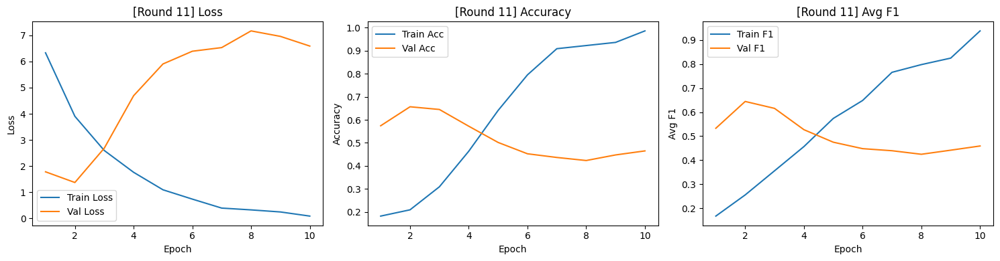


[AL Round 12/50] — Labeled samples: 240



Epoch 10/10
Train — Loss: 0.0993 | Acc: 0.9917 | Avg F1: 0.9427
Val   — Loss: 6.9022 | Acc: 0.4825 | Avg F1: 0.4753


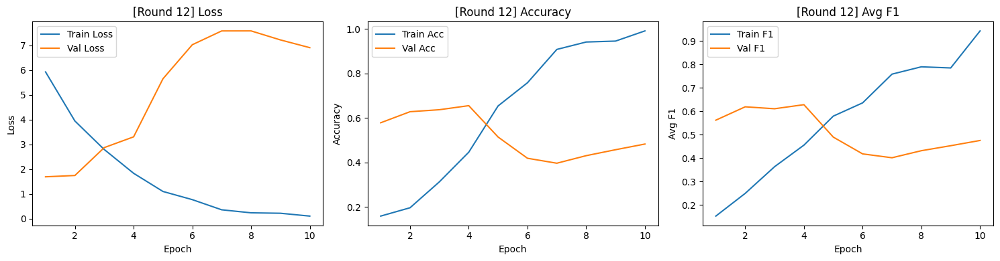


[AL Round 13/50] — Labeled samples: 260



Epoch 10/10
Train — Loss: 0.2870 | Acc: 0.9154 | Avg F1: 0.7620
Val   — Loss: 4.3704 | Acc: 0.4178 | Avg F1: 0.4210


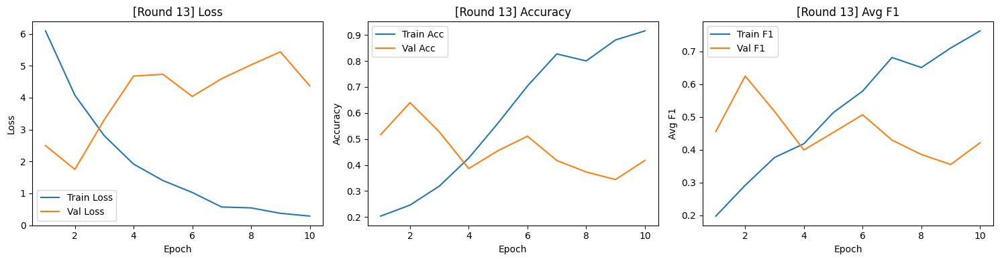


[AL Round 14/50] — Labeled samples: 280



Epoch 10/10
Train — Loss: 0.2122 | Acc: 0.9393 | Avg F1: 0.8058
Val   — Loss: 3.4438 | Acc: 0.6472 | Avg F1: 0.6162


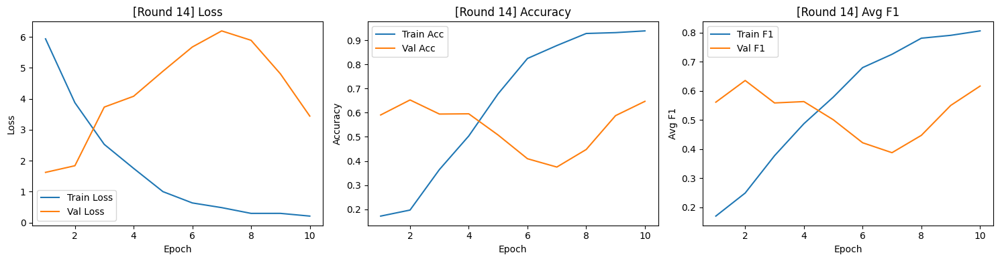


[AL Round 15/50] — Labeled samples: 300



Epoch 10/10
Train — Loss: 0.1118 | Acc: 0.9767 | Avg F1: 0.8920
Val   — Loss: 4.0702 | Acc: 0.5655 | Avg F1: 0.5625


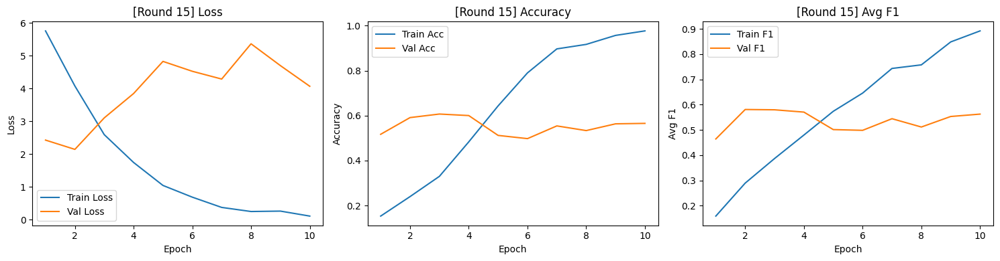


[AL Round 16/50] — Labeled samples: 320



Epoch 10/10
Train — Loss: 0.2198 | Acc: 0.9062 | Avg F1: 0.7134
Val   — Loss: 2.5723 | Acc: 0.6585 | Avg F1: 0.6406


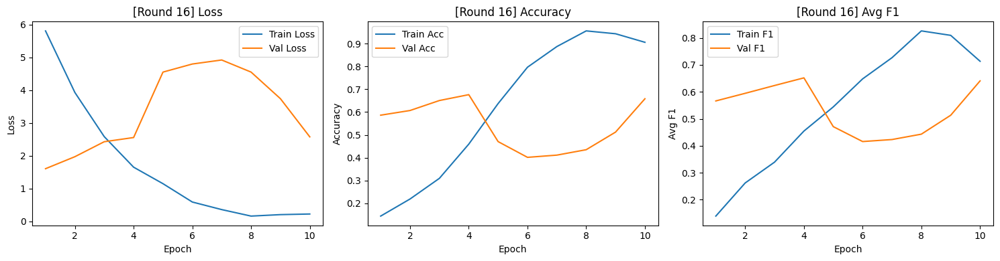


[AL Round 17/50] — Labeled samples: 340



Epoch 10/10
Train — Loss: 0.1196 | Acc: 0.9794 | Avg F1: 0.8821
Val   — Loss: 3.4661 | Acc: 0.5843 | Avg F1: 0.5786


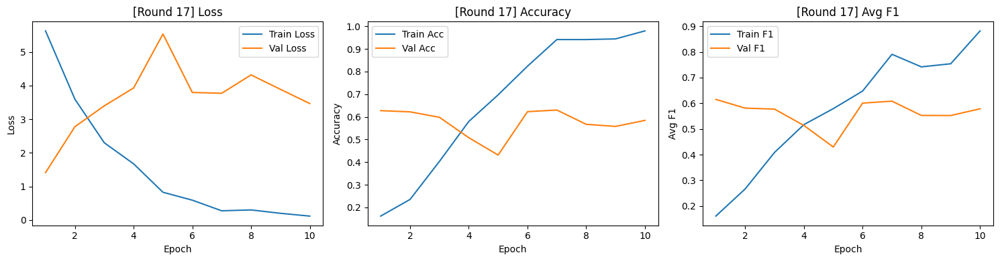


[AL Round 18/50] — Labeled samples: 360



Epoch 10/10
Train — Loss: 0.0825 | Acc: 0.9806 | Avg F1: 0.9153
Val   — Loss: 2.5447 | Acc: 0.6472 | Avg F1: 0.6317


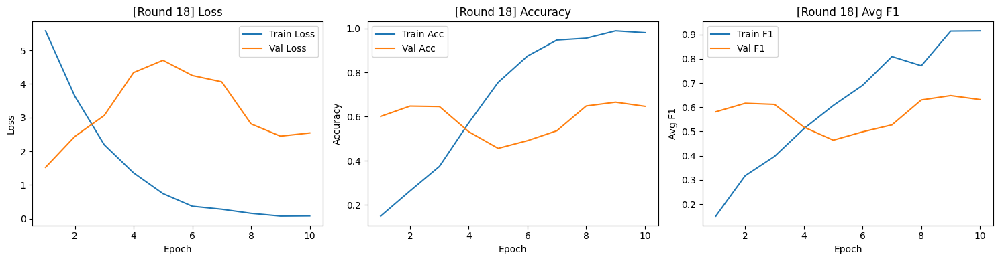


[AL Round 19/50] — Labeled samples: 380



Epoch 10/10
Train — Loss: 0.0796 | Acc: 0.9895 | Avg F1: 0.9024
Val   — Loss: 4.3699 | Acc: 0.6208 | Avg F1: 0.5978


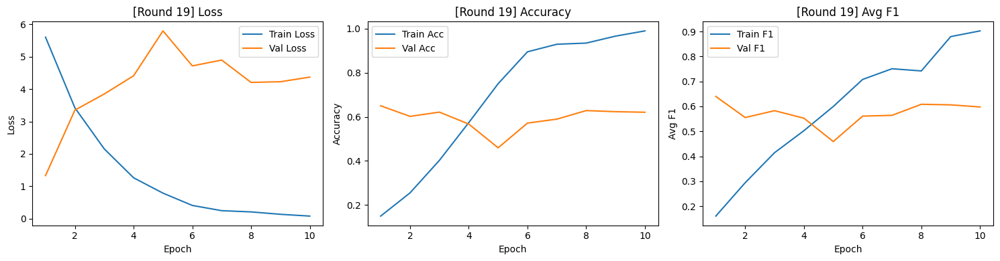


[AL Round 20/50] — Labeled samples: 400



Epoch 10/10
Train — Loss: 0.0998 | Acc: 0.9825 | Avg F1: 0.9167
Val   — Loss: 3.0589 | Acc: 0.6580 | Avg F1: 0.6381


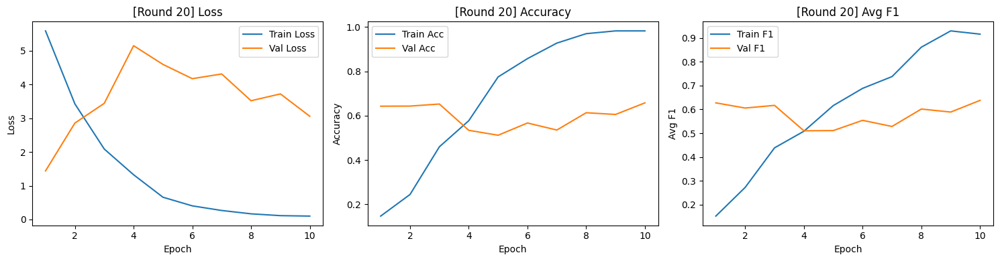


[AL Round 21/50] — Labeled samples: 420



Epoch 10/10
Train — Loss: 0.0594 | Acc: 0.9952 | Avg F1: 0.9751
Val   — Loss: 2.7949 | Acc: 0.6797 | Avg F1: 0.6570


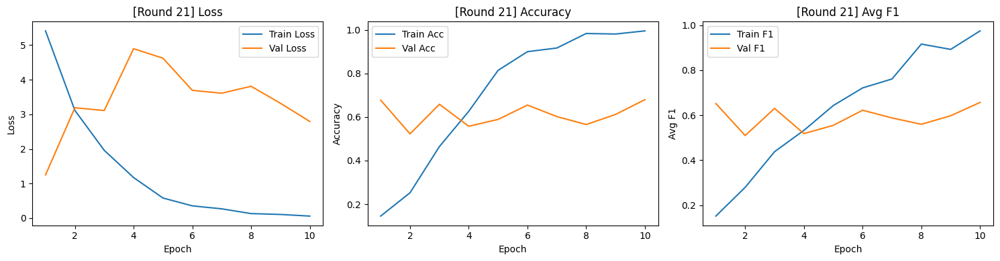


[AL Round 22/50] — Labeled samples: 440



Epoch 10/10
Train — Loss: 0.0664 | Acc: 0.9955 | Avg F1: 0.9573
Val   — Loss: 2.1438 | Acc: 0.7003 | Avg F1: 0.6745


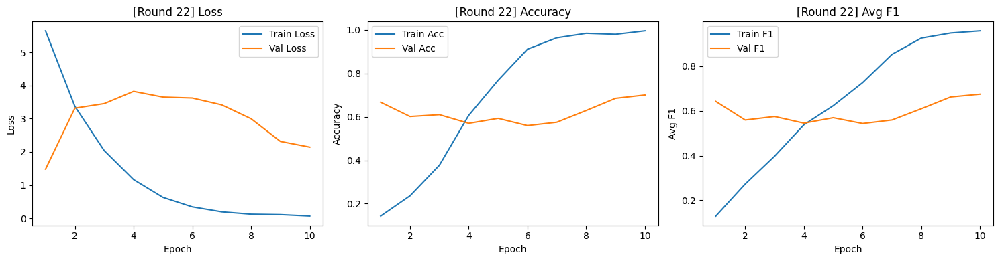


[AL Round 23/50] — Labeled samples: 460



Epoch 10/10
Train — Loss: 0.1580 | Acc: 0.9587 | Avg F1: 0.8592
Val   — Loss: 1.4973 | Acc: 0.7535 | Avg F1: 0.7264


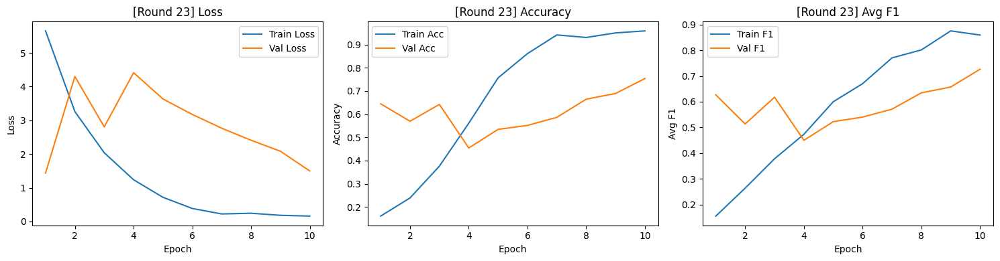


[AL Round 24/50] — Labeled samples: 480



Epoch 10/10
Train — Loss: 0.0594 | Acc: 0.9875 | Avg F1: 0.9501
Val   — Loss: 1.4188 | Acc: 0.7460 | Avg F1: 0.7200


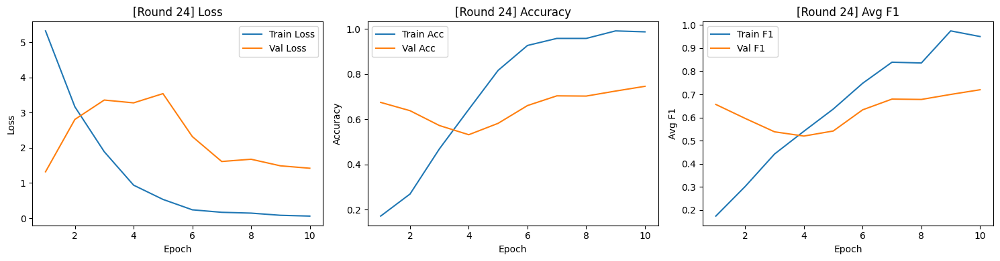


[AL Round 25/50] — Labeled samples: 500



Epoch 10/10
Train — Loss: 0.0826 | Acc: 0.9920 | Avg F1: 0.9931
Val   — Loss: 1.6821 | Acc: 0.7438 | Avg F1: 0.7155


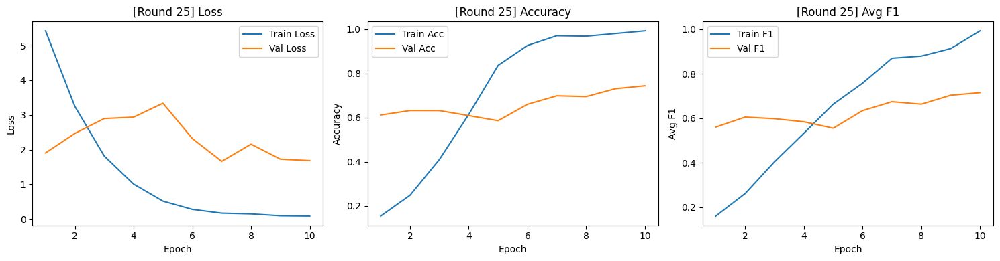


[AL Round 26/50] — Labeled samples: 520



Epoch 10/10
Train — Loss: 0.1605 | Acc: 0.9615 | Avg F1: 0.8742
Val   — Loss: 1.8549 | Acc: 0.7113 | Avg F1: 0.6822


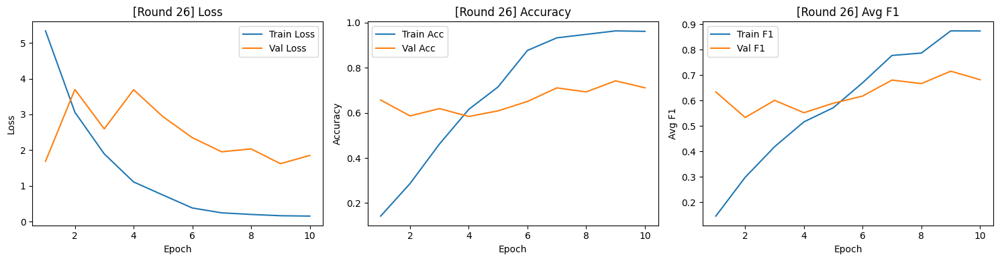


[AL Round 27/50] — Labeled samples: 540



Epoch 10/10
Train — Loss: 0.1493 | Acc: 0.9500 | Avg F1: 0.8327
Val   — Loss: 1.0596 | Acc: 0.7905 | Avg F1: 0.7672


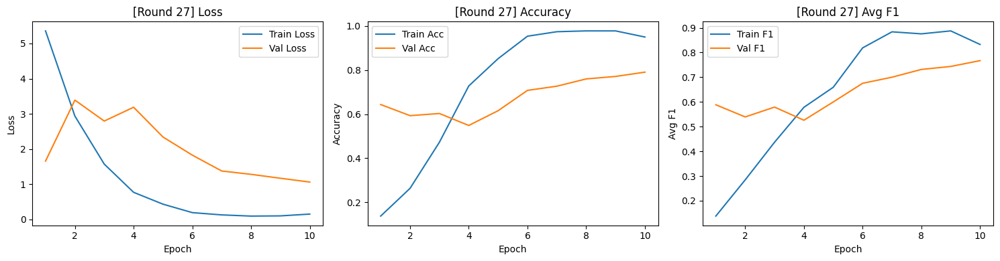


[AL Round 28/50] — Labeled samples: 560



Epoch 10/10
Train — Loss: 0.0766 | Acc: 0.9875 | Avg F1: 0.9072
Val   — Loss: 1.2842 | Acc: 0.7672 | Avg F1: 0.7397


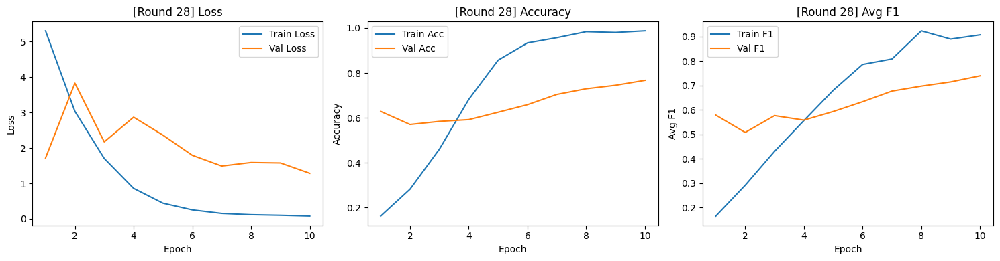


[AL Round 29/50] — Labeled samples: 580



Epoch 10/10
Train — Loss: 0.2003 | Acc: 0.9379 | Avg F1: 0.8520
Val   — Loss: 1.1661 | Acc: 0.7580 | Avg F1: 0.7323


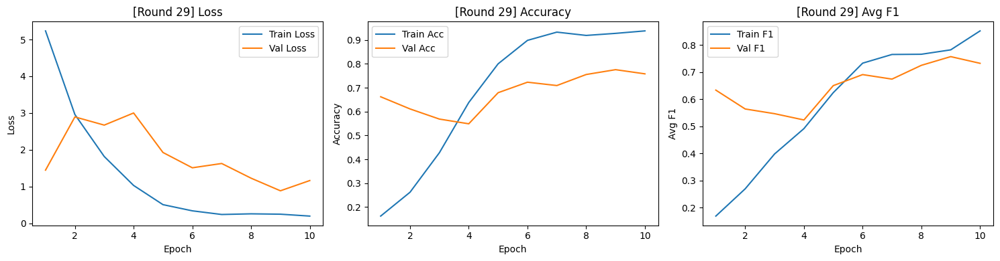


[AL Round 30/50] — Labeled samples: 600



Epoch 10/10
Train — Loss: 0.0760 | Acc: 0.9850 | Avg F1: 0.9247
Val   — Loss: 0.9526 | Acc: 0.7810 | Avg F1: 0.7572


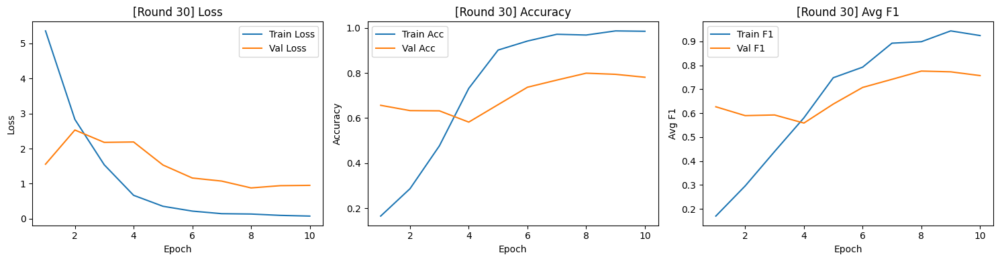


[AL Round 31/50] — Labeled samples: 620



Epoch 10/10
Train — Loss: 0.0831 | Acc: 0.9887 | Avg F1: 0.9459
Val   — Loss: 0.9789 | Acc: 0.7805 | Avg F1: 0.7537


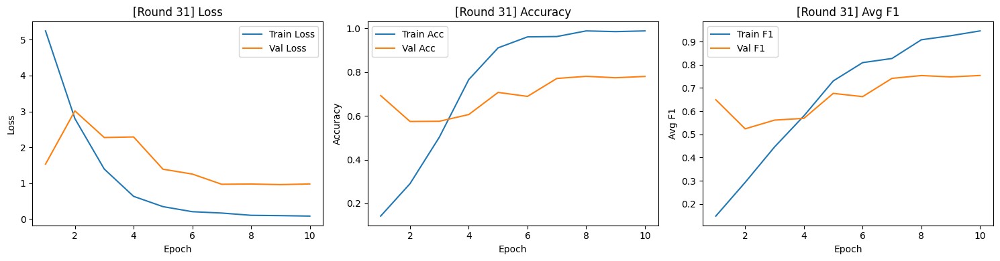


[AL Round 32/50] — Labeled samples: 640



Epoch 10/10
Train — Loss: 0.0698 | Acc: 0.9906 | Avg F1: 0.9292
Val   — Loss: 0.8207 | Acc: 0.7995 | Avg F1: 0.7736


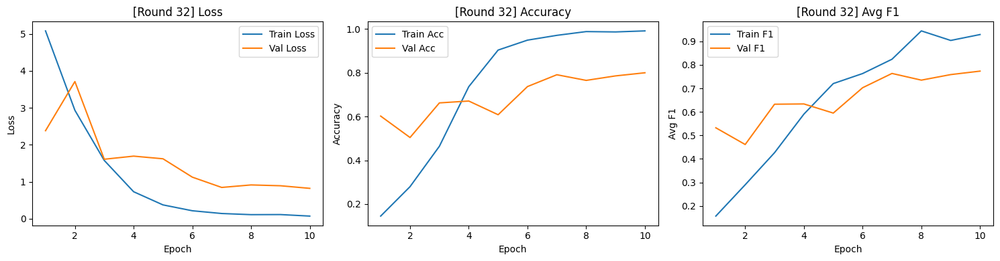


[AL Round 33/50] — Labeled samples: 660



Epoch 10/10
Train — Loss: 0.0869 | Acc: 0.9894 | Avg F1: 0.9392
Val   — Loss: 0.7185 | Acc: 0.8200 | Avg F1: 0.7960


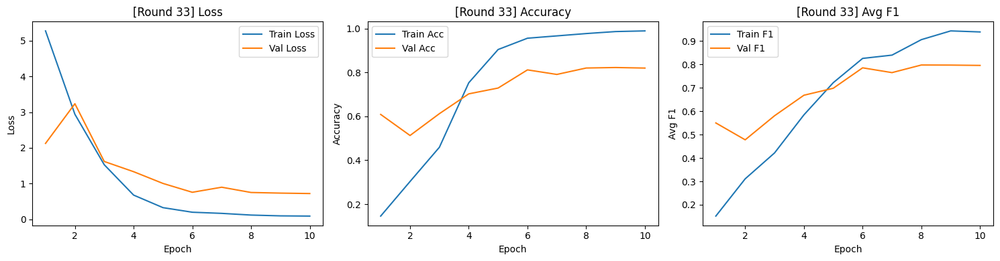


[AL Round 34/50] — Labeled samples: 680



Epoch 10/10
Train — Loss: 0.0728 | Acc: 0.9882 | Avg F1: 0.9152
Val   — Loss: 0.7465 | Acc: 0.8235 | Avg F1: 0.8031


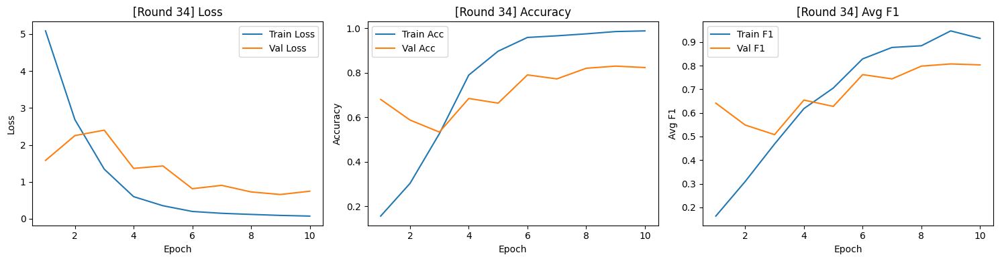


[AL Round 35/50] — Labeled samples: 700



Epoch 10/10
Train — Loss: 0.0783 | Acc: 0.9871 | Avg F1: 0.9372
Val   — Loss: 0.7375 | Acc: 0.8117 | Avg F1: 0.7888


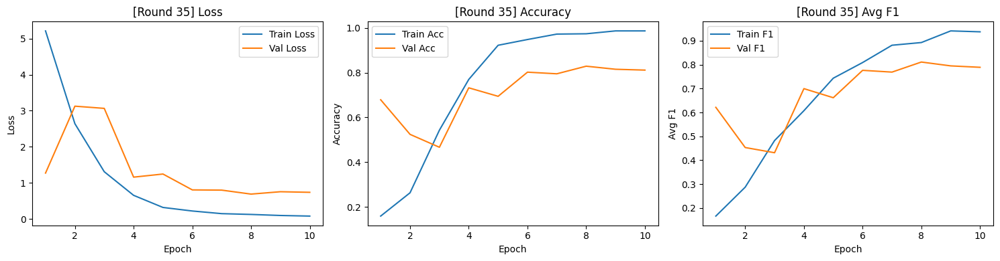


[AL Round 36/50] — Labeled samples: 720



Epoch 10/10
Train — Loss: 0.0986 | Acc: 0.9819 | Avg F1: 0.9183
Val   — Loss: 0.6694 | Acc: 0.8307 | Avg F1: 0.8081


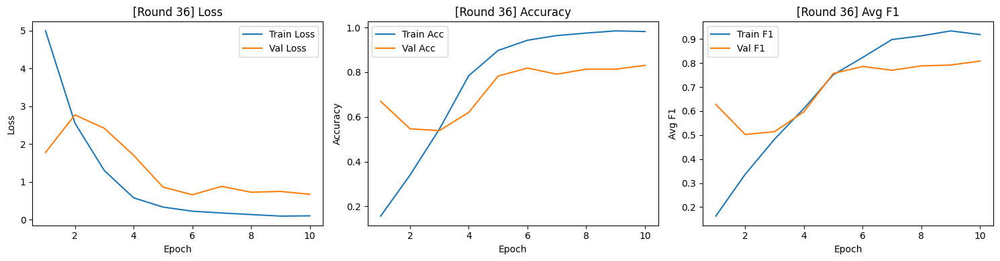


[AL Round 37/50] — Labeled samples: 740



Epoch 10/10
Train — Loss: 0.0831 | Acc: 0.9865 | Avg F1: 0.9571
Val   — Loss: 0.7199 | Acc: 0.8370 | Avg F1: 0.8227


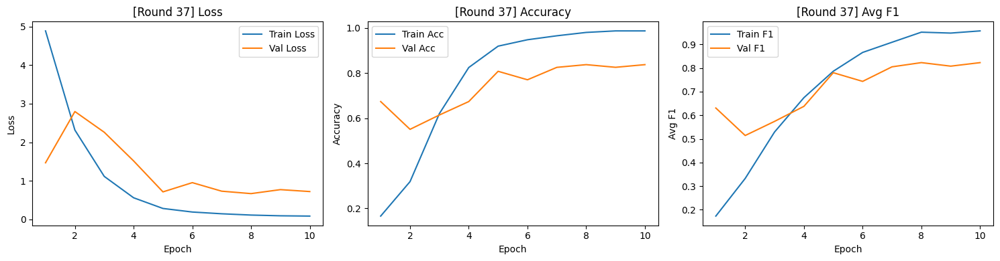


[AL Round 38/50] — Labeled samples: 760



Epoch 10/10
Train — Loss: 0.0713 | Acc: 0.9921 | Avg F1: 0.9800
Val   — Loss: 0.8033 | Acc: 0.8285 | Avg F1: 0.8150


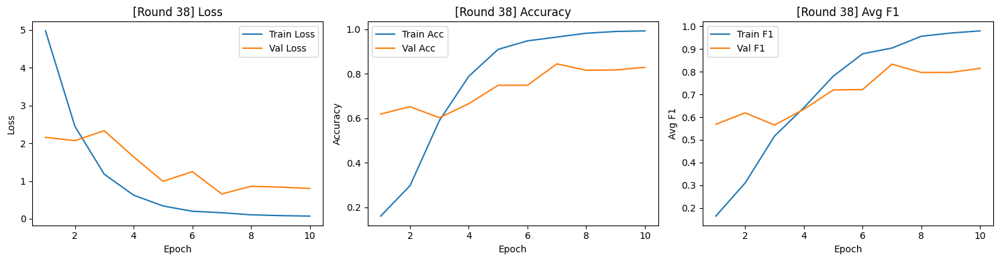


[AL Round 39/50] — Labeled samples: 780



Epoch 10/10
Train — Loss: 0.1567 | Acc: 0.9538 | Avg F1: 0.9096
Val   — Loss: 0.6886 | Acc: 0.8498 | Avg F1: 0.8431


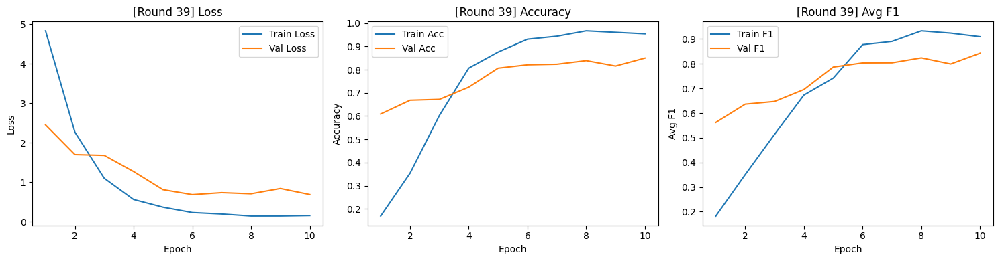


[AL Round 40/50] — Labeled samples: 800



Epoch 10/10
Train — Loss: 0.0628 | Acc: 0.9950 | Avg F1: 0.9850
Val   — Loss: 0.6654 | Acc: 0.8485 | Avg F1: 0.8360


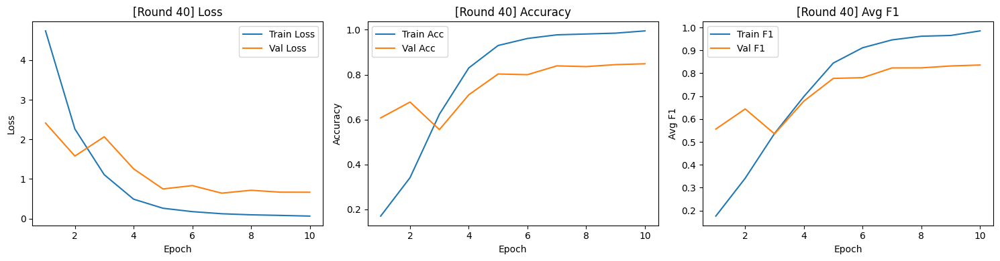


[AL Round 41/50] — Labeled samples: 820



Epoch 10/10
Train — Loss: 0.0877 | Acc: 0.9927 | Avg F1: 0.9789
Val   — Loss: 0.6211 | Acc: 0.8488 | Avg F1: 0.8401


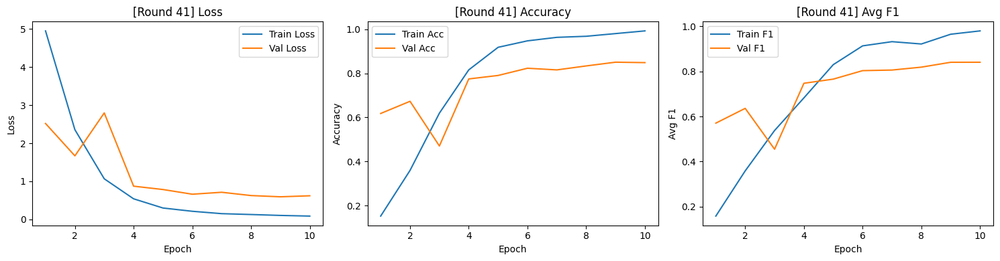


[AL Round 42/50] — Labeled samples: 840



Epoch 10/10
Train — Loss: 0.1096 | Acc: 0.9798 | Avg F1: 0.9627
Val   — Loss: 0.6550 | Acc: 0.8285 | Avg F1: 0.8204


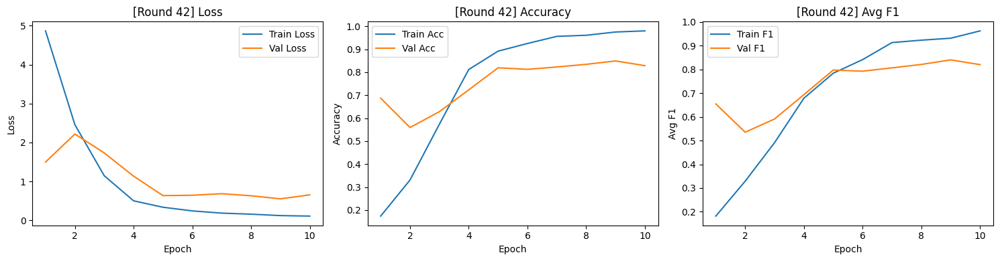


[AL Round 43/50] — Labeled samples: 860



Epoch 10/10
Train — Loss: 0.0771 | Acc: 0.9919 | Avg F1: 0.9796
Val   — Loss: 0.5829 | Acc: 0.8605 | Avg F1: 0.8517


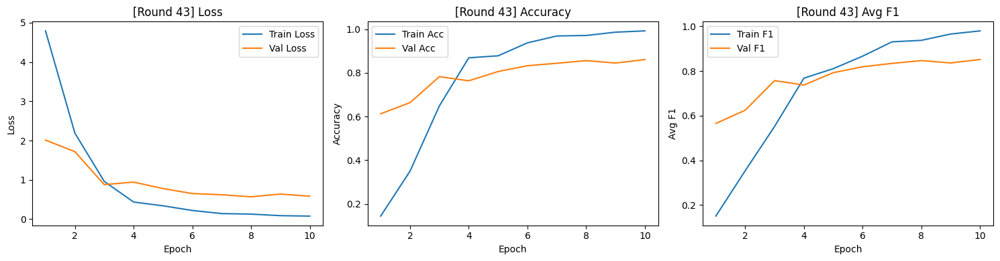


[AL Round 44/50] — Labeled samples: 880



Epoch 10/10
Train — Loss: 0.0790 | Acc: 0.9898 | Avg F1: 0.9698
Val   — Loss: 0.6198 | Acc: 0.8488 | Avg F1: 0.8392


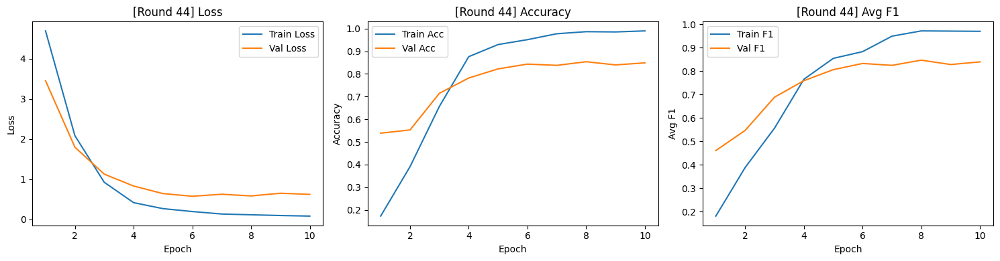


[AL Round 45/50] — Labeled samples: 900



Epoch 10/10
Train — Loss: 0.1440 | Acc: 0.9578 | Avg F1: 0.9033
Val   — Loss: 0.5763 | Acc: 0.8435 | Avg F1: 0.8331


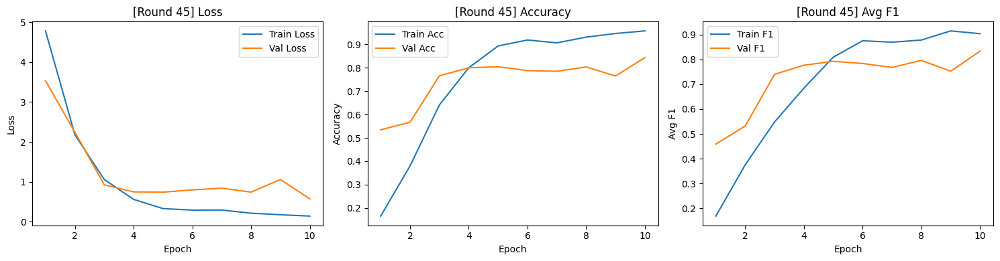


[AL Round 46/50] — Labeled samples: 920



Epoch 10/10
Train — Loss: 0.0791 | Acc: 0.9880 | Avg F1: 0.9784
Val   — Loss: 0.6139 | Acc: 0.8518 | Avg F1: 0.8416


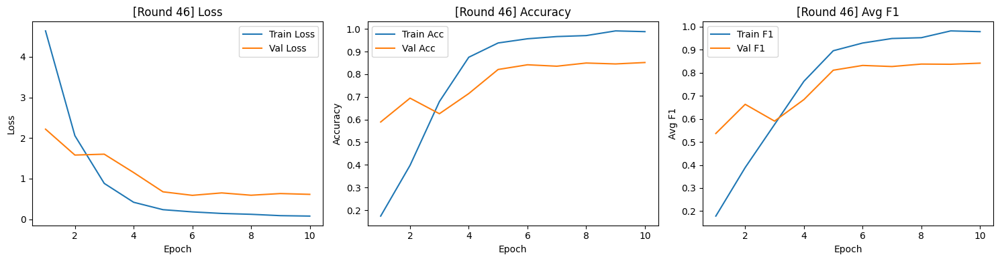


[AL Round 47/50] — Labeled samples: 940



Epoch 10/10
Train — Loss: 0.0763 | Acc: 0.9915 | Avg F1: 0.9855
Val   — Loss: 0.6098 | Acc: 0.8450 | Avg F1: 0.8348


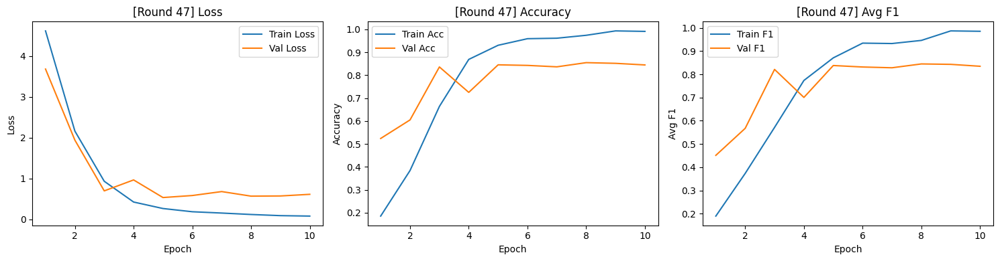


[AL Round 48/50] — Labeled samples: 960



Epoch 10/10
Train — Loss: 0.0779 | Acc: 0.9917 | Avg F1: 0.9822
Val   — Loss: 0.5952 | Acc: 0.8598 | Avg F1: 0.8510


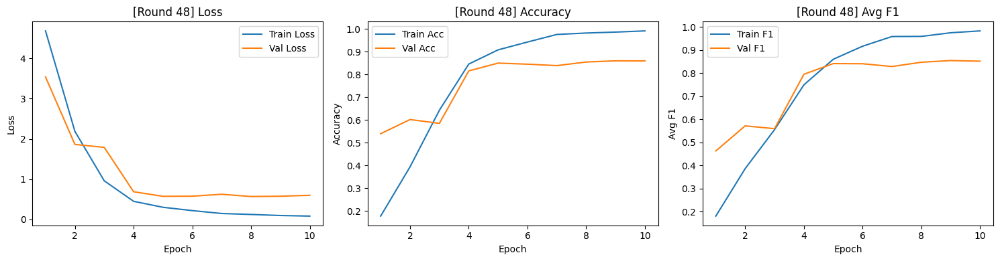


[AL Round 49/50] — Labeled samples: 980



Epoch 10/10
Train — Loss: 0.0939 | Acc: 0.9827 | Avg F1: 0.9749
Val   — Loss: 0.5849 | Acc: 0.8578 | Avg F1: 0.8490


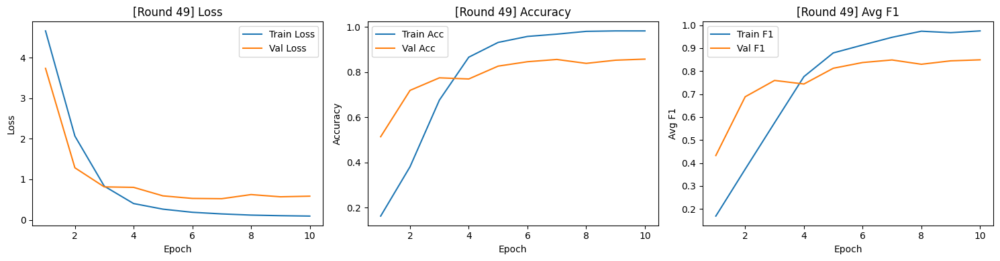


[AL Round 50/50] — Labeled samples: 1000



Epoch 10/10
Train — Loss: 0.0774 | Acc: 0.9910 | Avg F1: 0.9788
Val   — Loss: 0.5957 | Acc: 0.8542 | Avg F1: 0.8510


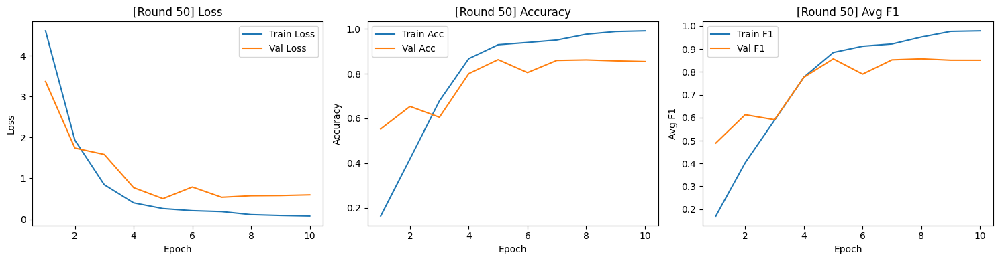

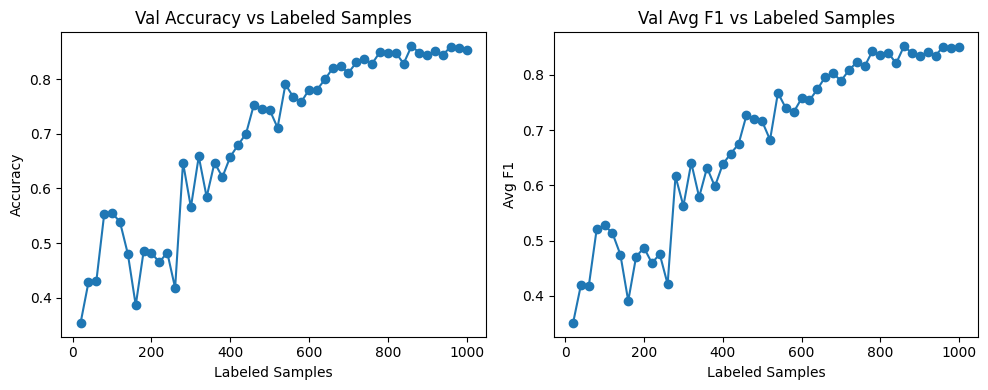


=== Running strategy: LEAST_CONFIDENT ===

[AL Round 1/50] — Labeled samples: 20



Epoch 10/10
Train — Loss: 0.0093 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 4.8407 | Acc: 0.3518 | Avg F1: 0.3489


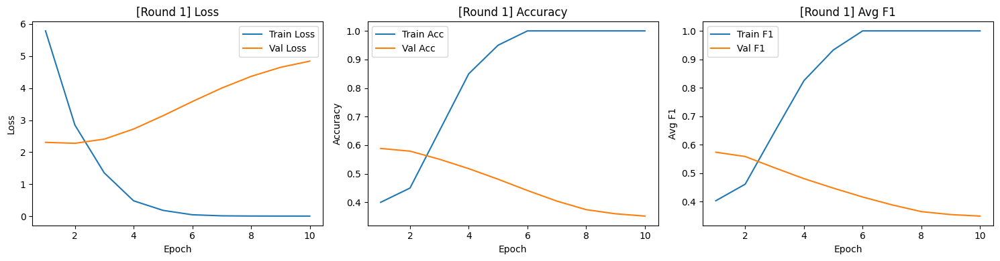


[AL Round 2/50] — Labeled samples: 40



Epoch 10/10
Train — Loss: 0.0052 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 4.8992 | Acc: 0.4373 | Avg F1: 0.4344


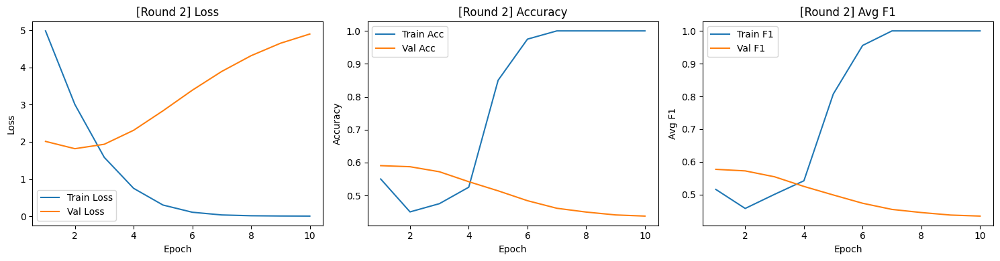


[AL Round 3/50] — Labeled samples: 60



Epoch 10/10
Train — Loss: 0.0451 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 5.7109 | Acc: 0.3663 | Avg F1: 0.3771


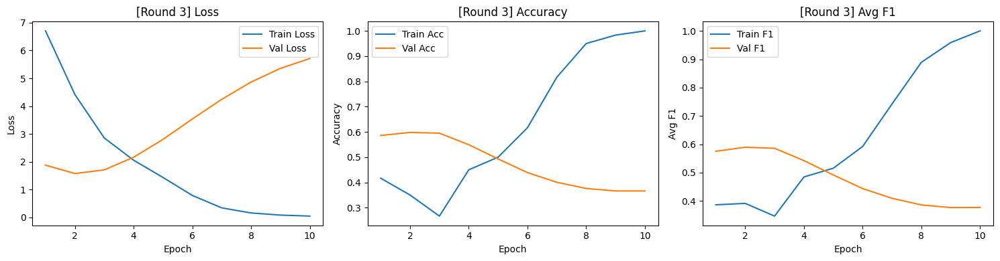


[AL Round 4/50] — Labeled samples: 80



Epoch 10/10
Train — Loss: 0.0668 | Acc: 0.9750 | Avg F1: 0.9221
Val   — Loss: 4.4292 | Acc: 0.5178 | Avg F1: 0.5208


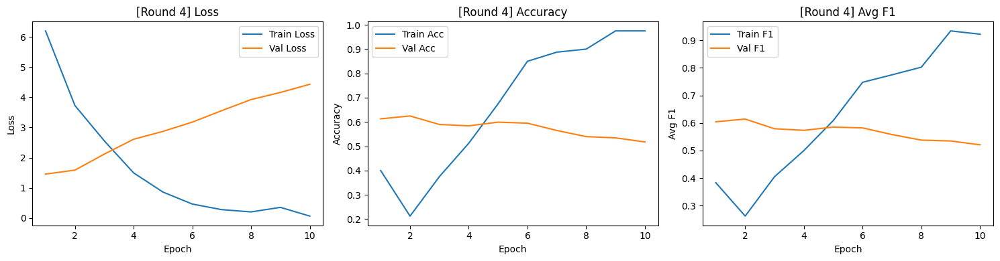


[AL Round 5/50] — Labeled samples: 100



Epoch 10/10
Train — Loss: 0.0776 | Acc: 0.9700 | Avg F1: 0.9016
Val   — Loss: 6.9926 | Acc: 0.4460 | Avg F1: 0.4481


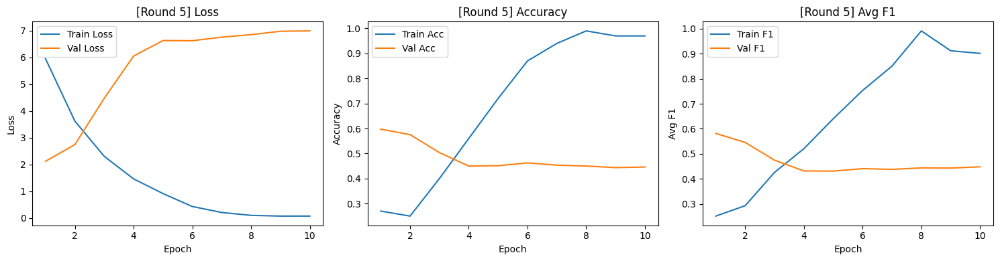


[AL Round 6/50] — Labeled samples: 120



Epoch 10/10
Train — Loss: 0.2885 | Acc: 0.8833 | Avg F1: 0.7638
Val   — Loss: 8.5808 | Acc: 0.3925 | Avg F1: 0.3906


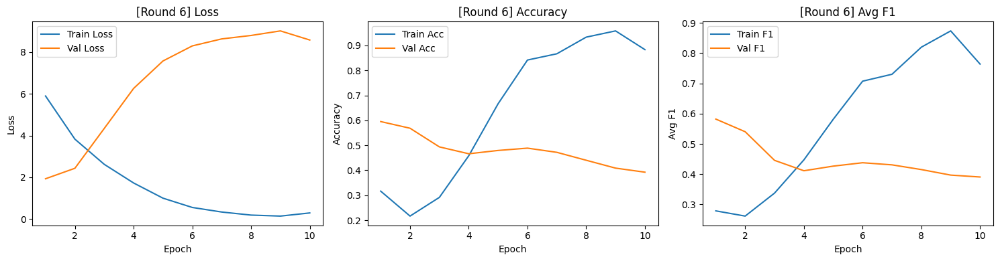


[AL Round 7/50] — Labeled samples: 140



Epoch 10/10
Train — Loss: 0.2319 | Acc: 0.9500 | Avg F1: 0.8674
Val   — Loss: 6.2815 | Acc: 0.5625 | Avg F1: 0.5314


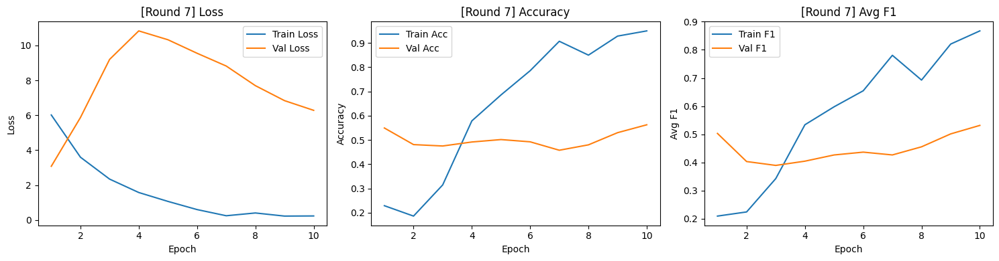


[AL Round 8/50] — Labeled samples: 160



Epoch 10/10
Train — Loss: 0.1528 | Acc: 0.9500 | Avg F1: 0.8755
Val   — Loss: 7.8654 | Acc: 0.3827 | Avg F1: 0.3944


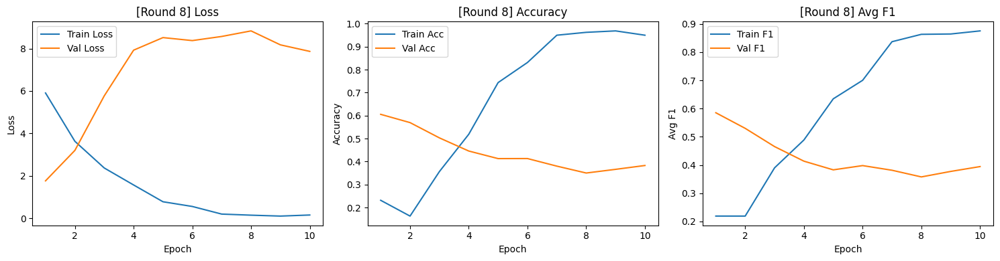


[AL Round 9/50] — Labeled samples: 180



Epoch 10/10
Train — Loss: 0.0705 | Acc: 0.9833 | Avg F1: 0.9340
Val   — Loss: 7.4236 | Acc: 0.4445 | Avg F1: 0.4409


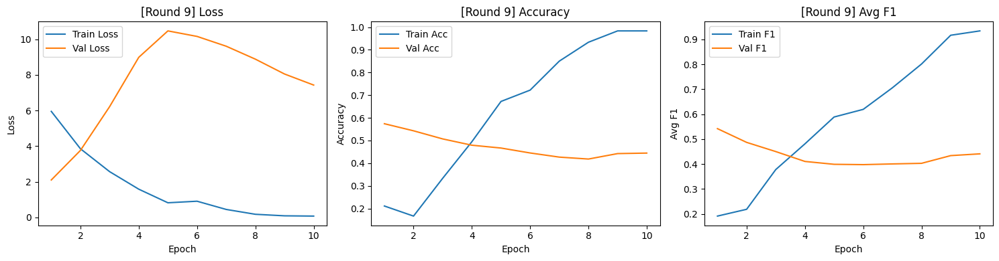


[AL Round 10/50] — Labeled samples: 200



Epoch 10/10
Train — Loss: 0.2205 | Acc: 0.9600 | Avg F1: 0.8697
Val   — Loss: 5.5224 | Acc: 0.4462 | Avg F1: 0.4519


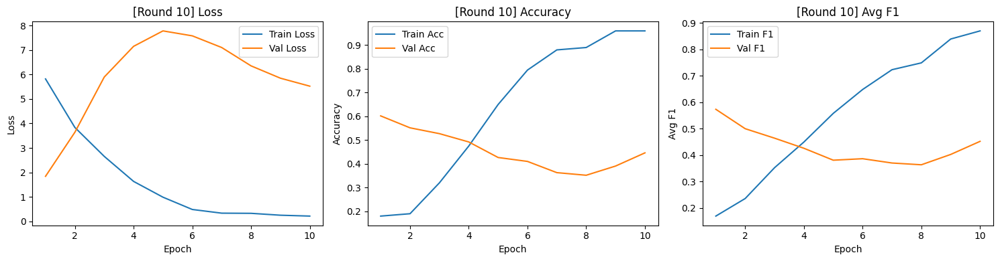


[AL Round 11/50] — Labeled samples: 220



Epoch 10/10
Train — Loss: 0.1104 | Acc: 0.9636 | Avg F1: 0.8684
Val   — Loss: 6.4258 | Acc: 0.4968 | Avg F1: 0.4932


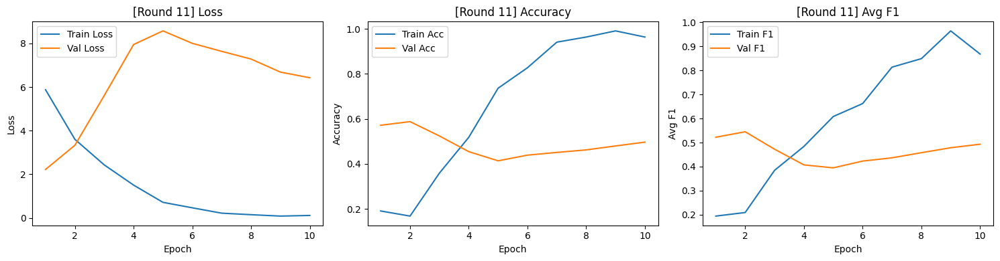


[AL Round 12/50] — Labeled samples: 240



Epoch 10/10
Train — Loss: 0.0622 | Acc: 0.9833 | Avg F1: 0.9505
Val   — Loss: 5.0345 | Acc: 0.5150 | Avg F1: 0.5137


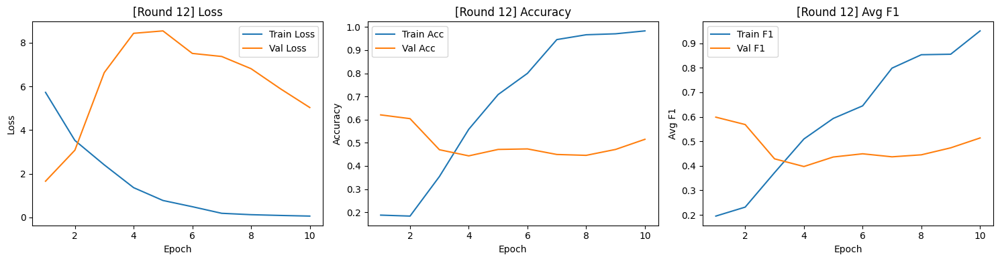


[AL Round 13/50] — Labeled samples: 260



Epoch 10/10
Train — Loss: 0.2012 | Acc: 0.9308 | Avg F1: 0.7990
Val   — Loss: 3.4919 | Acc: 0.6312 | Avg F1: 0.6097


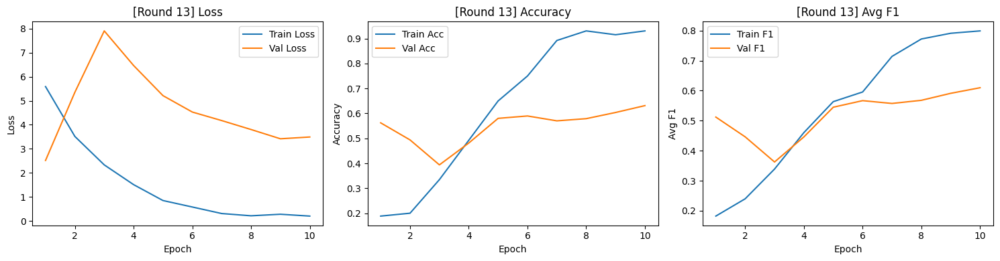


[AL Round 14/50] — Labeled samples: 280



Epoch 10/10
Train — Loss: 0.1078 | Acc: 0.9714 | Avg F1: 0.9097
Val   — Loss: 3.9232 | Acc: 0.6165 | Avg F1: 0.6005


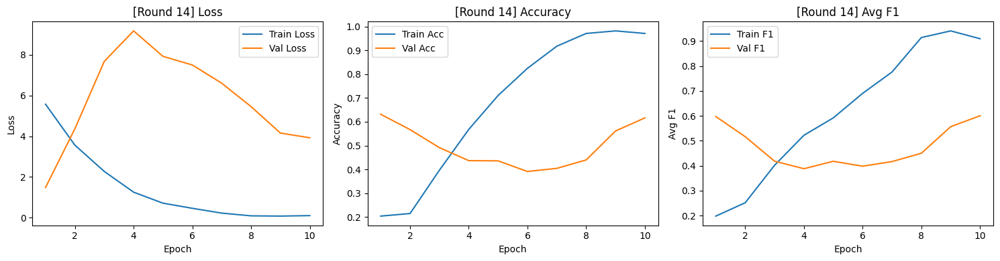


[AL Round 15/50] — Labeled samples: 300



Epoch 10/10
Train — Loss: 0.0395 | Acc: 0.9967 | Avg F1: 0.9970
Val   — Loss: 2.4518 | Acc: 0.6620 | Avg F1: 0.6431


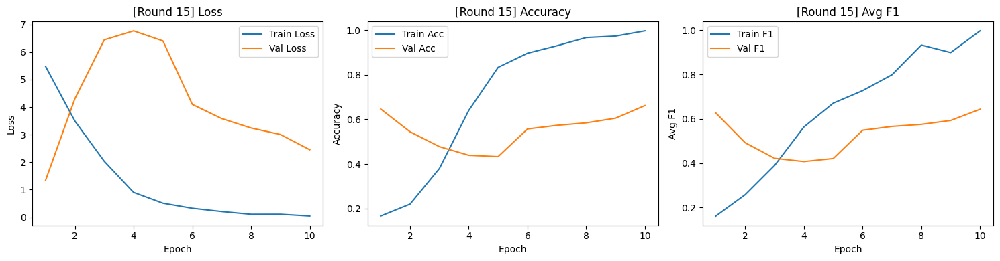


[AL Round 16/50] — Labeled samples: 320



Epoch 10/10
Train — Loss: 0.1091 | Acc: 0.9688 | Avg F1: 0.9356
Val   — Loss: 2.3697 | Acc: 0.7030 | Avg F1: 0.6769


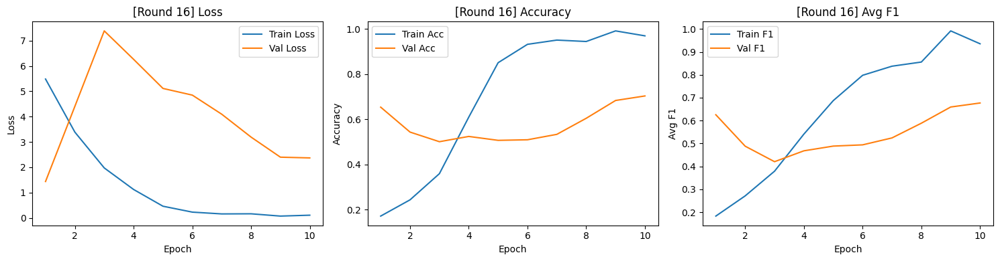


[AL Round 17/50] — Labeled samples: 340



Epoch 10/10
Train — Loss: 0.0933 | Acc: 0.9706 | Avg F1: 0.8726
Val   — Loss: 2.0984 | Acc: 0.7272 | Avg F1: 0.7052


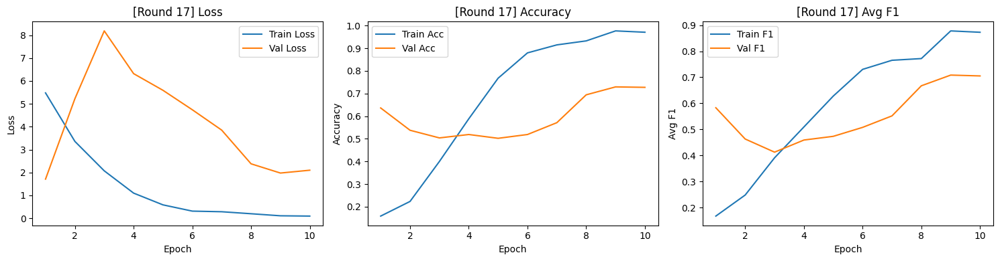


[AL Round 18/50] — Labeled samples: 360



Epoch 10/10
Train — Loss: 0.0824 | Acc: 0.9833 | Avg F1: 0.9231
Val   — Loss: 1.5306 | Acc: 0.7445 | Avg F1: 0.7206


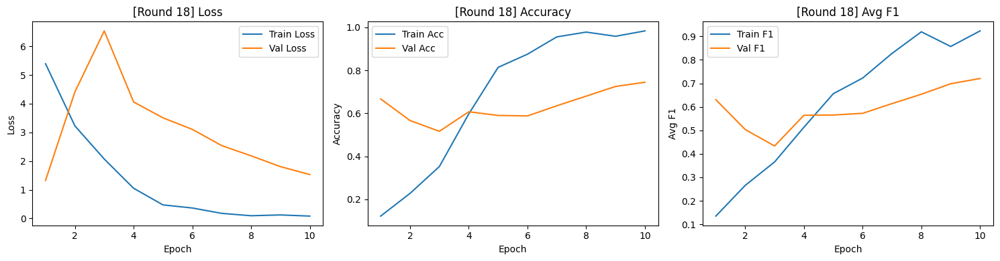


[AL Round 19/50] — Labeled samples: 380



Epoch 10/10
Train — Loss: 0.0861 | Acc: 0.9763 | Avg F1: 0.8896
Val   — Loss: 2.4369 | Acc: 0.6870 | Avg F1: 0.6580


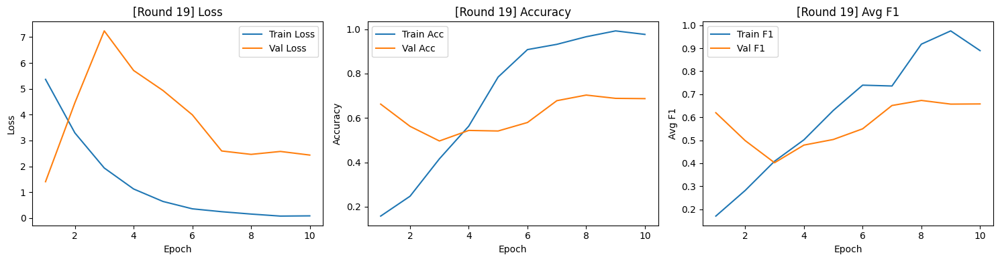


[AL Round 20/50] — Labeled samples: 400



Epoch 10/10
Train — Loss: 0.0773 | Acc: 0.9850 | Avg F1: 0.9685
Val   — Loss: 1.2419 | Acc: 0.7648 | Avg F1: 0.7487


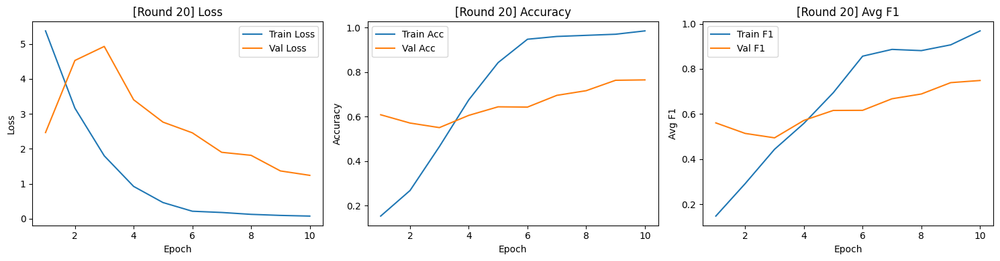


[AL Round 21/50] — Labeled samples: 420



Epoch 10/10
Train — Loss: 0.0718 | Acc: 0.9881 | Avg F1: 0.9514
Val   — Loss: 1.6338 | Acc: 0.7615 | Avg F1: 0.7365


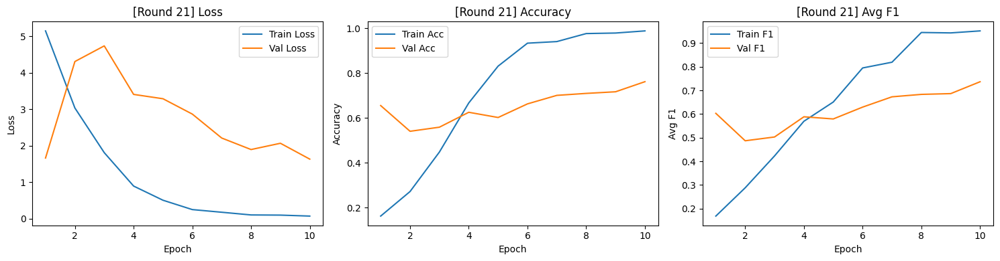


[AL Round 22/50] — Labeled samples: 440



Epoch 10/10
Train — Loss: 0.0720 | Acc: 0.9864 | Avg F1: 0.9108
Val   — Loss: 1.1449 | Acc: 0.7943 | Avg F1: 0.7722


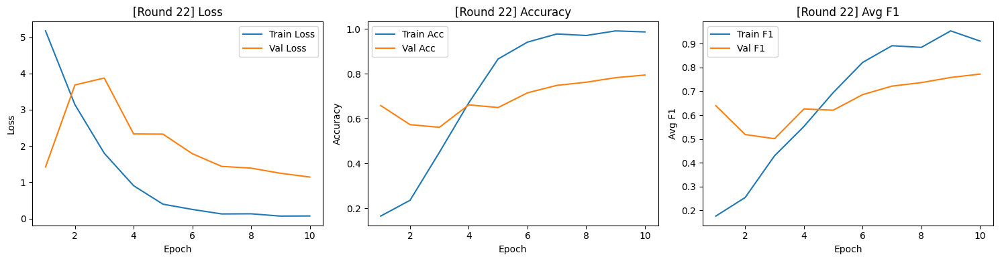


[AL Round 23/50] — Labeled samples: 460



Epoch 10/10
Train — Loss: 0.0922 | Acc: 0.9804 | Avg F1: 0.9694
Val   — Loss: 1.0701 | Acc: 0.7798 | Avg F1: 0.7661


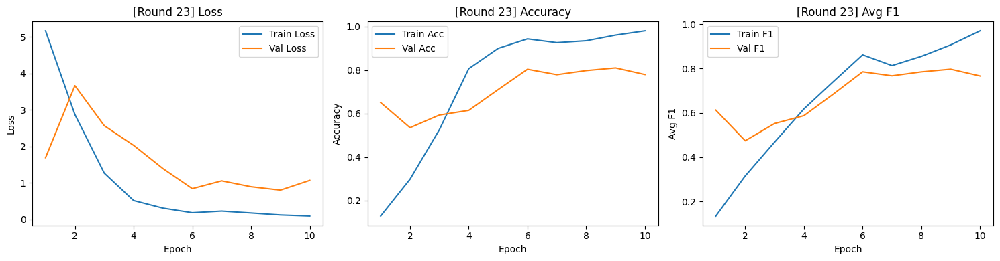


[AL Round 24/50] — Labeled samples: 480



Epoch 10/10
Train — Loss: 0.0664 | Acc: 0.9854 | Avg F1: 0.9718
Val   — Loss: 0.8046 | Acc: 0.8200 | Avg F1: 0.8066


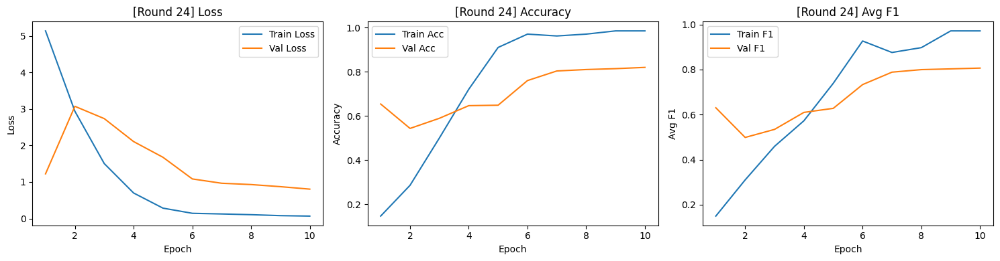


[AL Round 25/50] — Labeled samples: 500



Epoch 10/10
Train — Loss: 0.0816 | Acc: 0.9820 | Avg F1: 0.9854
Val   — Loss: 1.0746 | Acc: 0.8030 | Avg F1: 0.7852


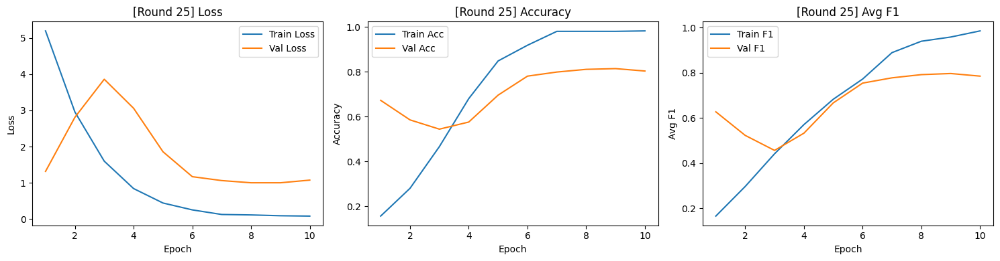


[AL Round 26/50] — Labeled samples: 520



Epoch 10/10
Train — Loss: 0.1297 | Acc: 0.9712 | Avg F1: 0.9398
Val   — Loss: 0.6782 | Acc: 0.8377 | Avg F1: 0.8244


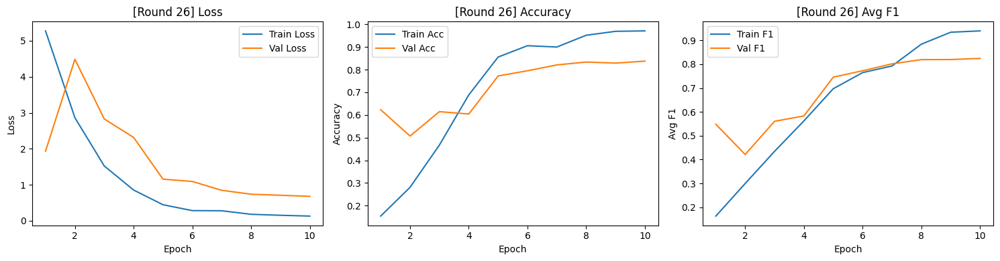


[AL Round 27/50] — Labeled samples: 540



Epoch 10/10
Train — Loss: 0.0770 | Acc: 0.9907 | Avg F1: 0.9724
Val   — Loss: 0.8934 | Acc: 0.8165 | Avg F1: 0.7990


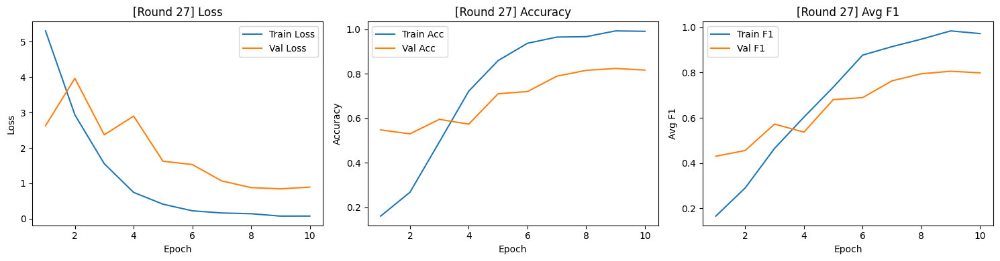


[AL Round 28/50] — Labeled samples: 560



Epoch 10/10
Train — Loss: 0.0704 | Acc: 0.9929 | Avg F1: 0.9863
Val   — Loss: 0.8799 | Acc: 0.8233 | Avg F1: 0.8094


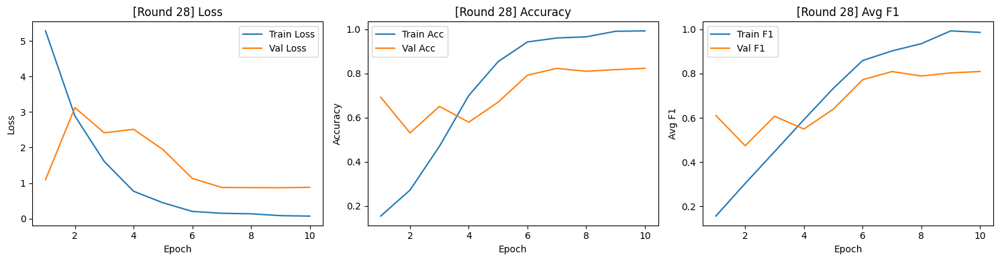


[AL Round 29/50] — Labeled samples: 580



Epoch 10/10
Train — Loss: 0.1626 | Acc: 0.9621 | Avg F1: 0.9212
Val   — Loss: 0.8277 | Acc: 0.8013 | Avg F1: 0.7944


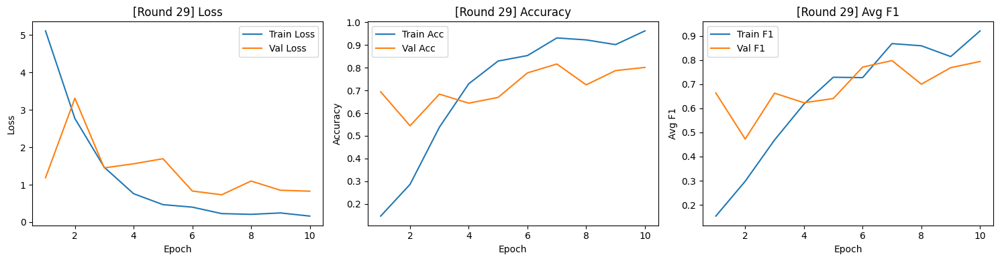


[AL Round 30/50] — Labeled samples: 600



Epoch 10/10
Train — Loss: 0.0681 | Acc: 0.9817 | Avg F1: 0.9778
Val   — Loss: 0.7021 | Acc: 0.8260 | Avg F1: 0.8085


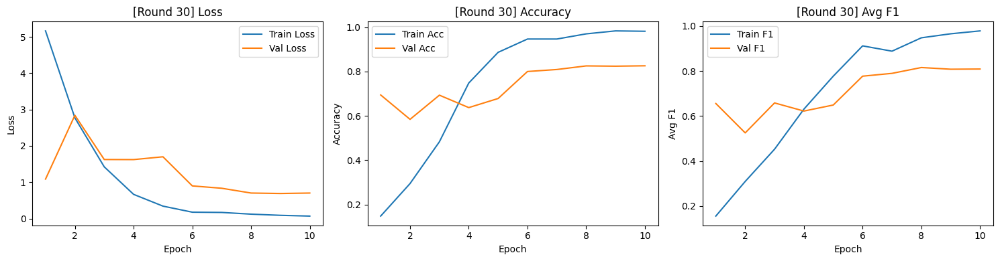


[AL Round 31/50] — Labeled samples: 620



Epoch 10/10
Train — Loss: 0.1018 | Acc: 0.9774 | Avg F1: 0.9553
Val   — Loss: 0.6210 | Acc: 0.8365 | Avg F1: 0.8276


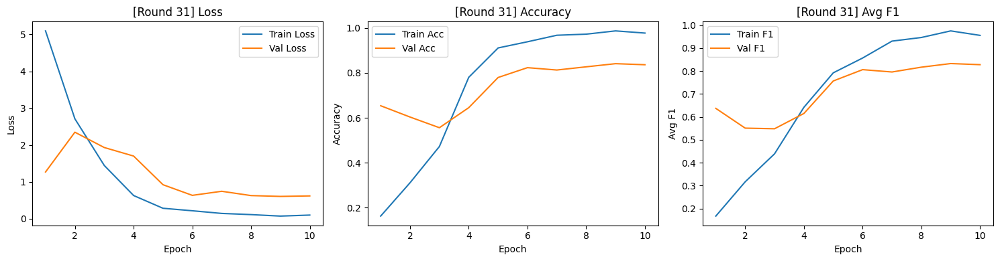


[AL Round 32/50] — Labeled samples: 640



Epoch 10/10
Train — Loss: 0.0672 | Acc: 0.9953 | Avg F1: 0.9885
Val   — Loss: 0.6070 | Acc: 0.8365 | Avg F1: 0.8215


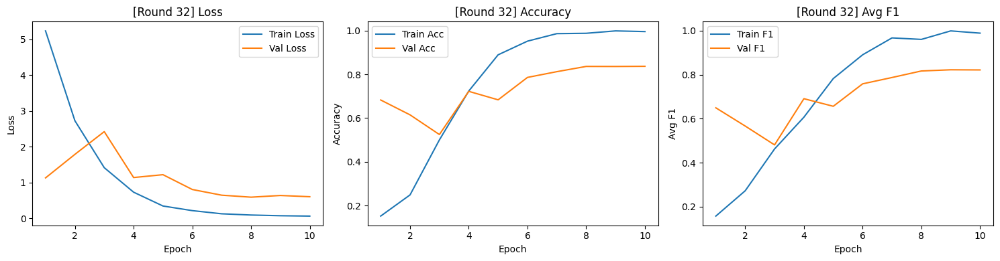


[AL Round 33/50] — Labeled samples: 660



Epoch 10/10
Train — Loss: 0.0906 | Acc: 0.9879 | Avg F1: 0.9696
Val   — Loss: 0.7344 | Acc: 0.8175 | Avg F1: 0.8007


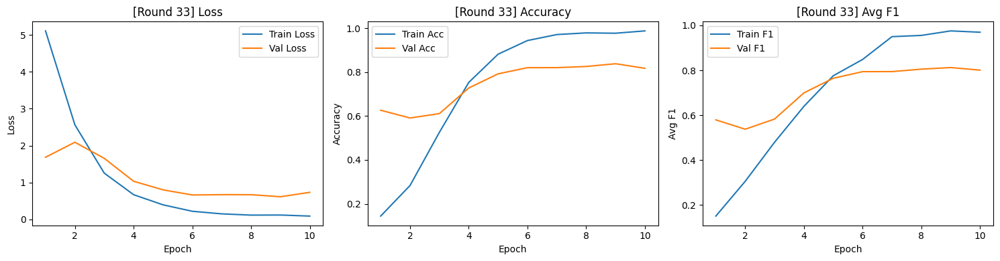


[AL Round 34/50] — Labeled samples: 680



Epoch 10/10
Train — Loss: 0.0776 | Acc: 0.9868 | Avg F1: 0.9723
Val   — Loss: 0.5832 | Acc: 0.8455 | Avg F1: 0.8403


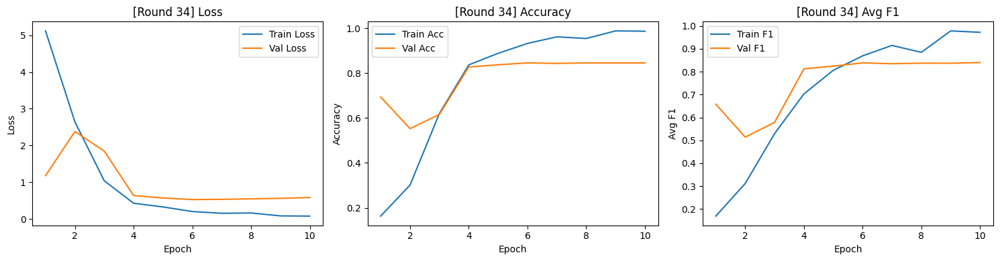


[AL Round 35/50] — Labeled samples: 700



Epoch 10/10
Train — Loss: 0.0959 | Acc: 0.9771 | Avg F1: 0.9412
Val   — Loss: 0.5461 | Acc: 0.8548 | Avg F1: 0.8502


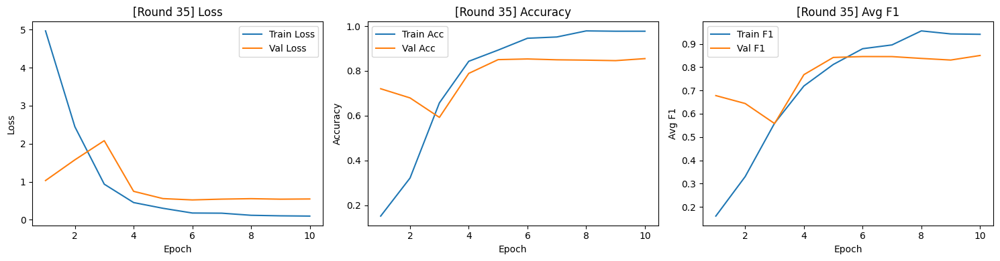


[AL Round 36/50] — Labeled samples: 720



Epoch 10/10
Train — Loss: 0.1202 | Acc: 0.9708 | Avg F1: 0.9514
Val   — Loss: 0.5889 | Acc: 0.8430 | Avg F1: 0.8276


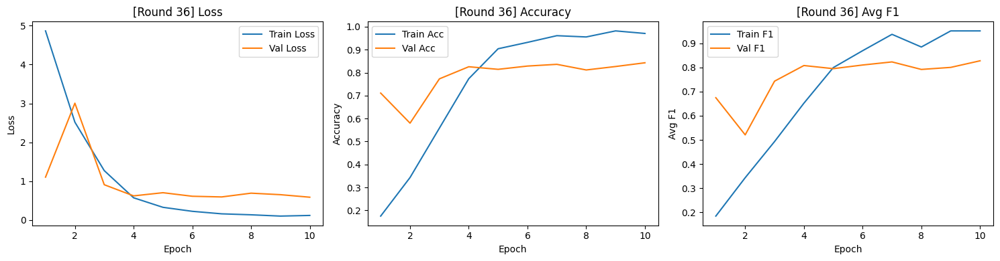


[AL Round 37/50] — Labeled samples: 740



Epoch 10/10
Train — Loss: 0.0845 | Acc: 0.9824 | Avg F1: 0.9724
Val   — Loss: 0.5400 | Acc: 0.8522 | Avg F1: 0.8372


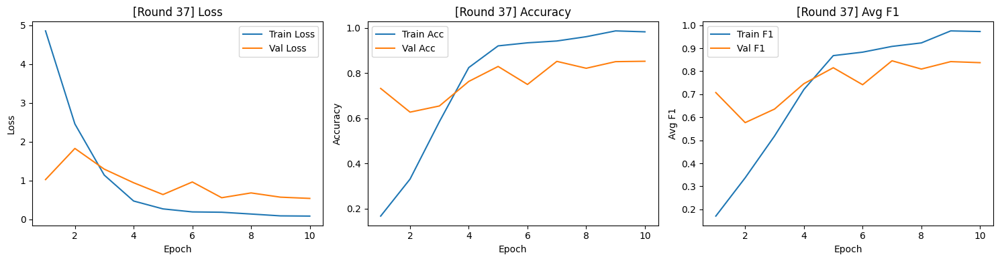


[AL Round 38/50] — Labeled samples: 760



Epoch 10/10
Train — Loss: 0.0883 | Acc: 0.9882 | Avg F1: 0.9828
Val   — Loss: 0.5924 | Acc: 0.8565 | Avg F1: 0.8489


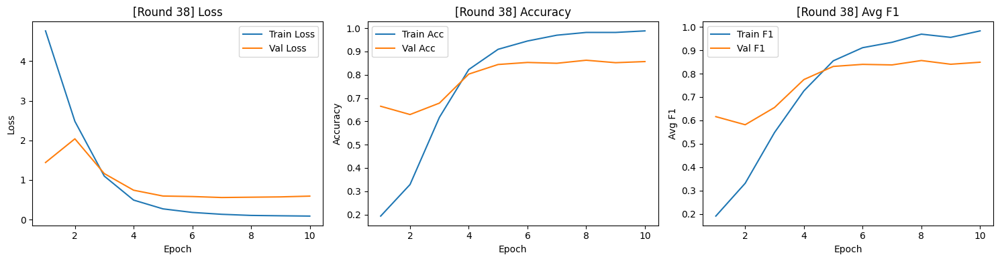


[AL Round 39/50] — Labeled samples: 780



Epoch 10/10
Train — Loss: 0.0941 | Acc: 0.9846 | Avg F1: 0.9678
Val   — Loss: 0.5439 | Acc: 0.8572 | Avg F1: 0.8476


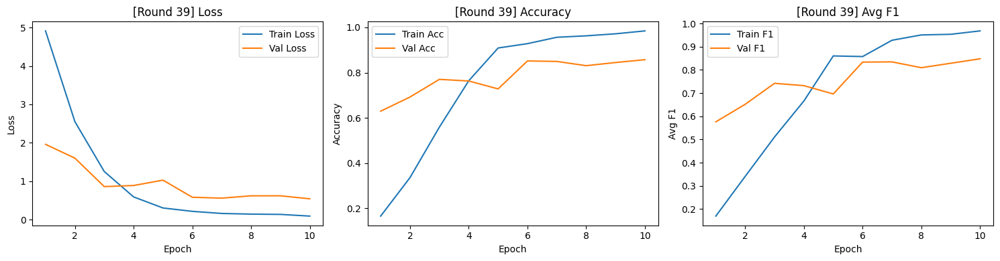


[AL Round 40/50] — Labeled samples: 800



Epoch 10/10
Train — Loss: 0.0740 | Acc: 0.9888 | Avg F1: 0.9839
Val   — Loss: 0.5392 | Acc: 0.8585 | Avg F1: 0.8526


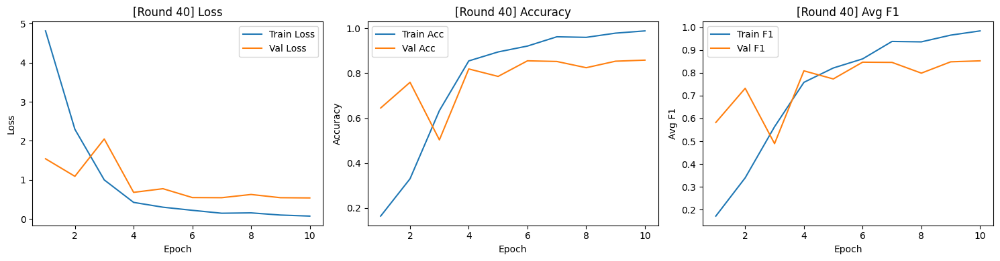


[AL Round 41/50] — Labeled samples: 820



Epoch 10/10
Train — Loss: 0.0801 | Acc: 0.9902 | Avg F1: 0.9818
Val   — Loss: 0.6078 | Acc: 0.8532 | Avg F1: 0.8436


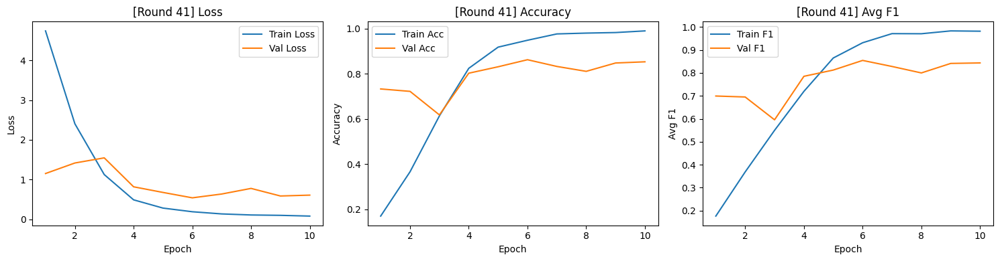


[AL Round 42/50] — Labeled samples: 840



Epoch 10/10
Train — Loss: 0.1368 | Acc: 0.9583 | Avg F1: 0.9493
Val   — Loss: 0.5915 | Acc: 0.8375 | Avg F1: 0.8339


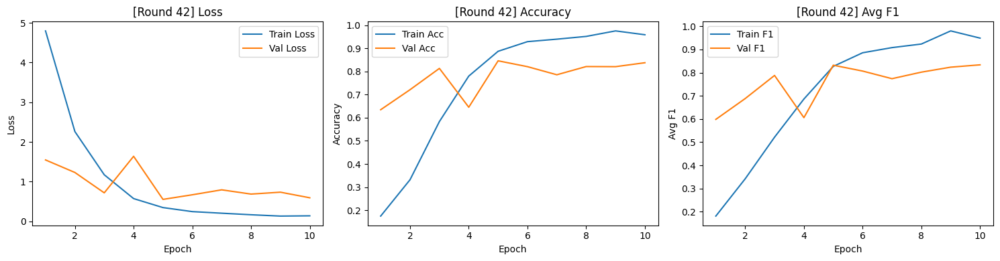


[AL Round 43/50] — Labeled samples: 860



Epoch 10/10
Train — Loss: 0.0893 | Acc: 0.9872 | Avg F1: 0.9812
Val   — Loss: 0.5917 | Acc: 0.8582 | Avg F1: 0.8493


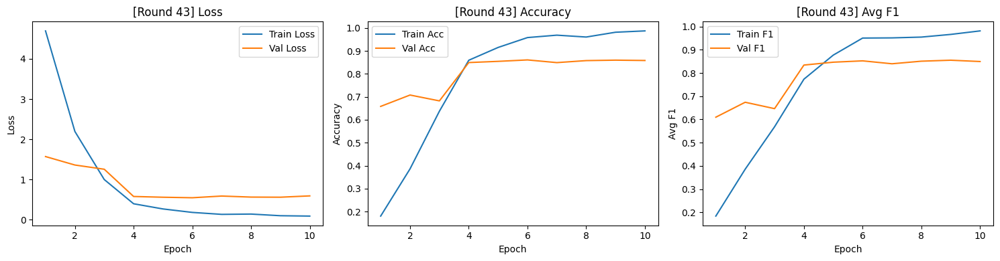


[AL Round 44/50] — Labeled samples: 880



Epoch 10/10
Train — Loss: 0.0738 | Acc: 0.9898 | Avg F1: 0.9805
Val   — Loss: 0.5200 | Acc: 0.8685 | Avg F1: 0.8635


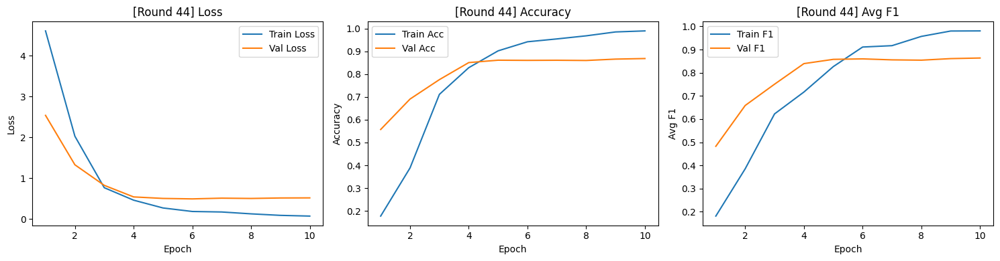


[AL Round 45/50] — Labeled samples: 900



Epoch 10/10
Train — Loss: 0.2382 | Acc: 0.9311 | Avg F1: 0.9246
Val   — Loss: 0.6179 | Acc: 0.8438 | Avg F1: 0.8407


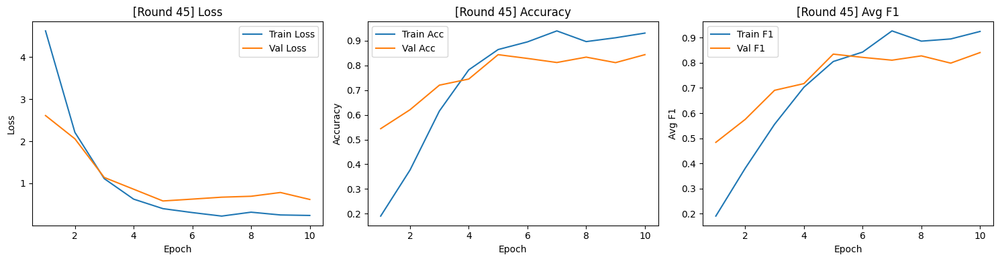


[AL Round 46/50] — Labeled samples: 920



Epoch 10/10
Train — Loss: 0.0736 | Acc: 0.9913 | Avg F1: 0.9855
Val   — Loss: 0.5863 | Acc: 0.8620 | Avg F1: 0.8545


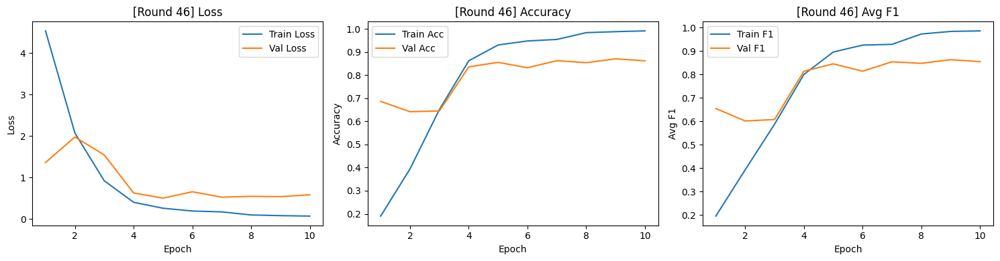


[AL Round 47/50] — Labeled samples: 940



Epoch 10/10
Train — Loss: 0.0834 | Acc: 0.9840 | Avg F1: 0.9779
Val   — Loss: 0.5662 | Acc: 0.8582 | Avg F1: 0.8508


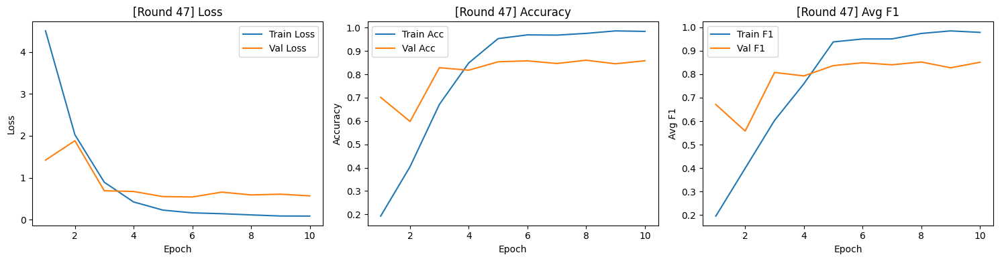


[AL Round 48/50] — Labeled samples: 960



Epoch 10/10
Train — Loss: 0.0899 | Acc: 0.9865 | Avg F1: 0.9799
Val   — Loss: 0.5361 | Acc: 0.8565 | Avg F1: 0.8497


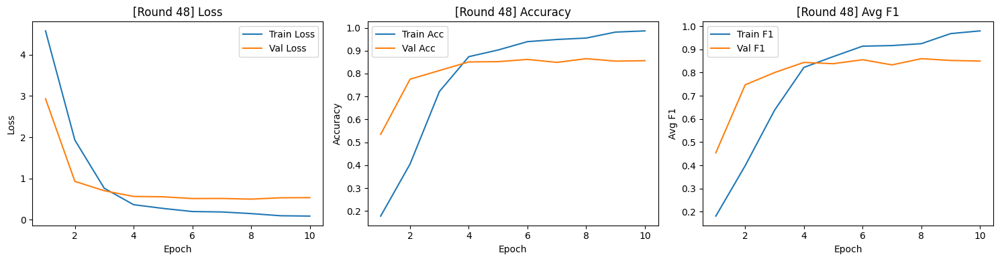


[AL Round 49/50] — Labeled samples: 980



Epoch 10/10
Train — Loss: 0.0912 | Acc: 0.9837 | Avg F1: 0.9850
Val   — Loss: 0.5399 | Acc: 0.8585 | Avg F1: 0.8512


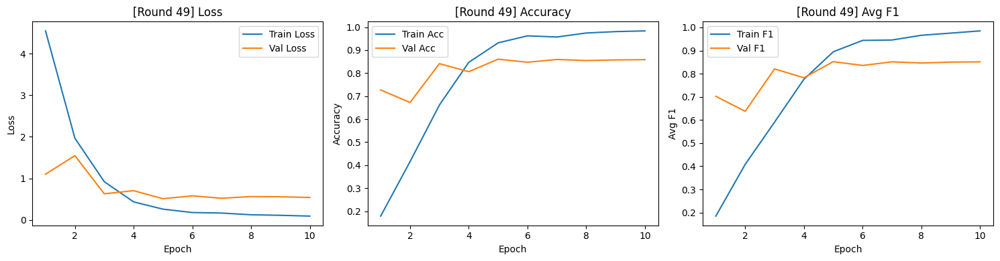


[AL Round 50/50] — Labeled samples: 1000



Epoch 10/10
Train — Loss: 0.0835 | Acc: 0.9830 | Avg F1: 0.9803
Val   — Loss: 0.5179 | Acc: 0.8692 | Avg F1: 0.8659


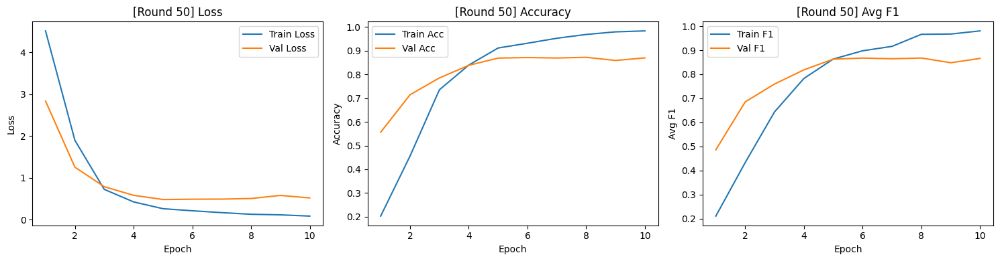

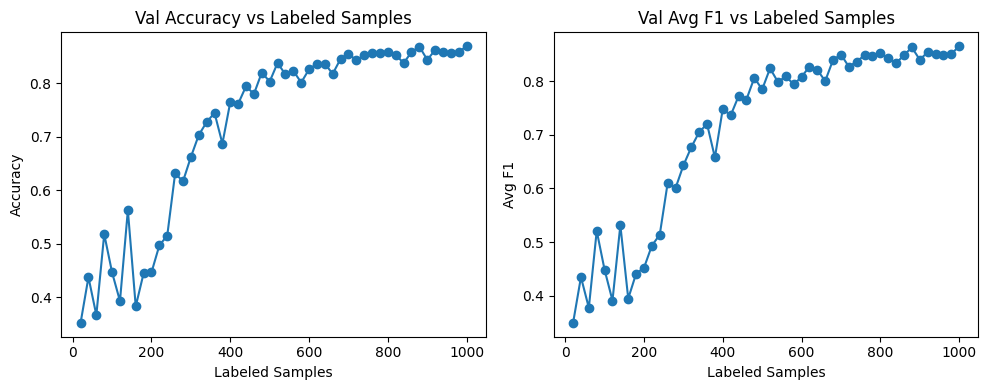


=== Running strategy: MARGIN ===

[AL Round 1/50] — Labeled samples: 20



Epoch 10/10
Train — Loss: 0.0093 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 4.8442 | Acc: 0.3513 | Avg F1: 0.3483


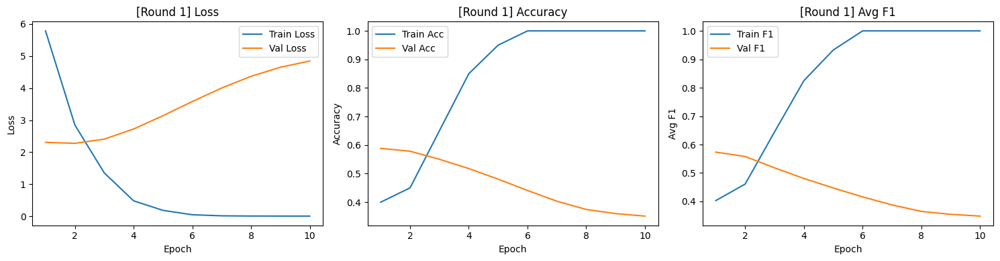


[AL Round 2/50] — Labeled samples: 40



Epoch 10/10
Train — Loss: 0.0395 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 6.4314 | Acc: 0.3332 | Avg F1: 0.3297


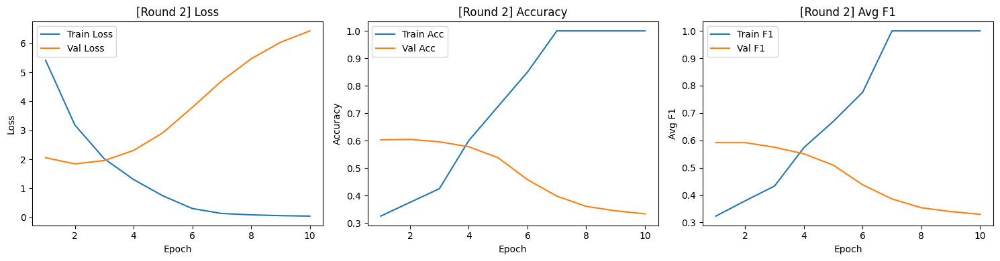


[AL Round 3/50] — Labeled samples: 60



Epoch 10/10
Train — Loss: 0.0486 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 6.0087 | Acc: 0.4595 | Avg F1: 0.4469


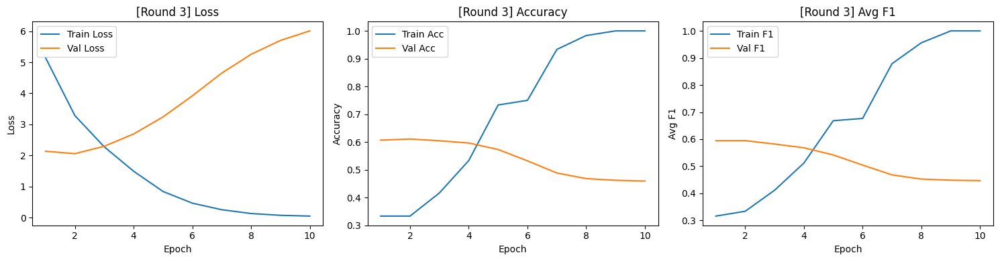


[AL Round 4/50] — Labeled samples: 80



Epoch 10/10
Train — Loss: 0.1293 | Acc: 0.9625 | Avg F1: 0.9411
Val   — Loss: 4.4041 | Acc: 0.6125 | Avg F1: 0.5729


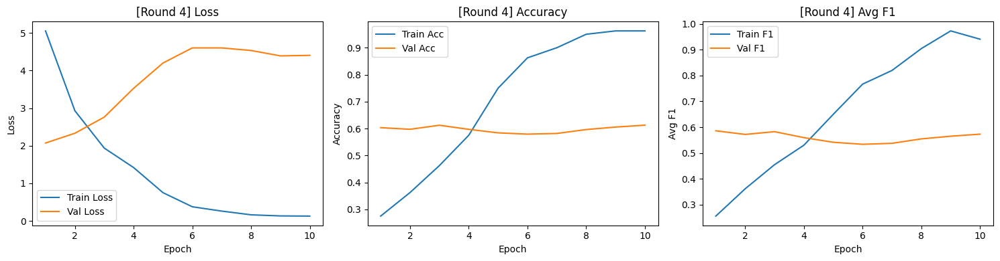


[AL Round 5/50] — Labeled samples: 100



Epoch 10/10
Train — Loss: 0.0783 | Acc: 0.9800 | Avg F1: 0.9640
Val   — Loss: 4.5992 | Acc: 0.5440 | Avg F1: 0.5050


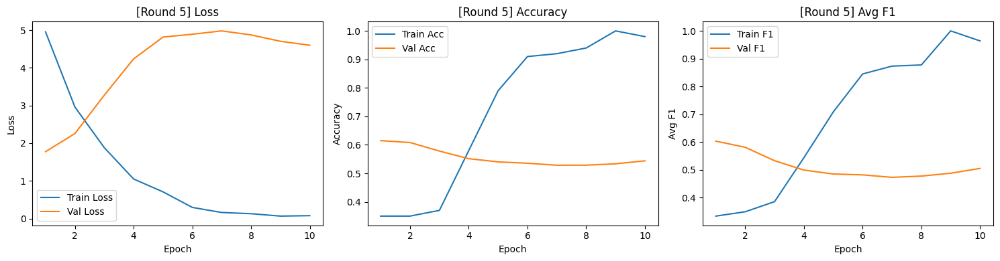


[AL Round 6/50] — Labeled samples: 120



Epoch 10/10
Train — Loss: 0.0549 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 4.9255 | Acc: 0.5413 | Avg F1: 0.4904


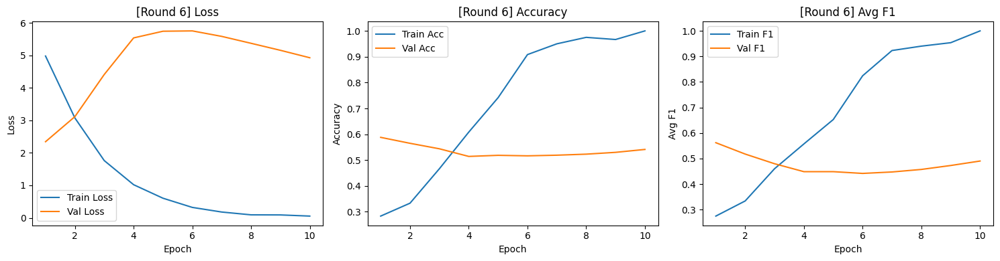


[AL Round 7/50] — Labeled samples: 140



Epoch 10/10
Train — Loss: 0.0883 | Acc: 0.9857 | Avg F1: 0.9898
Val   — Loss: 2.7790 | Acc: 0.6525 | Avg F1: 0.6257


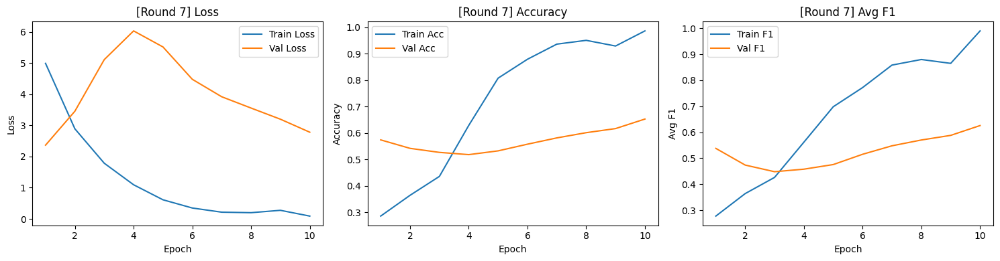


[AL Round 8/50] — Labeled samples: 160



Epoch 10/10
Train — Loss: 0.0390 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 3.1465 | Acc: 0.6028 | Avg F1: 0.5836


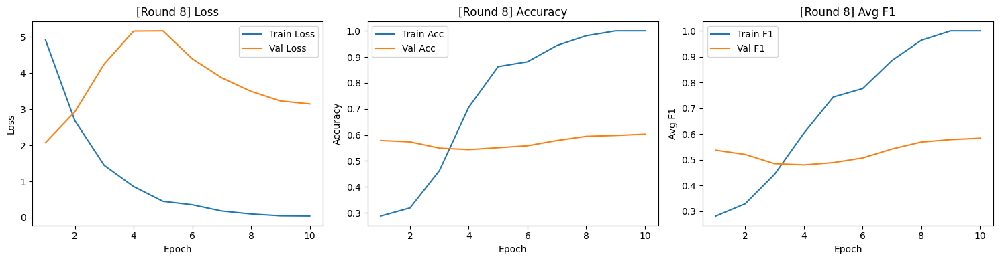


[AL Round 9/50] — Labeled samples: 180



Epoch 10/10
Train — Loss: 0.0768 | Acc: 0.9944 | Avg F1: 0.9960
Val   — Loss: 3.6326 | Acc: 0.5515 | Avg F1: 0.5345


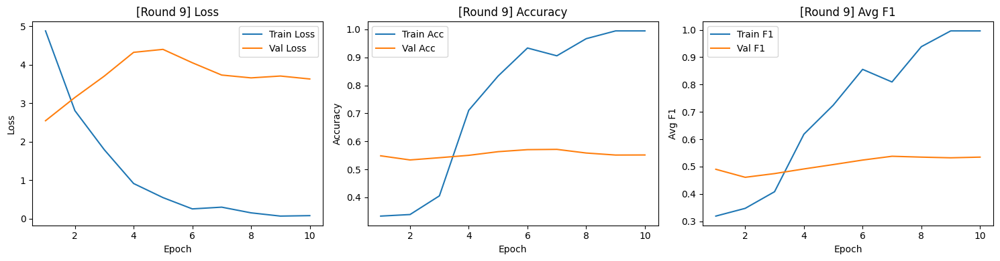


[AL Round 10/50] — Labeled samples: 200



Epoch 10/10
Train — Loss: 0.3363 | Acc: 0.8900 | Avg F1: 0.8313
Val   — Loss: 3.3113 | Acc: 0.6020 | Avg F1: 0.5727


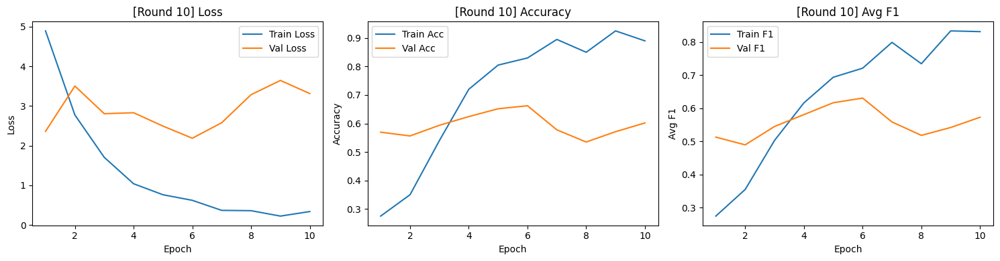


[AL Round 11/50] — Labeled samples: 220



Epoch 10/10
Train — Loss: 0.0376 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 2.5259 | Acc: 0.6575 | Avg F1: 0.6275


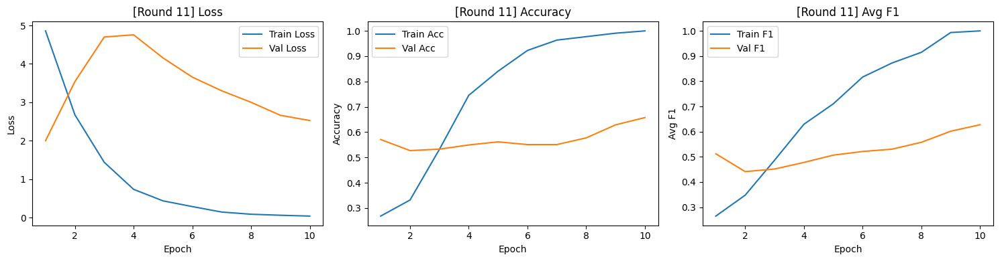


[AL Round 12/50] — Labeled samples: 240



Epoch 10/10
Train — Loss: 0.0593 | Acc: 0.9917 | Avg F1: 0.9940
Val   — Loss: 2.4073 | Acc: 0.6617 | Avg F1: 0.6362


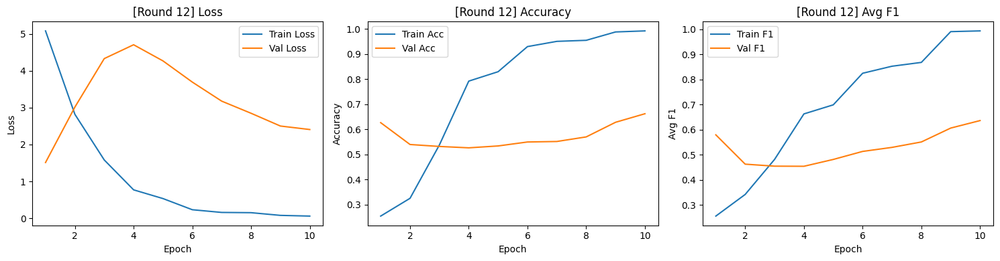


[AL Round 13/50] — Labeled samples: 260



Epoch 10/10
Train — Loss: 0.1590 | Acc: 0.9462 | Avg F1: 0.9166
Val   — Loss: 2.1023 | Acc: 0.6840 | Avg F1: 0.6568


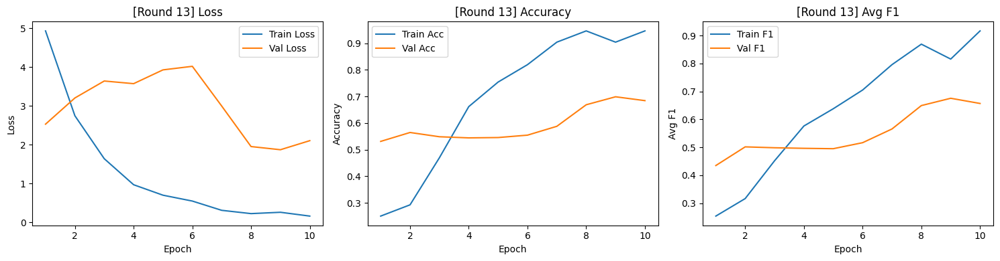


[AL Round 14/50] — Labeled samples: 280



Epoch 10/10
Train — Loss: 0.0716 | Acc: 0.9857 | Avg F1: 0.9897
Val   — Loss: 1.2491 | Acc: 0.7810 | Avg F1: 0.7598


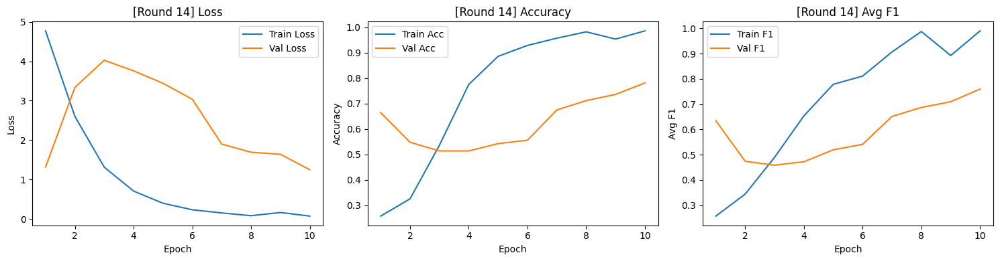


[AL Round 15/50] — Labeled samples: 300



Epoch 10/10
Train — Loss: 0.0775 | Acc: 0.9800 | Avg F1: 0.9606
Val   — Loss: 1.8447 | Acc: 0.7255 | Avg F1: 0.6964


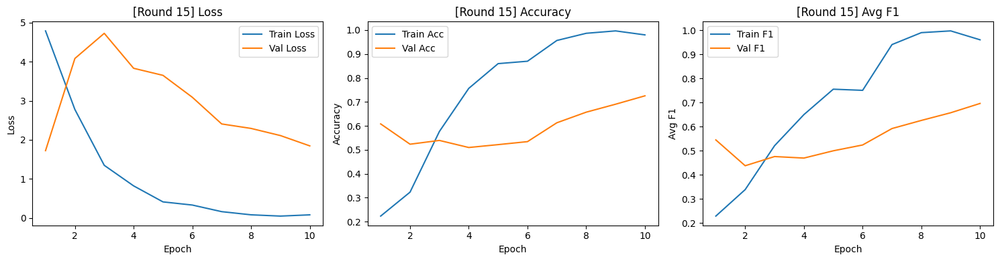


[AL Round 16/50] — Labeled samples: 320



Epoch 10/10
Train — Loss: 0.0452 | Acc: 0.9938 | Avg F1: 0.9823
Val   — Loss: 1.6472 | Acc: 0.7372 | Avg F1: 0.7101


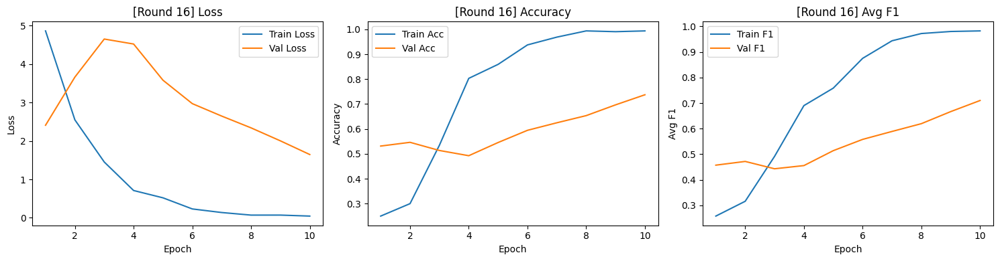


[AL Round 17/50] — Labeled samples: 340



Epoch 10/10
Train — Loss: 0.0628 | Acc: 0.9882 | Avg F1: 0.9684
Val   — Loss: 1.5125 | Acc: 0.7555 | Avg F1: 0.7332


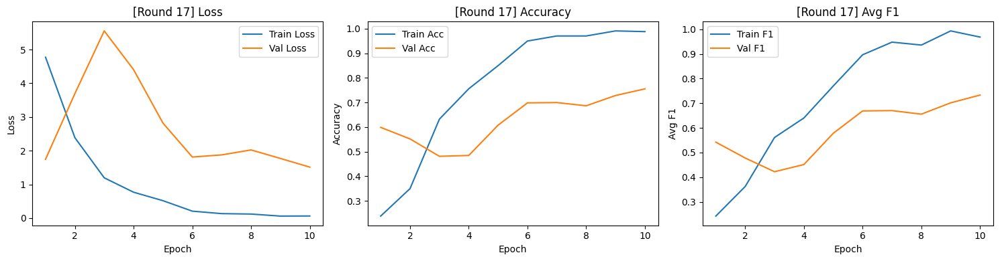


[AL Round 18/50] — Labeled samples: 360



Epoch 10/10
Train — Loss: 0.0663 | Acc: 0.9861 | Avg F1: 0.9898
Val   — Loss: 1.2043 | Acc: 0.7880 | Avg F1: 0.7674


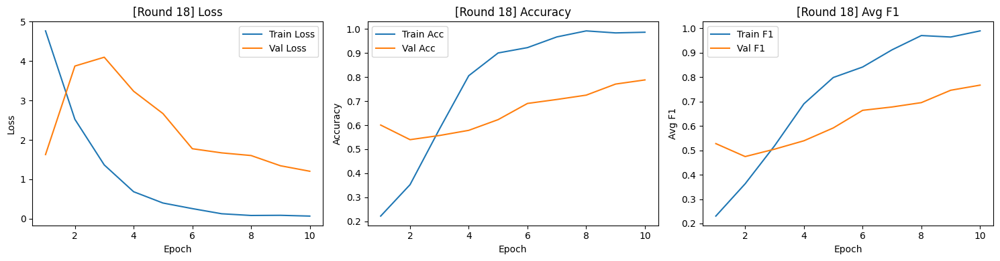


[AL Round 19/50] — Labeled samples: 380



Epoch 10/10
Train — Loss: 0.0490 | Acc: 0.9921 | Avg F1: 0.9835
Val   — Loss: 1.4622 | Acc: 0.7602 | Avg F1: 0.7337


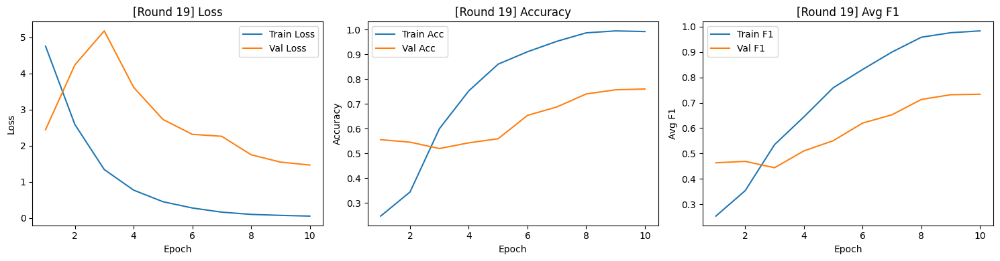


[AL Round 20/50] — Labeled samples: 400



Epoch 10/10
Train — Loss: 0.0903 | Acc: 0.9900 | Avg F1: 0.9741
Val   — Loss: 1.0995 | Acc: 0.7738 | Avg F1: 0.7523


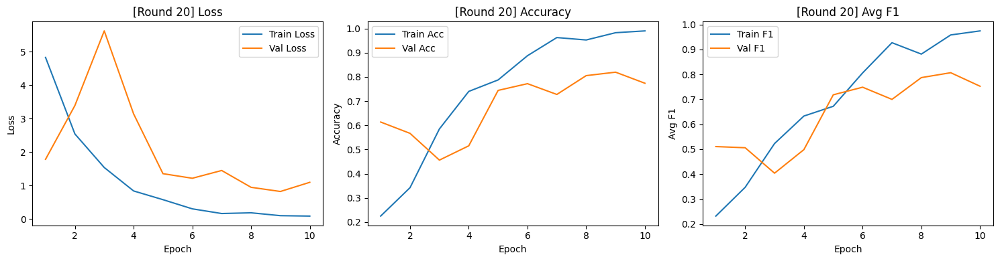


[AL Round 21/50] — Labeled samples: 420



Epoch 10/10
Train — Loss: 0.0638 | Acc: 0.9905 | Avg F1: 0.9738
Val   — Loss: 1.0654 | Acc: 0.7973 | Avg F1: 0.7773


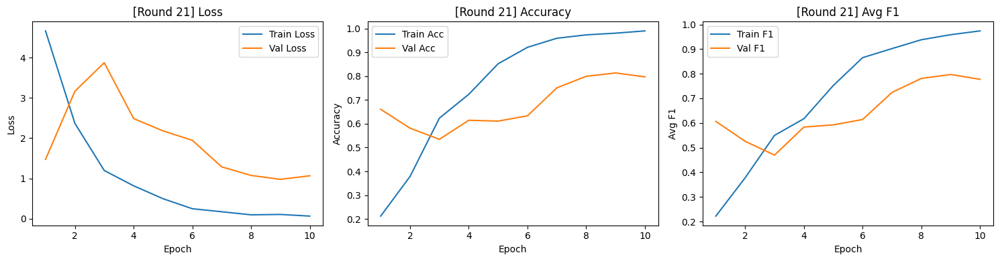


[AL Round 22/50] — Labeled samples: 440



Epoch 10/10
Train — Loss: 0.0579 | Acc: 0.9932 | Avg F1: 0.9781
Val   — Loss: 0.9495 | Acc: 0.8037 | Avg F1: 0.7846


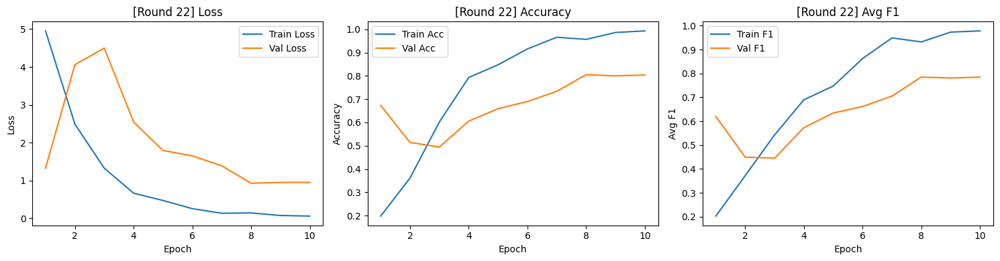


[AL Round 23/50] — Labeled samples: 460



Epoch 10/10
Train — Loss: 0.1367 | Acc: 0.9609 | Avg F1: 0.9308
Val   — Loss: 0.9378 | Acc: 0.8150 | Avg F1: 0.8021


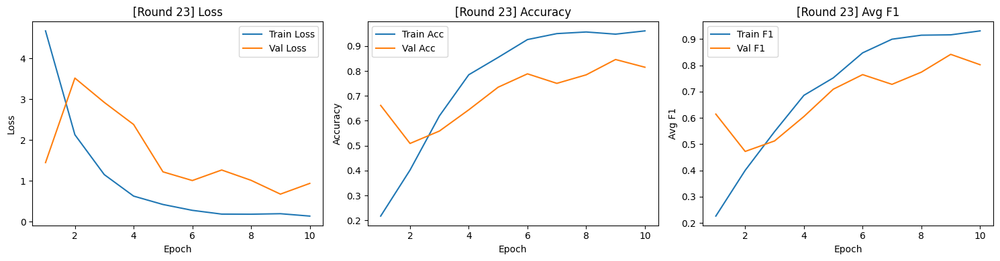


[AL Round 24/50] — Labeled samples: 480



Epoch 10/10
Train — Loss: 0.0595 | Acc: 0.9938 | Avg F1: 0.9802
Val   — Loss: 0.9760 | Acc: 0.8073 | Avg F1: 0.7894


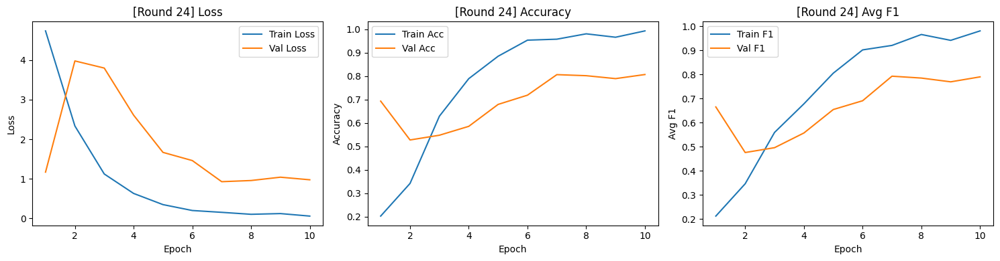


[AL Round 25/50] — Labeled samples: 500



Epoch 10/10
Train — Loss: 0.0855 | Acc: 0.9780 | Avg F1: 0.9473
Val   — Loss: 0.6987 | Acc: 0.8448 | Avg F1: 0.8330


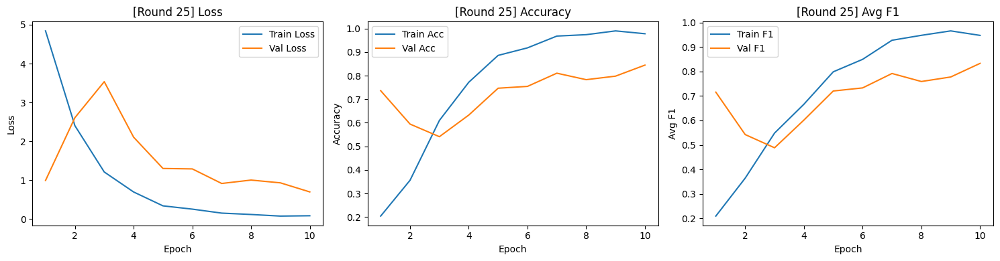


[AL Round 26/50] — Labeled samples: 520



Epoch 10/10
Train — Loss: 0.1266 | Acc: 0.9750 | Avg F1: 0.9493
Val   — Loss: 0.7872 | Acc: 0.8215 | Avg F1: 0.8217


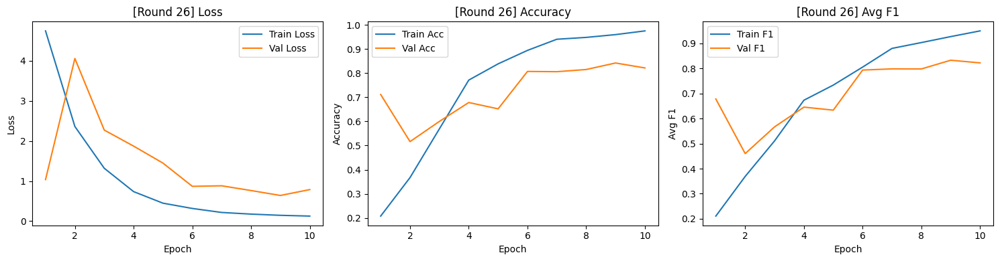


[AL Round 27/50] — Labeled samples: 540



Epoch 10/10
Train — Loss: 0.1045 | Acc: 0.9685 | Avg F1: 0.9546
Val   — Loss: 0.6894 | Acc: 0.8435 | Avg F1: 0.8328


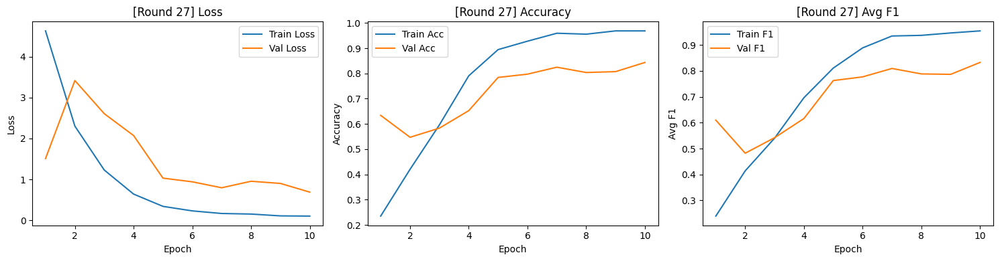


[AL Round 28/50] — Labeled samples: 560



Epoch 10/10
Train — Loss: 0.0912 | Acc: 0.9732 | Avg F1: 0.9644
Val   — Loss: 0.7193 | Acc: 0.8445 | Avg F1: 0.8344


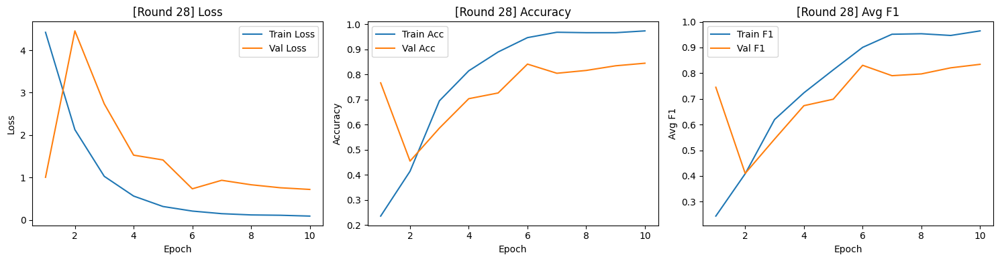


[AL Round 29/50] — Labeled samples: 580



Epoch 10/10
Train — Loss: 0.1911 | Acc: 0.9500 | Avg F1: 0.9104
Val   — Loss: 0.7783 | Acc: 0.8190 | Avg F1: 0.8129


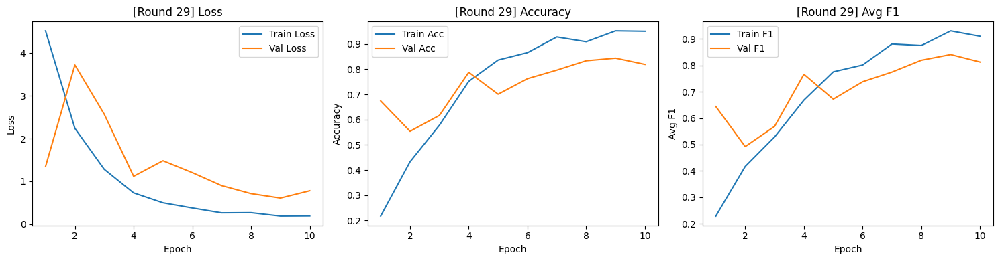


[AL Round 30/50] — Labeled samples: 600



Epoch 10/10
Train — Loss: 0.0817 | Acc: 0.9900 | Avg F1: 0.9842
Val   — Loss: 0.7336 | Acc: 0.8448 | Avg F1: 0.8388


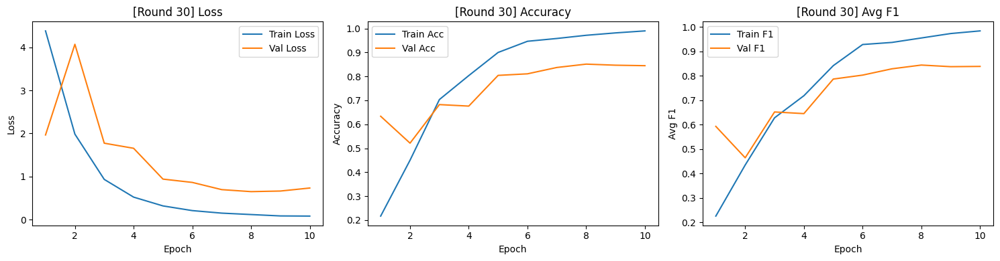


[AL Round 31/50] — Labeled samples: 620



Epoch 10/10
Train — Loss: 0.0676 | Acc: 0.9935 | Avg F1: 0.9871
Val   — Loss: 0.6416 | Acc: 0.8582 | Avg F1: 0.8517


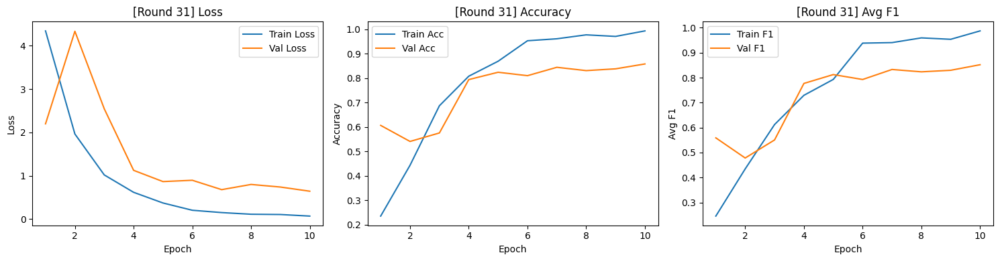


[AL Round 32/50] — Labeled samples: 640



Epoch 10/10
Train — Loss: 0.1009 | Acc: 0.9734 | Avg F1: 0.9655
Val   — Loss: 0.6489 | Acc: 0.8585 | Avg F1: 0.8562


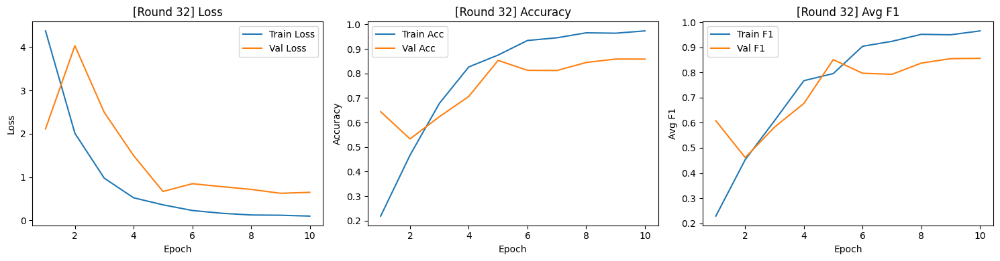


[AL Round 33/50] — Labeled samples: 660



Epoch 10/10
Train — Loss: 0.0876 | Acc: 0.9833 | Avg F1: 0.9799
Val   — Loss: 0.6006 | Acc: 0.8640 | Avg F1: 0.8596


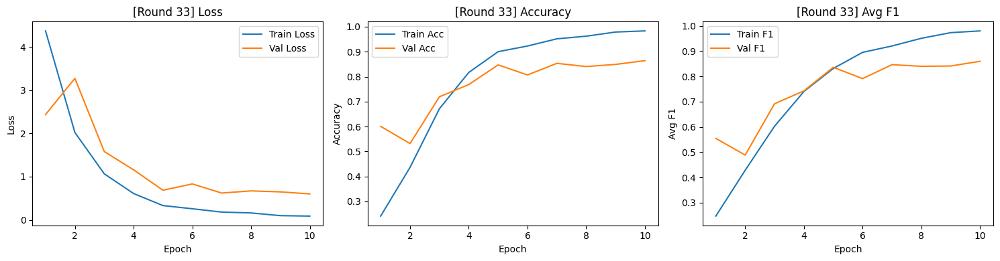


[AL Round 34/50] — Labeled samples: 680



Epoch 10/10
Train — Loss: 0.0739 | Acc: 0.9897 | Avg F1: 0.9787
Val   — Loss: 0.6410 | Acc: 0.8542 | Avg F1: 0.8510


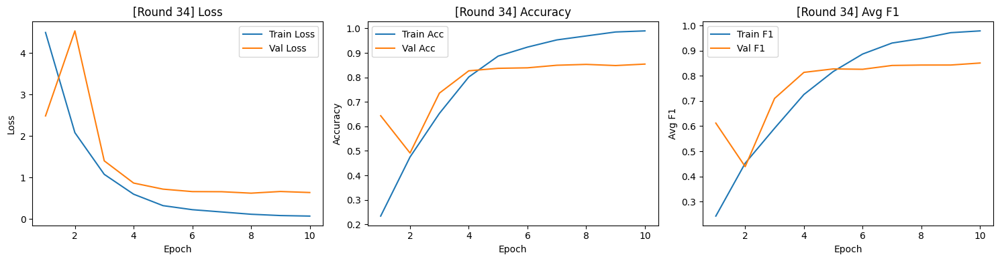


[AL Round 35/50] — Labeled samples: 700



Epoch 10/10
Train — Loss: 0.0807 | Acc: 0.9800 | Avg F1: 0.9816
Val   — Loss: 0.7278 | Acc: 0.8512 | Avg F1: 0.8428


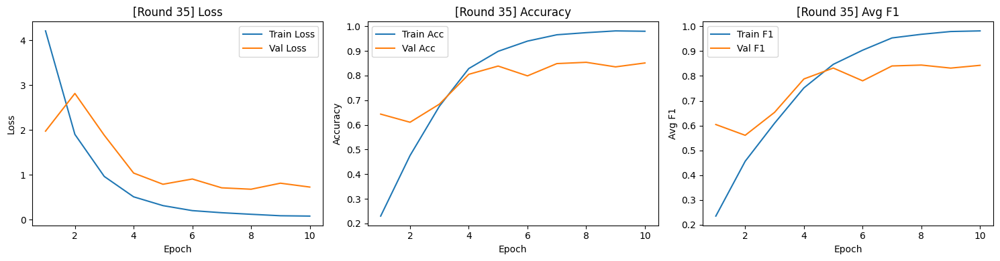


[AL Round 36/50] — Labeled samples: 720



Epoch 10/10
Train — Loss: 0.1195 | Acc: 0.9736 | Avg F1: 0.9649
Val   — Loss: 0.5954 | Acc: 0.8565 | Avg F1: 0.8519


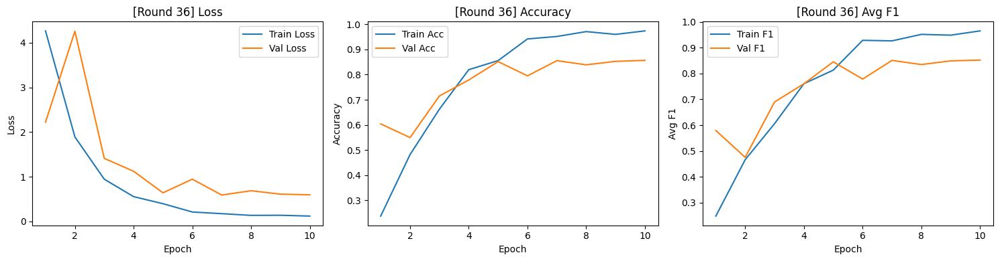


[AL Round 37/50] — Labeled samples: 740



Epoch 10/10
Train — Loss: 0.0724 | Acc: 0.9851 | Avg F1: 0.9855
Val   — Loss: 0.6535 | Acc: 0.8570 | Avg F1: 0.8525


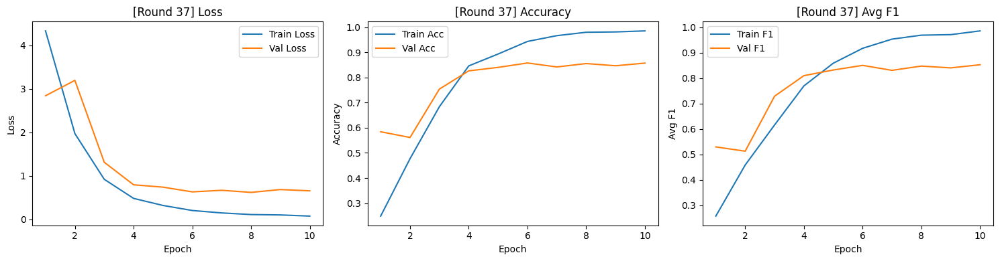


[AL Round 38/50] — Labeled samples: 760



Epoch 10/10
Train — Loss: 0.0791 | Acc: 0.9882 | Avg F1: 0.9849
Val   — Loss: 0.6160 | Acc: 0.8660 | Avg F1: 0.8620


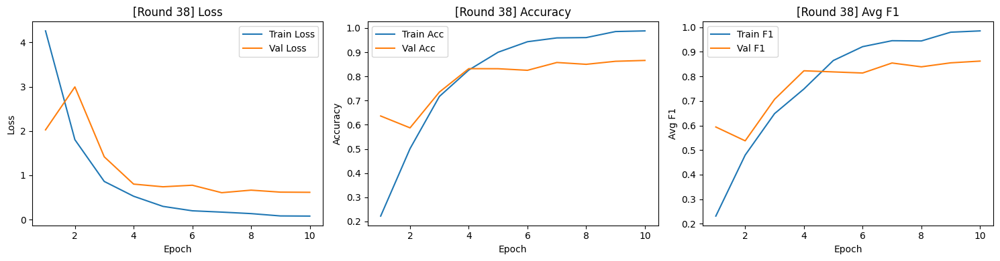


[AL Round 39/50] — Labeled samples: 780



Epoch 10/10
Train — Loss: 0.1265 | Acc: 0.9808 | Avg F1: 0.9737
Val   — Loss: 0.5377 | Acc: 0.8610 | Avg F1: 0.8605


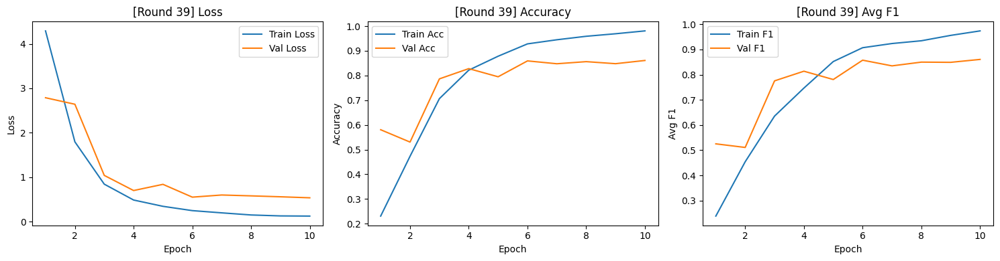


[AL Round 40/50] — Labeled samples: 800



Epoch 10/10
Train — Loss: 0.0720 | Acc: 0.9925 | Avg F1: 0.9887
Val   — Loss: 0.6743 | Acc: 0.8572 | Avg F1: 0.8526


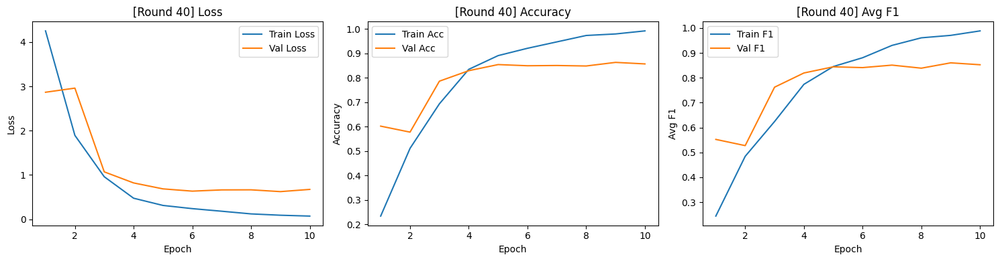


[AL Round 41/50] — Labeled samples: 820



Epoch 10/10
Train — Loss: 0.0951 | Acc: 0.9805 | Avg F1: 0.9653
Val   — Loss: 0.5975 | Acc: 0.8650 | Avg F1: 0.8640


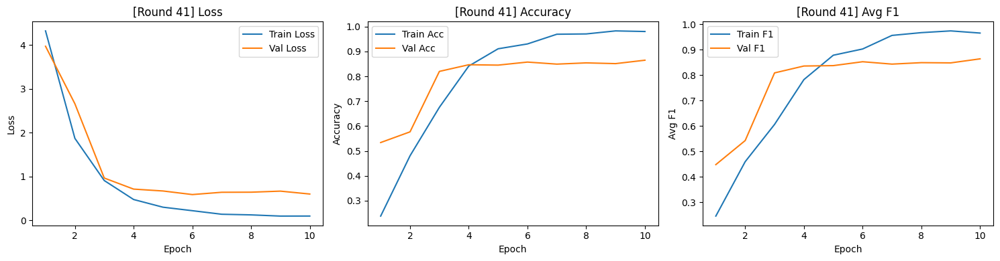


[AL Round 42/50] — Labeled samples: 840



Epoch 10/10
Train — Loss: 0.1536 | Acc: 0.9524 | Avg F1: 0.9466
Val   — Loss: 0.6883 | Acc: 0.8508 | Avg F1: 0.8475


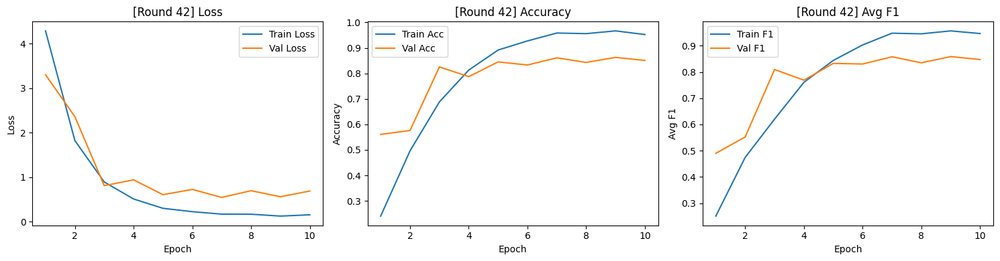


[AL Round 43/50] — Labeled samples: 860



Epoch 10/10
Train — Loss: 0.0840 | Acc: 0.9802 | Avg F1: 0.9776
Val   — Loss: 0.6332 | Acc: 0.8608 | Avg F1: 0.8594


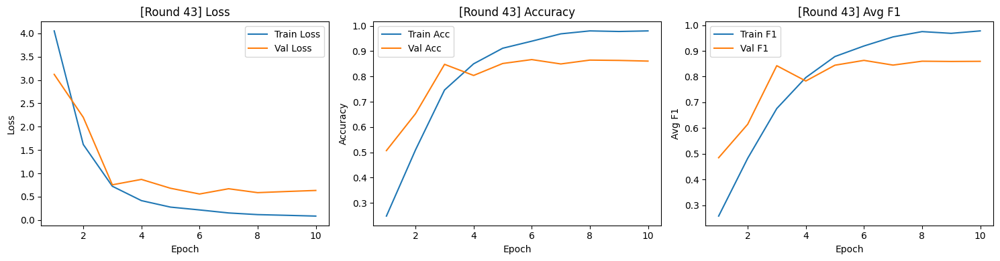


[AL Round 44/50] — Labeled samples: 880



Epoch 10/10
Train — Loss: 0.0908 | Acc: 0.9784 | Avg F1: 0.9744
Val   — Loss: 0.6368 | Acc: 0.8590 | Avg F1: 0.8543


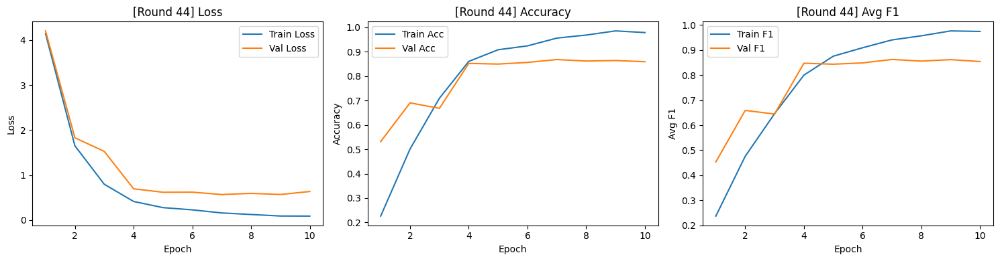


[AL Round 45/50] — Labeled samples: 900



Epoch 10/10
Train — Loss: 0.1735 | Acc: 0.9511 | Avg F1: 0.9474
Val   — Loss: 0.6692 | Acc: 0.8462 | Avg F1: 0.8451


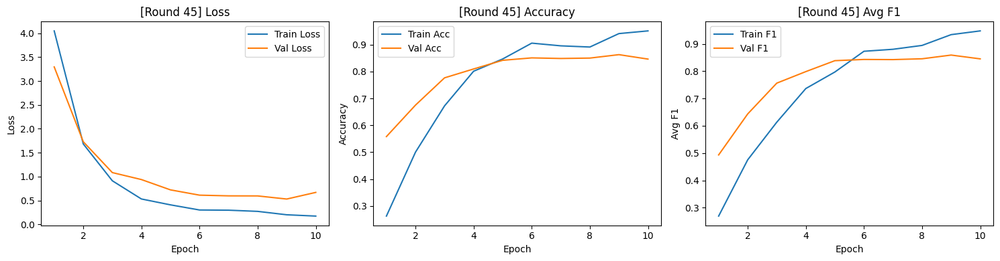


[AL Round 46/50] — Labeled samples: 920



Epoch 10/10
Train — Loss: 0.0996 | Acc: 0.9804 | Avg F1: 0.9695
Val   — Loss: 0.5770 | Acc: 0.8640 | Avg F1: 0.8607


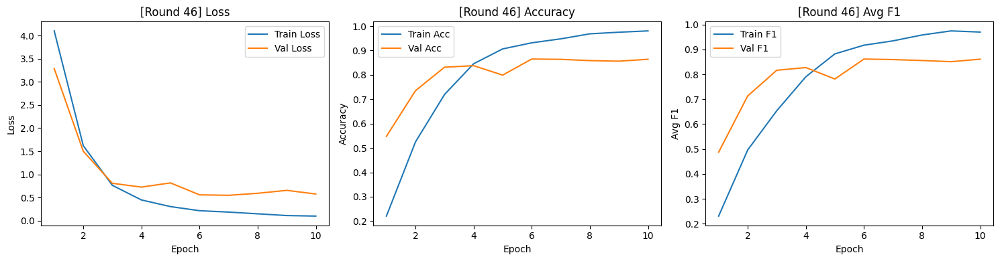


[AL Round 47/50] — Labeled samples: 940



Epoch 10/10
Train — Loss: 0.0800 | Acc: 0.9883 | Avg F1: 0.9828
Val   — Loss: 0.6005 | Acc: 0.8655 | Avg F1: 0.8623


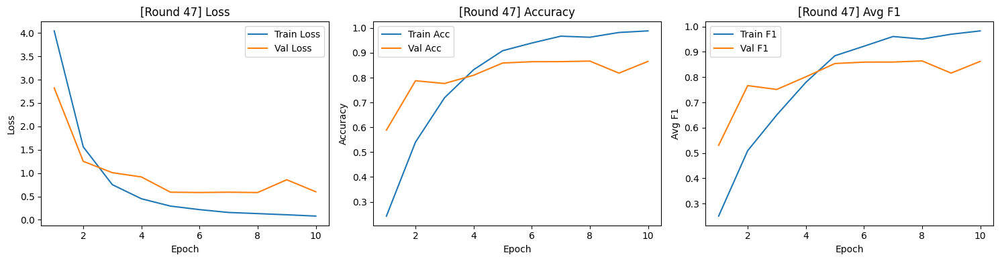


[AL Round 48/50] — Labeled samples: 960



Epoch 10/10
Train — Loss: 0.1110 | Acc: 0.9729 | Avg F1: 0.9633
Val   — Loss: 0.6466 | Acc: 0.8560 | Avg F1: 0.8521


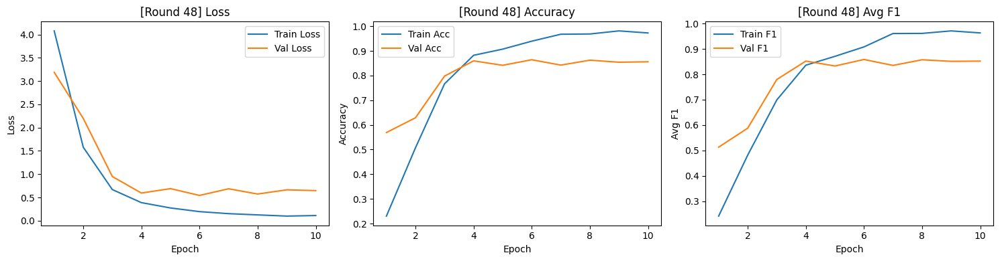


[AL Round 49/50] — Labeled samples: 980



Epoch 10/10
Train — Loss: 0.1037 | Acc: 0.9714 | Avg F1: 0.9668
Val   — Loss: 0.7068 | Acc: 0.8542 | Avg F1: 0.8488


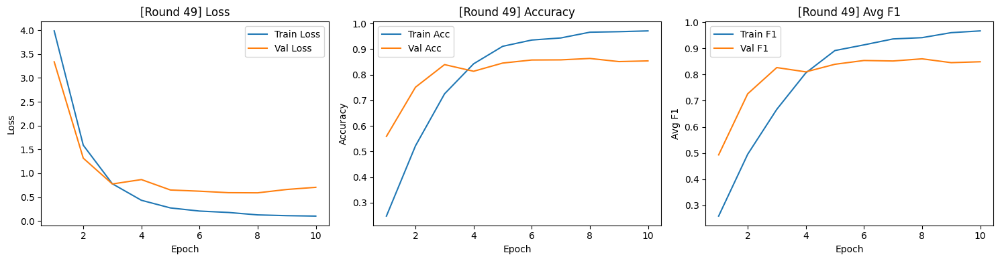


[AL Round 50/50] — Labeled samples: 1000



Epoch 10/10
Train — Loss: 0.0958 | Acc: 0.9810 | Avg F1: 0.9726
Val   — Loss: 0.6301 | Acc: 0.8655 | Avg F1: 0.8625


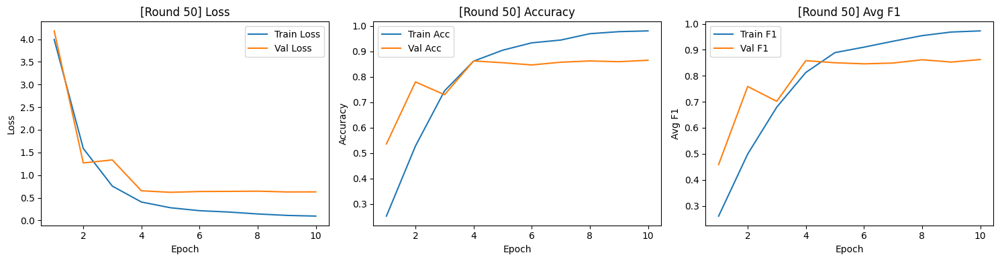

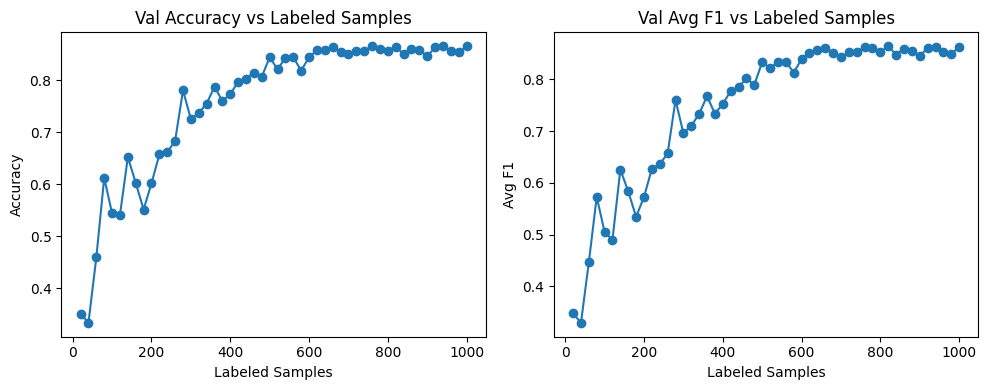


=== Running strategy: RANDOM ===

[AL Round 1/50] — Labeled samples: 20



Epoch 10/10
Train — Loss: 0.0093 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 4.8374 | Acc: 0.3523 | Avg F1: 0.3494


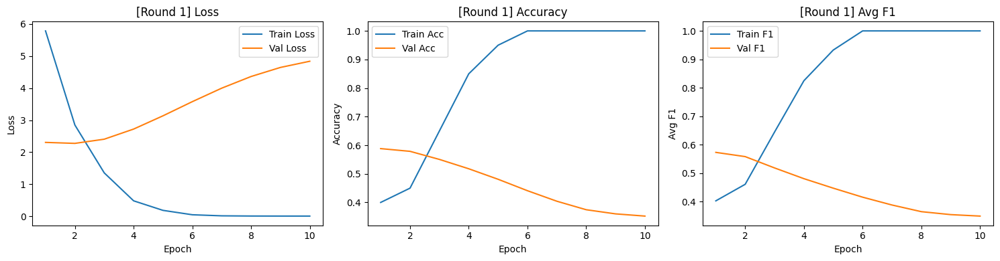


[AL Round 2/50] — Labeled samples: 40



Epoch 10/10
Train — Loss: 0.0106 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 6.1490 | Acc: 0.4590 | Avg F1: 0.3979


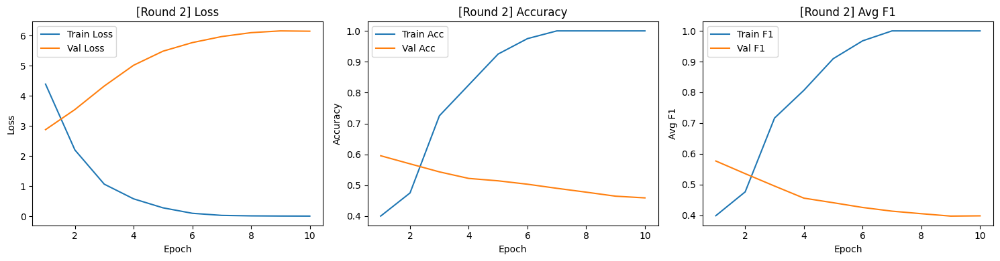


[AL Round 3/50] — Labeled samples: 60



Epoch 10/10
Train — Loss: 0.0176 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 3.2116 | Acc: 0.5767 | Avg F1: 0.5432


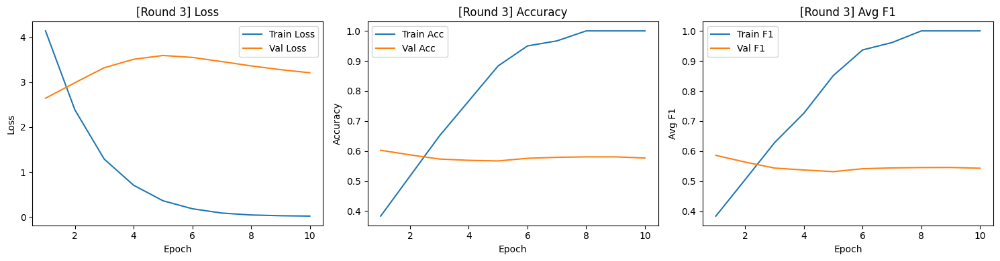


[AL Round 4/50] — Labeled samples: 80



Epoch 10/10
Train — Loss: 0.0409 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 2.0297 | Acc: 0.6590 | Avg F1: 0.6416


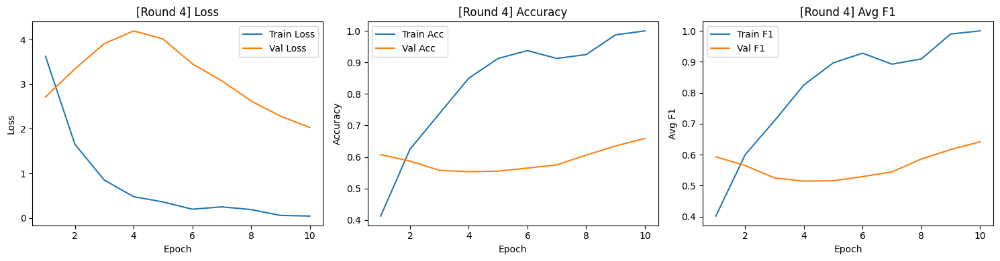


[AL Round 5/50] — Labeled samples: 100



Epoch 10/10
Train — Loss: 0.0237 | Acc: 0.9900 | Avg F1: 0.9922
Val   — Loss: 2.4404 | Acc: 0.5935 | Avg F1: 0.5796


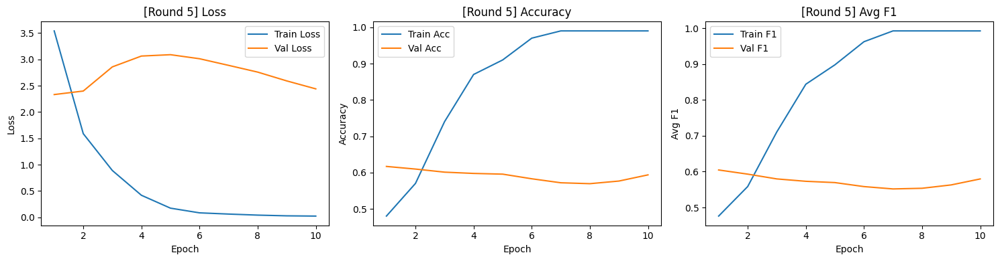


[AL Round 6/50] — Labeled samples: 120



Epoch 10/10
Train — Loss: 0.0302 | Acc: 0.9917 | Avg F1: 0.9937
Val   — Loss: 2.3024 | Acc: 0.6220 | Avg F1: 0.6043


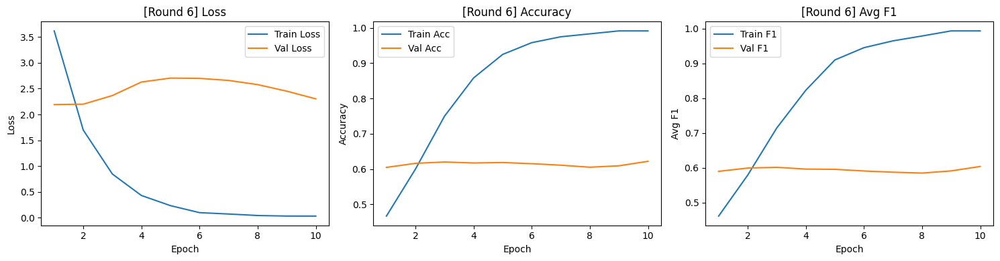


[AL Round 7/50] — Labeled samples: 140



Epoch 10/10
Train — Loss: 0.0566 | Acc: 0.9786 | Avg F1: 0.9680
Val   — Loss: 1.6659 | Acc: 0.7103 | Avg F1: 0.6945


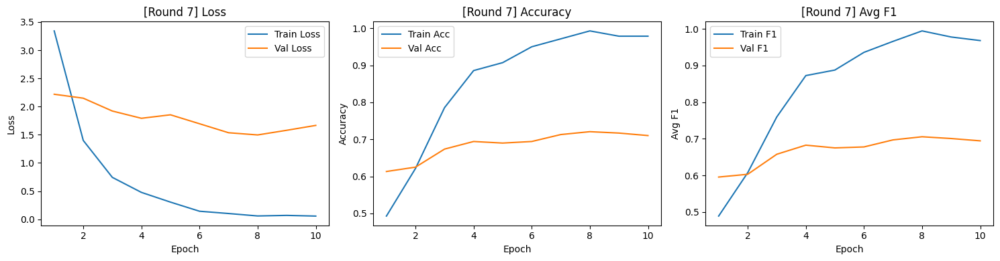


[AL Round 8/50] — Labeled samples: 160



Epoch 10/10
Train — Loss: 0.0099 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 1.4010 | Acc: 0.7278 | Avg F1: 0.7084


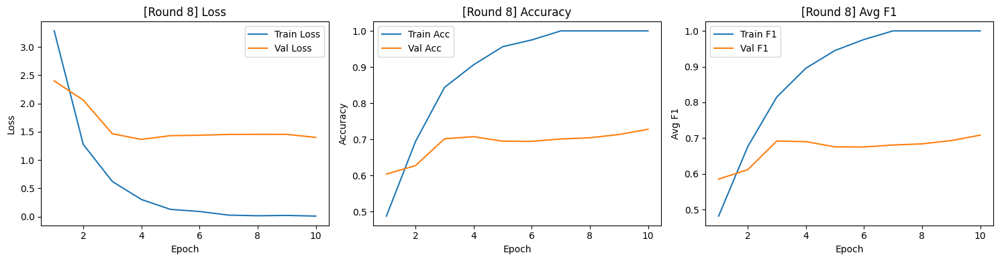


[AL Round 9/50] — Labeled samples: 180



Epoch 10/10
Train — Loss: 0.0140 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 1.1253 | Acc: 0.7620 | Avg F1: 0.7456


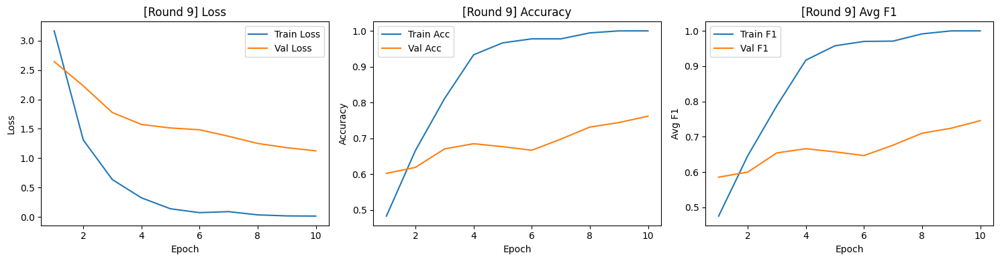


[AL Round 10/50] — Labeled samples: 200



Epoch 10/10
Train — Loss: 0.0562 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 2.0639 | Acc: 0.6490 | Avg F1: 0.6193


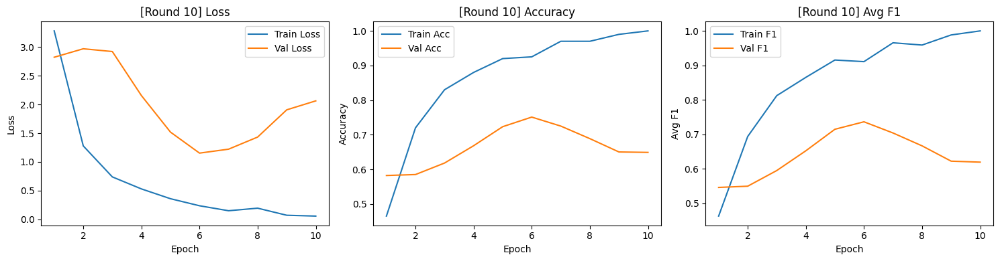


[AL Round 11/50] — Labeled samples: 220



Epoch 10/10
Train — Loss: 0.0224 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 1.1287 | Acc: 0.7775 | Avg F1: 0.7662


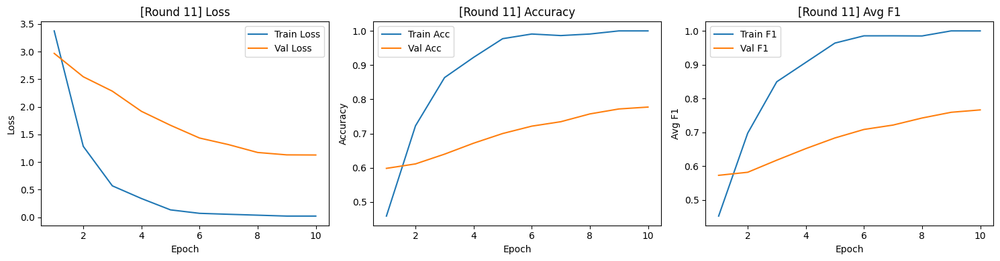


[AL Round 12/50] — Labeled samples: 240



Epoch 10/10
Train — Loss: 0.0217 | Acc: 0.9958 | Avg F1: 0.9932
Val   — Loss: 1.0440 | Acc: 0.7840 | Avg F1: 0.7674


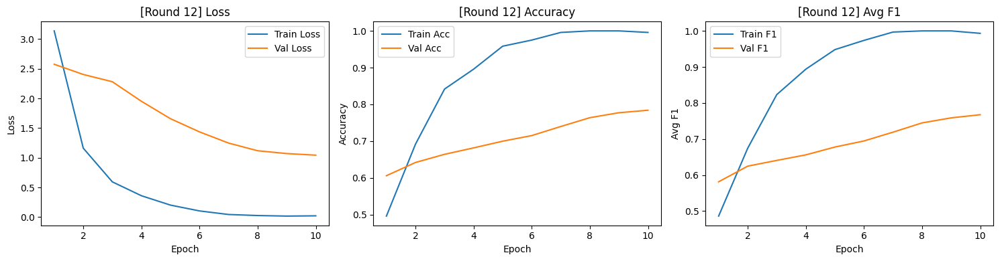


[AL Round 13/50] — Labeled samples: 260



Epoch 10/10
Train — Loss: 0.1126 | Acc: 0.9577 | Avg F1: 0.9547
Val   — Loss: 1.3187 | Acc: 0.7545 | Avg F1: 0.7539


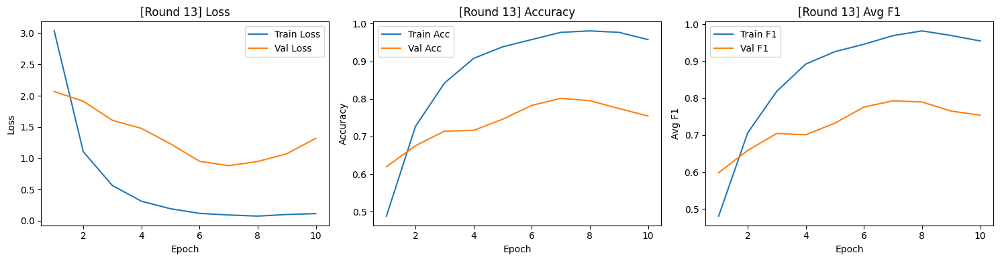


[AL Round 14/50] — Labeled samples: 280



Epoch 10/10
Train — Loss: 0.0357 | Acc: 0.9929 | Avg F1: 0.9916
Val   — Loss: 0.8033 | Acc: 0.8115 | Avg F1: 0.8025


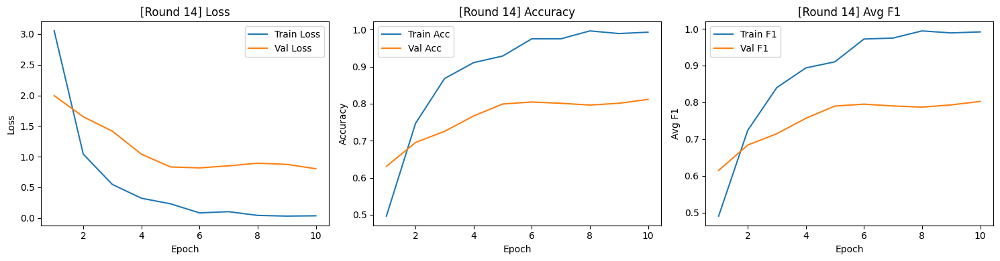


[AL Round 15/50] — Labeled samples: 300



Epoch 10/10
Train — Loss: 0.0197 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 0.8271 | Acc: 0.8057 | Avg F1: 0.7976


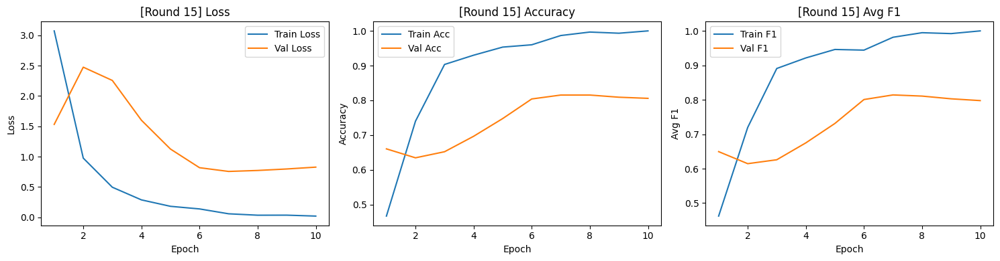


[AL Round 16/50] — Labeled samples: 320



Epoch 10/10
Train — Loss: 0.0199 | Acc: 0.9969 | Avg F1: 0.9951
Val   — Loss: 0.8179 | Acc: 0.8077 | Avg F1: 0.8025


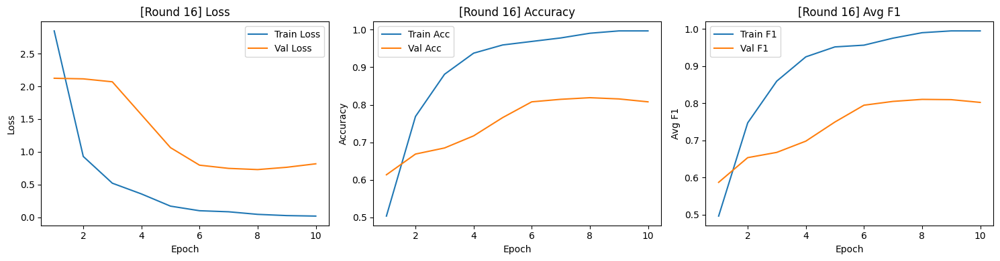


[AL Round 17/50] — Labeled samples: 340



Epoch 10/10
Train — Loss: 0.0244 | Acc: 0.9971 | Avg F1: 0.9952
Val   — Loss: 0.8464 | Acc: 0.8087 | Avg F1: 0.8015


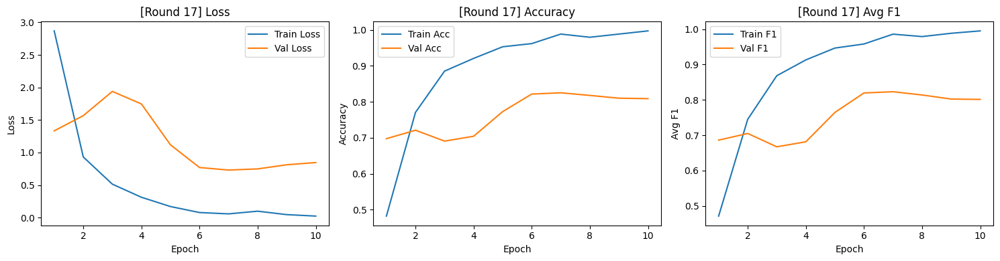


[AL Round 18/50] — Labeled samples: 360



Epoch 10/10
Train — Loss: 0.0212 | Acc: 0.9972 | Avg F1: 0.9979
Val   — Loss: 0.8143 | Acc: 0.8110 | Avg F1: 0.8047


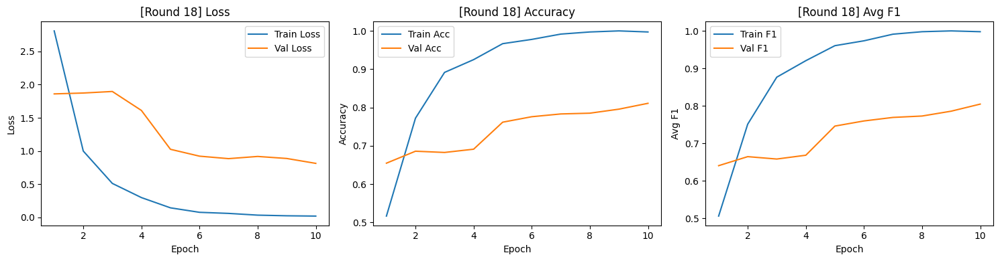


[AL Round 19/50] — Labeled samples: 380



Epoch 10/10
Train — Loss: 0.0255 | Acc: 0.9974 | Avg F1: 0.9980
Val   — Loss: 0.7476 | Acc: 0.8237 | Avg F1: 0.8211


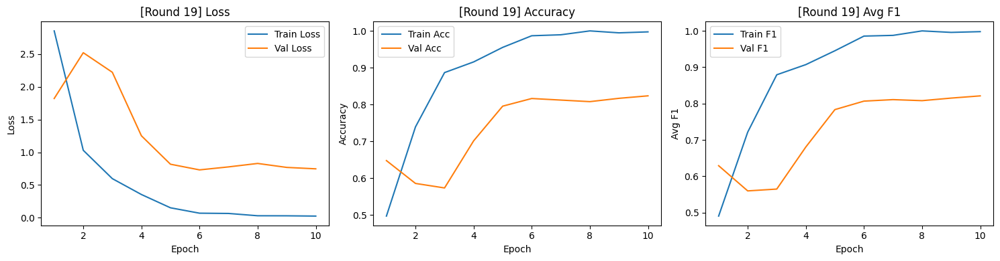


[AL Round 20/50] — Labeled samples: 400



Epoch 10/10
Train — Loss: 0.0242 | Acc: 0.9975 | Avg F1: 0.9981
Val   — Loss: 0.7145 | Acc: 0.8265 | Avg F1: 0.8192


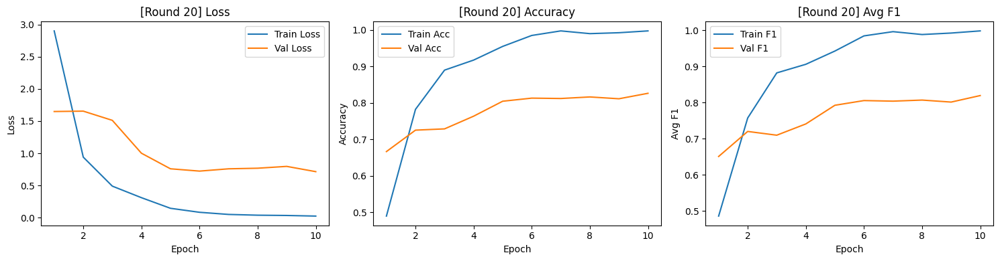


[AL Round 21/50] — Labeled samples: 420



Epoch 10/10
Train — Loss: 0.0190 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 0.6650 | Acc: 0.8395 | Avg F1: 0.8349


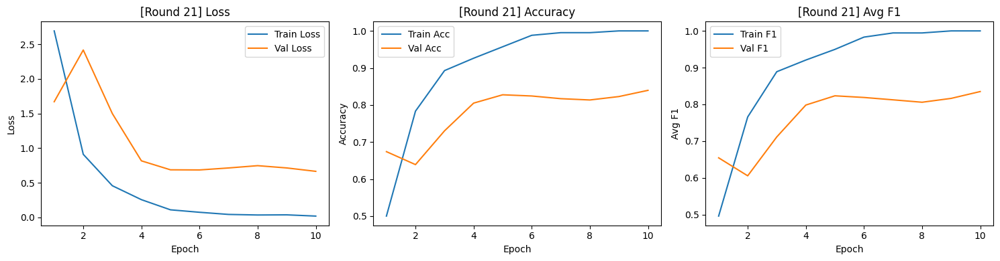


[AL Round 22/50] — Labeled samples: 440



Epoch 10/10
Train — Loss: 0.0208 | Acc: 0.9977 | Avg F1: 0.9982
Val   — Loss: 0.6653 | Acc: 0.8407 | Avg F1: 0.8387


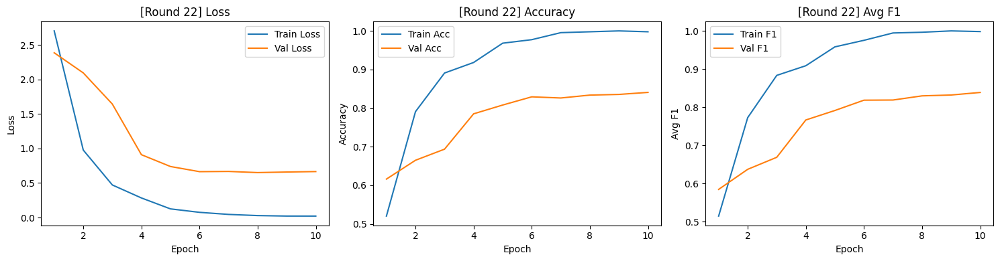


[AL Round 23/50] — Labeled samples: 460



Epoch 10/10
Train — Loss: 0.0314 | Acc: 0.9935 | Avg F1: 0.9917
Val   — Loss: 0.6497 | Acc: 0.8407 | Avg F1: 0.8399


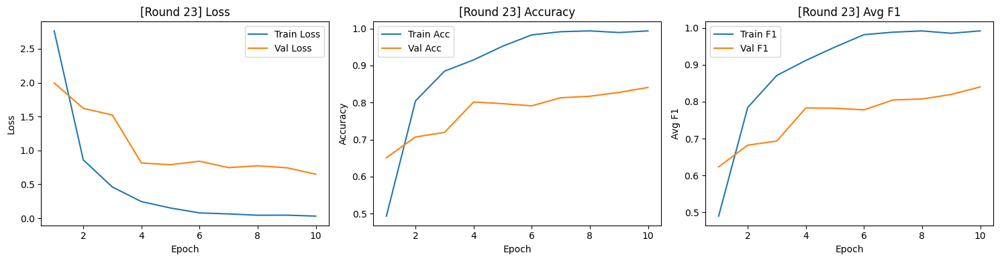


[AL Round 24/50] — Labeled samples: 480



Epoch 10/10
Train — Loss: 0.0323 | Acc: 0.9917 | Avg F1: 0.9871
Val   — Loss: 0.6026 | Acc: 0.8510 | Avg F1: 0.8489


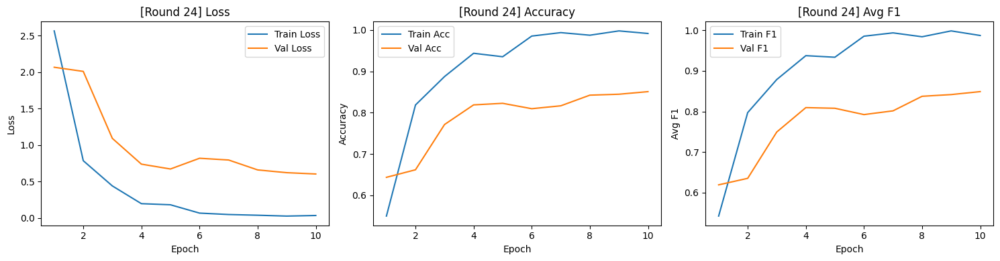


[AL Round 25/50] — Labeled samples: 500



Epoch 10/10
Train — Loss: 0.0169 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 0.6379 | Acc: 0.8508 | Avg F1: 0.8497


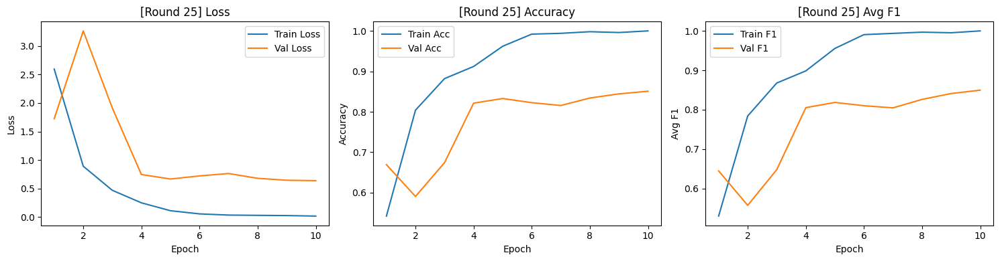


[AL Round 26/50] — Labeled samples: 520



Epoch 10/10
Train — Loss: 0.0842 | Acc: 0.9750 | Avg F1: 0.9773
Val   — Loss: 0.7949 | Acc: 0.8163 | Avg F1: 0.8190


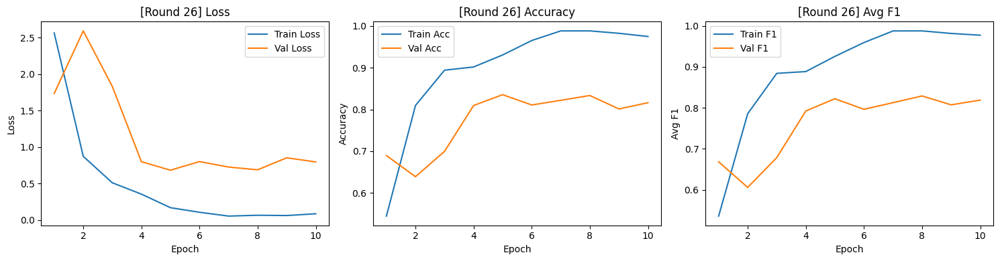


[AL Round 27/50] — Labeled samples: 540



Epoch 10/10
Train — Loss: 0.0206 | Acc: 0.9981 | Avg F1: 0.9970
Val   — Loss: 0.6095 | Acc: 0.8472 | Avg F1: 0.8473


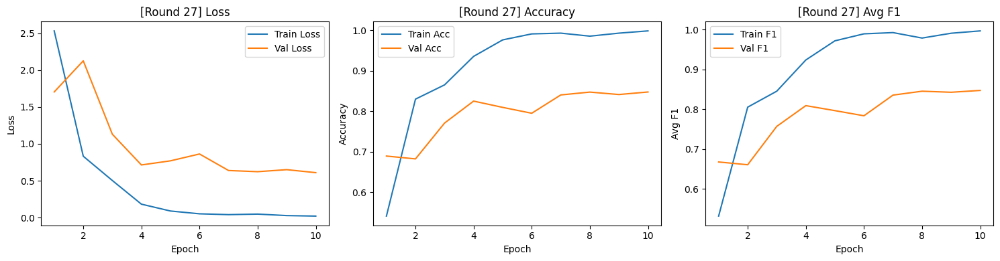


[AL Round 28/50] — Labeled samples: 560



Epoch 10/10
Train — Loss: 0.0203 | Acc: 0.9982 | Avg F1: 0.9986
Val   — Loss: 0.6681 | Acc: 0.8452 | Avg F1: 0.8437


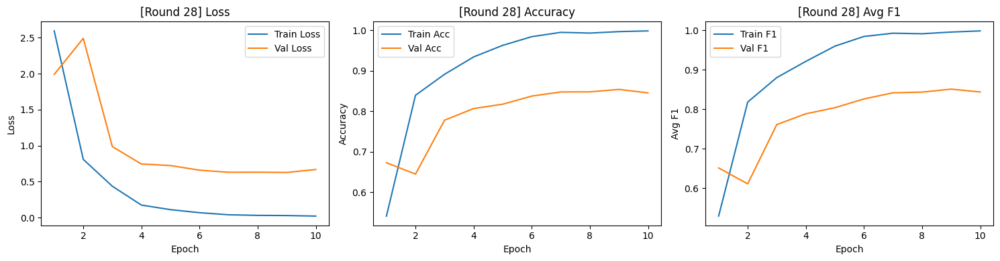


[AL Round 29/50] — Labeled samples: 580



Epoch 10/10
Train — Loss: 0.0815 | Acc: 0.9776 | Avg F1: 0.9797
Val   — Loss: 0.6355 | Acc: 0.8468 | Avg F1: 0.8427


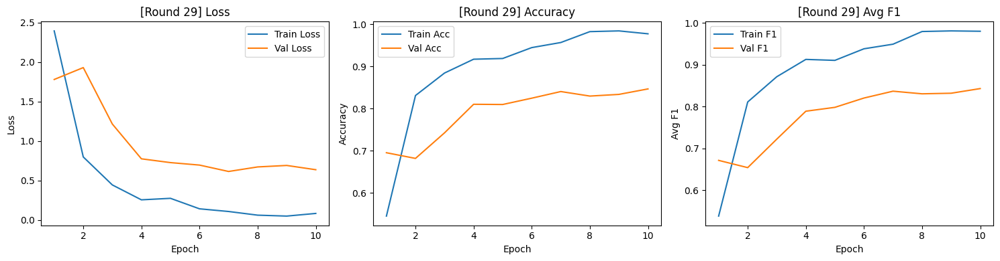


[AL Round 30/50] — Labeled samples: 600



Epoch 10/10
Train — Loss: 0.0185 | Acc: 0.9983 | Avg F1: 0.9974
Val   — Loss: 0.6860 | Acc: 0.8423 | Avg F1: 0.8420


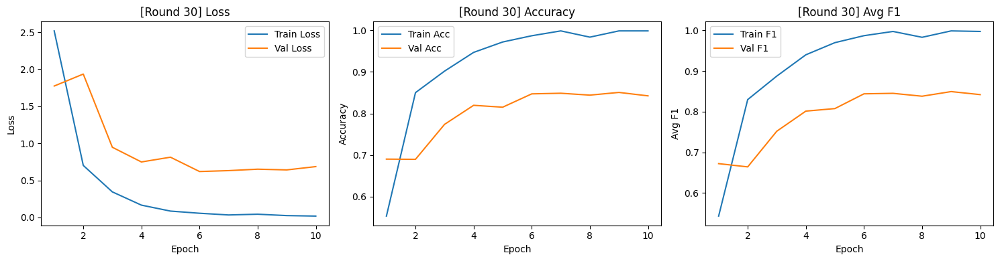


[AL Round 31/50] — Labeled samples: 620



Epoch 10/10
Train — Loss: 0.0246 | Acc: 0.9952 | Avg F1: 0.9937
Val   — Loss: 0.6362 | Acc: 0.8542 | Avg F1: 0.8524


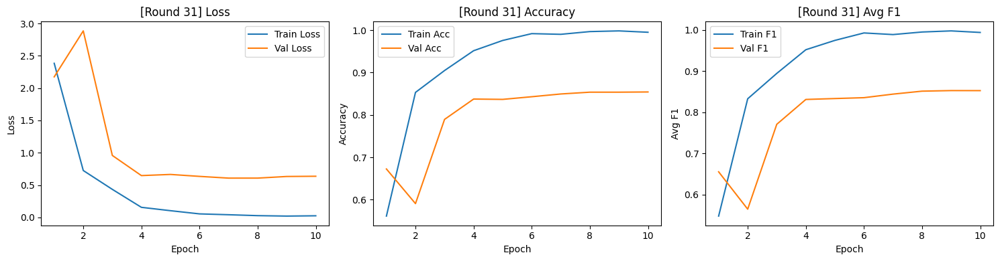


[AL Round 32/50] — Labeled samples: 640



Epoch 10/10
Train — Loss: 0.0214 | Acc: 0.9984 | Avg F1: 0.9975
Val   — Loss: 0.5746 | Acc: 0.8598 | Avg F1: 0.8629


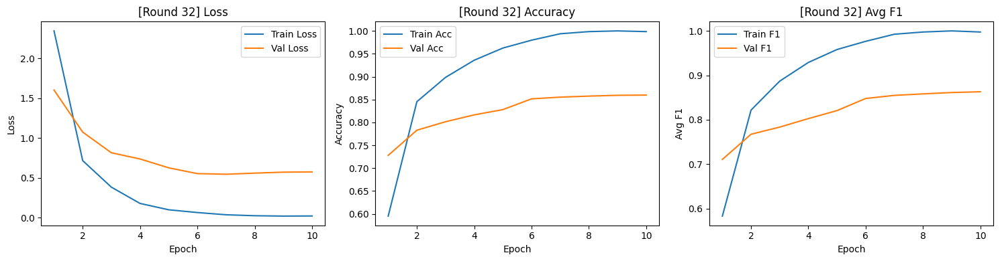


[AL Round 33/50] — Labeled samples: 660



Epoch 10/10
Train — Loss: 0.0212 | Acc: 0.9955 | Avg F1: 0.9952
Val   — Loss: 0.6434 | Acc: 0.8520 | Avg F1: 0.8540


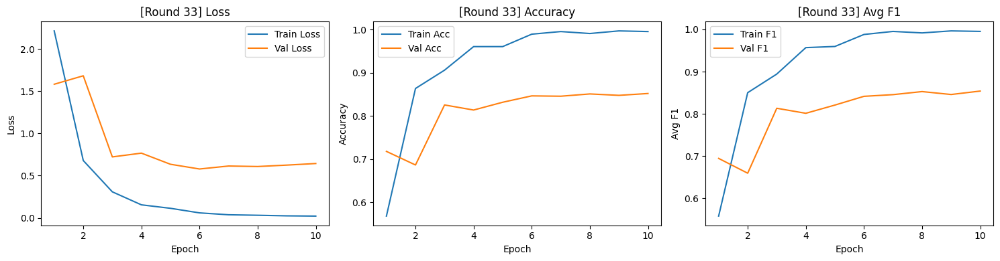


[AL Round 34/50] — Labeled samples: 680



Epoch 10/10
Train — Loss: 0.0219 | Acc: 0.9956 | Avg F1: 0.9954
Val   — Loss: 0.5930 | Acc: 0.8595 | Avg F1: 0.8581


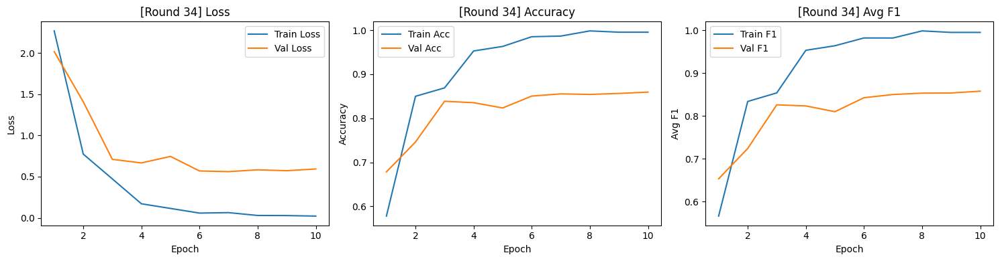


[AL Round 35/50] — Labeled samples: 700



Epoch 10/10
Train — Loss: 0.0169 | Acc: 0.9986 | Avg F1: 0.9977
Val   — Loss: 0.5950 | Acc: 0.8518 | Avg F1: 0.8511


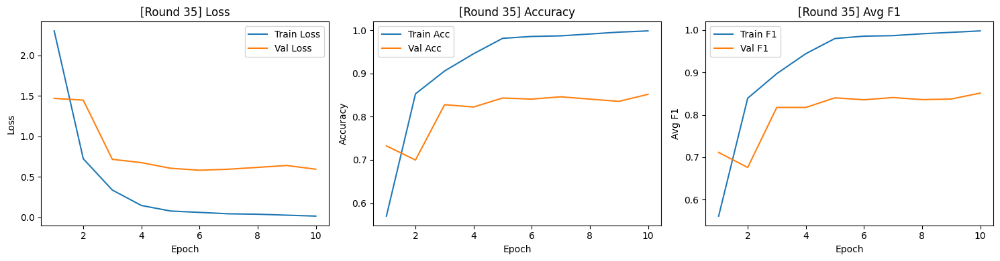


[AL Round 36/50] — Labeled samples: 720



Epoch 10/10
Train — Loss: 0.0312 | Acc: 0.9944 | Avg F1: 0.9924
Val   — Loss: 0.6968 | Acc: 0.8353 | Avg F1: 0.8335


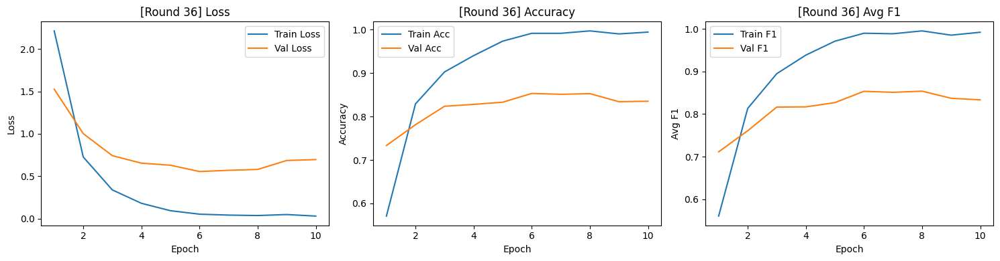


[AL Round 37/50] — Labeled samples: 740



Epoch 10/10
Train — Loss: 0.0207 | Acc: 0.9986 | Avg F1: 0.9990
Val   — Loss: 0.6275 | Acc: 0.8502 | Avg F1: 0.8454


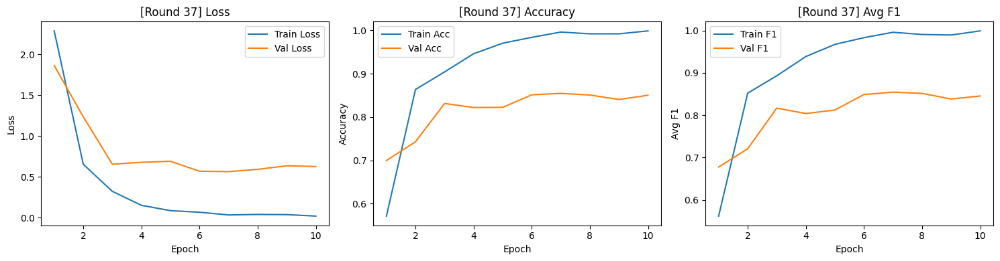


[AL Round 38/50] — Labeled samples: 760



Epoch 10/10
Train — Loss: 0.0262 | Acc: 0.9947 | Avg F1: 0.9938
Val   — Loss: 0.5896 | Acc: 0.8500 | Avg F1: 0.8491


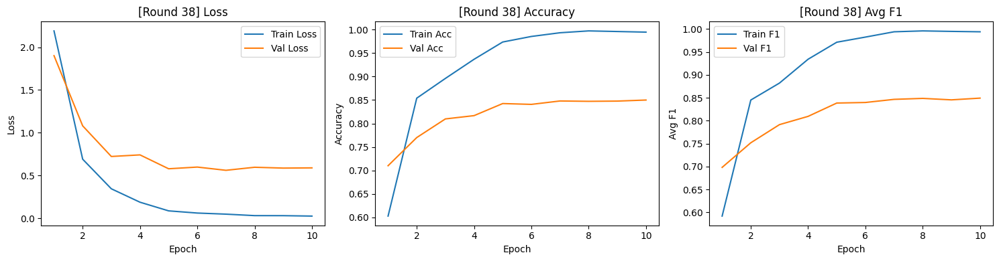


[AL Round 39/50] — Labeled samples: 780



Epoch 10/10
Train — Loss: 0.0432 | Acc: 0.9897 | Avg F1: 0.9879
Val   — Loss: 0.6179 | Acc: 0.8297 | Avg F1: 0.8261


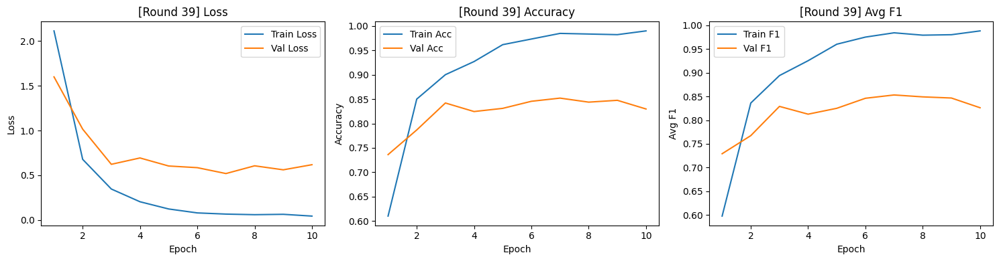


[AL Round 40/50] — Labeled samples: 800



Epoch 10/10
Train — Loss: 0.0278 | Acc: 0.9962 | Avg F1: 0.9951
Val   — Loss: 0.6747 | Acc: 0.8300 | Avg F1: 0.8259


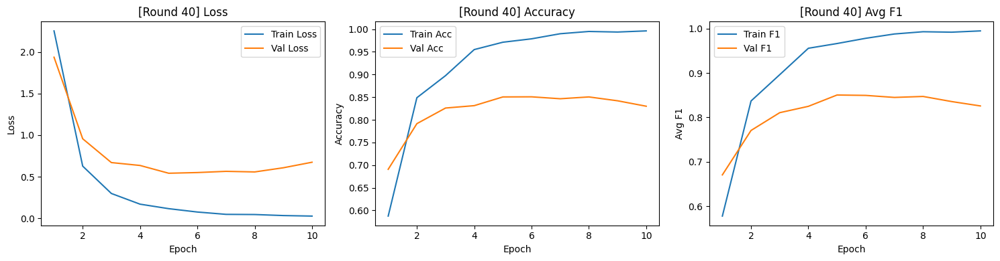


[AL Round 41/50] — Labeled samples: 820



Epoch 10/10
Train — Loss: 0.0210 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 0.5512 | Acc: 0.8512 | Avg F1: 0.8518


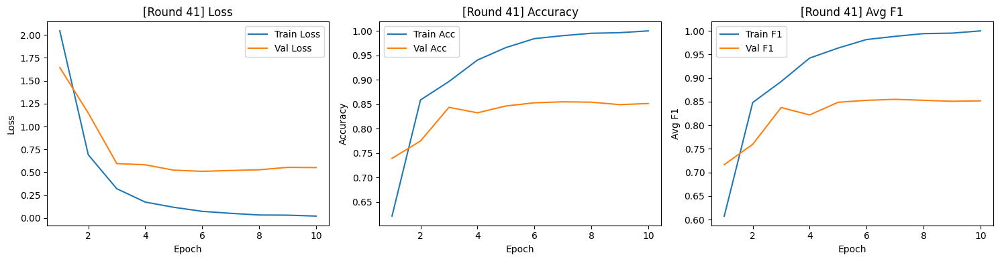


[AL Round 42/50] — Labeled samples: 840



Epoch 10/10
Train — Loss: 0.0268 | Acc: 0.9964 | Avg F1: 0.9963
Val   — Loss: 0.5533 | Acc: 0.8538 | Avg F1: 0.8544


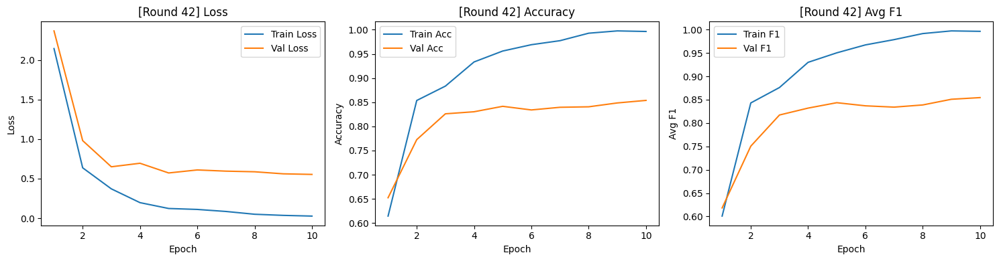


[AL Round 43/50] — Labeled samples: 860



Epoch 10/10
Train — Loss: 0.0256 | Acc: 0.9977 | Avg F1: 0.9973
Val   — Loss: 0.5708 | Acc: 0.8532 | Avg F1: 0.8535


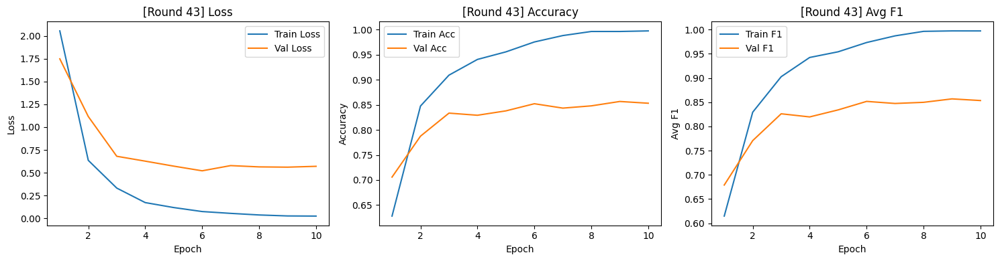


[AL Round 44/50] — Labeled samples: 880



Epoch 10/10
Train — Loss: 0.0204 | Acc: 1.0000 | Avg F1: 1.0000
Val   — Loss: 0.5702 | Acc: 0.8538 | Avg F1: 0.8547


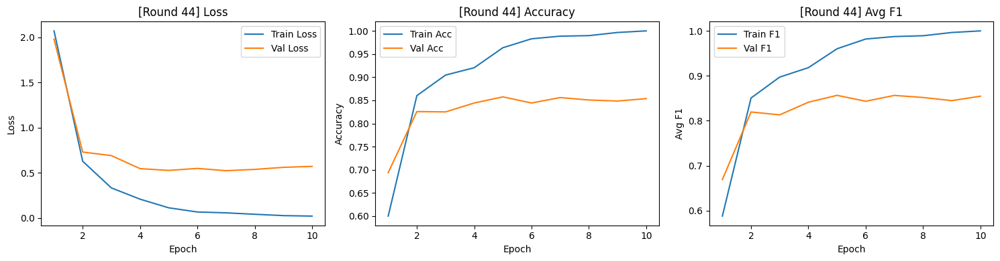


[AL Round 45/50] — Labeled samples: 900



Epoch 10/10
Train — Loss: 0.1095 | Acc: 0.9667 | Avg F1: 0.9669
Val   — Loss: 0.6550 | Acc: 0.8395 | Avg F1: 0.8349


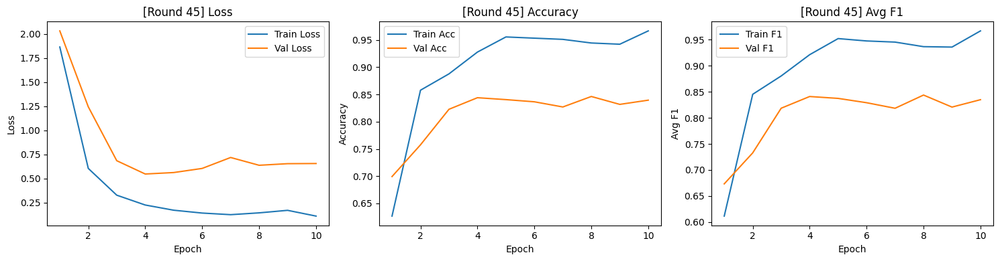


[AL Round 46/50] — Labeled samples: 920



Epoch 10/10
Train — Loss: 0.0277 | Acc: 0.9989 | Avg F1: 0.9983
Val   — Loss: 0.5510 | Acc: 0.8558 | Avg F1: 0.8564


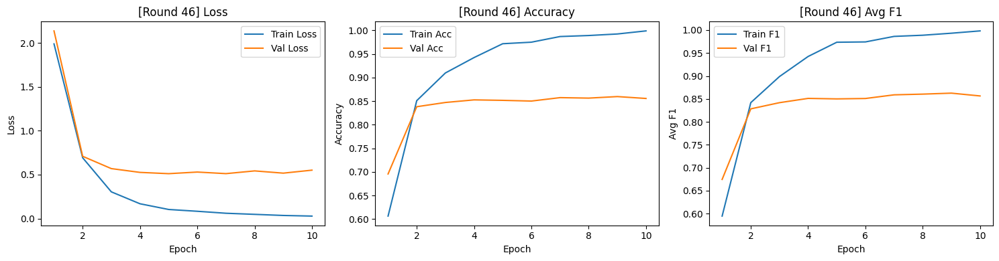


[AL Round 47/50] — Labeled samples: 940



Epoch 10/10
Train — Loss: 0.0184 | Acc: 0.9989 | Avg F1: 0.9992
Val   — Loss: 0.5795 | Acc: 0.8530 | Avg F1: 0.8509


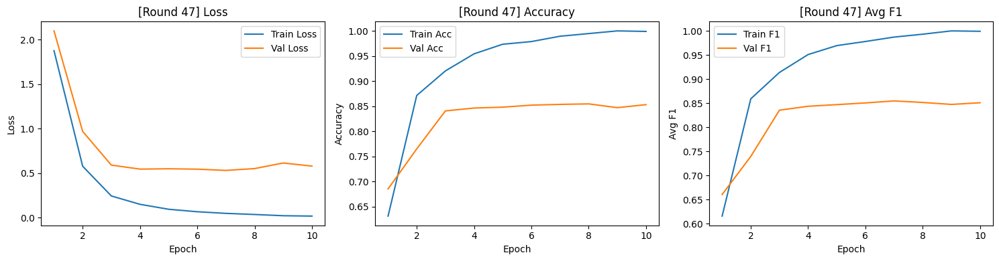


[AL Round 48/50] — Labeled samples: 960



Epoch 10/10
Train — Loss: 0.0300 | Acc: 0.9948 | Avg F1: 0.9942
Val   — Loss: 0.5565 | Acc: 0.8528 | Avg F1: 0.8510


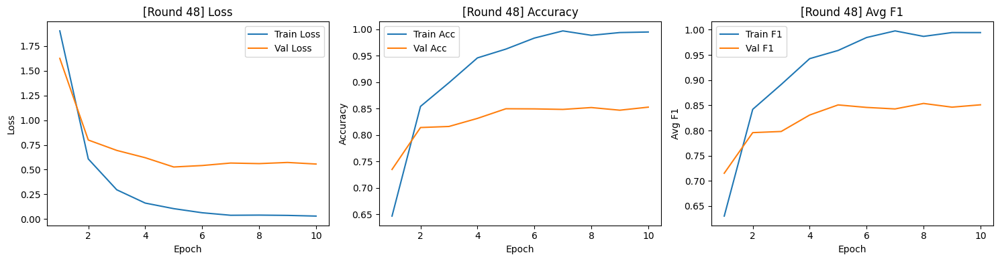


[AL Round 49/50] — Labeled samples: 980



Epoch 10/10
Train — Loss: 0.0346 | Acc: 0.9929 | Avg F1: 0.9910
Val   — Loss: 0.5350 | Acc: 0.8620 | Avg F1: 0.8613


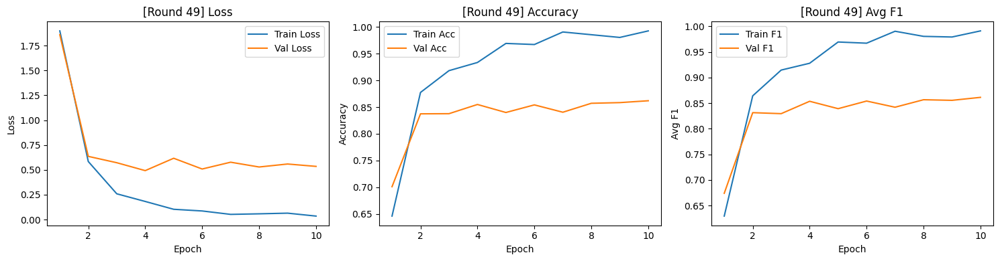


[AL Round 50/50] — Labeled samples: 1000



Epoch 10/10
Train — Loss: 0.0270 | Acc: 0.9960 | Avg F1: 0.9952
Val   — Loss: 0.5820 | Acc: 0.8538 | Avg F1: 0.8558


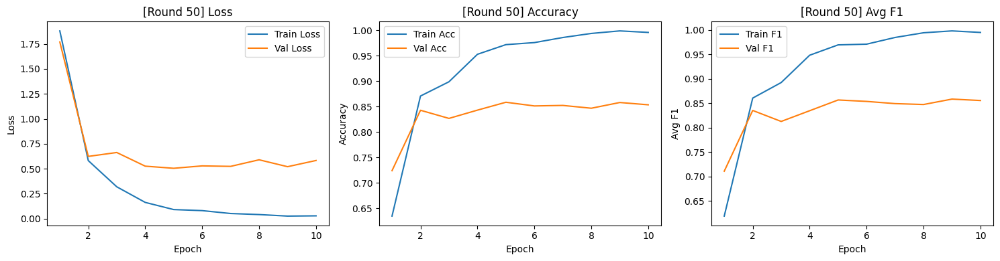

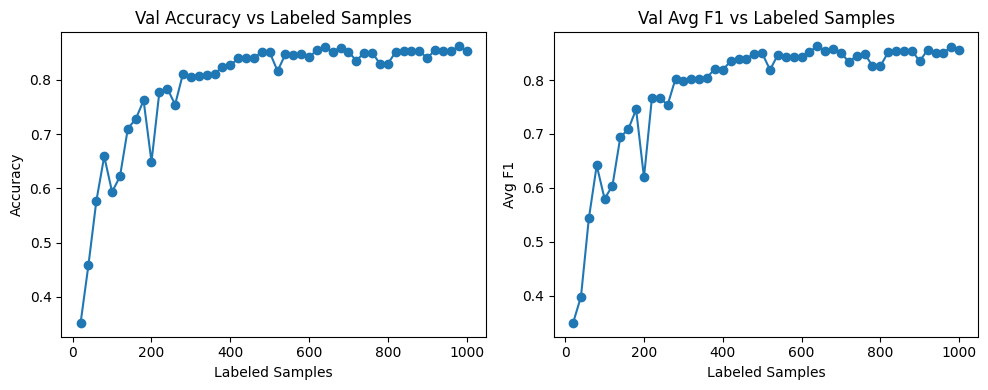

In [339]:

strategies = ["entropy", "least_confident", "margin", "random"]
all_histories = {}

for strat in strategies:
    print(f"\n=== Running strategy: {strat.upper()} ===")
    
    # Reset datasets to initial versions (deepcopy to avoid mutations)
    labeled = copy.deepcopy(labeled_dataset)
    unlabeled = copy.deepcopy(unlabeled_dataset)

    hist = active_learning_loop(
        model,
        labeled_dataset=labeled,
        unlabeled_dataset=unlabeled,
        val_dataset=val_dataset,
        strategy=strat,
        device=device,
        iters=50,
        query_size=20,
        epochs=10
    )
    
    all_histories[strat] = hist


with open("/kaggle/working/history_entropy.pkl", "wb") as f:
    pickle.dump(history, f)


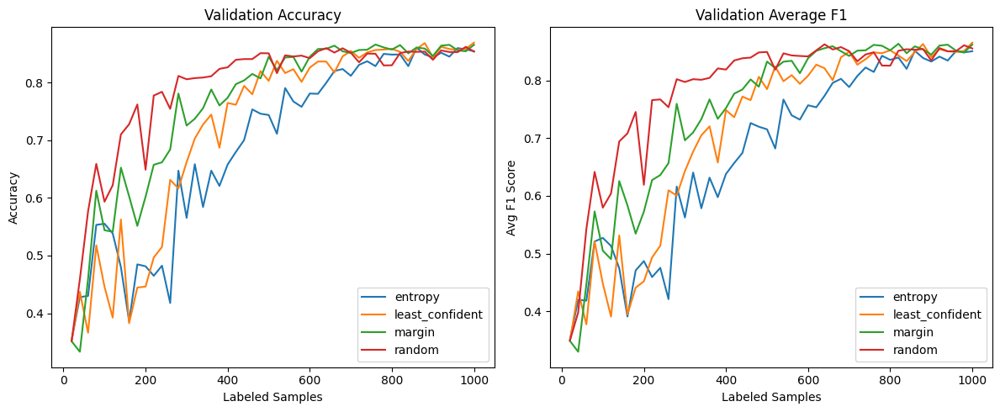

In [340]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Val Accuracy plot
plt.subplot(1, 2, 1)
for strat, hist in all_histories.items():
    plt.plot(hist["samples"], hist["round_val_acc"], label=strat)
plt.title("Validation Accuracy")
plt.xlabel("Labeled Samples")
plt.ylabel("Accuracy")
plt.legend()

# Val F1 plot
plt.subplot(1, 2, 2)
for strat, hist in all_histories.items():
    plt.plot(hist["samples"], hist["round_val_avg_f1"], label=strat)
plt.title("Validation Average F1")
plt.xlabel("Labeled Samples")
plt.ylabel("Avg F1 Score")
plt.legend()

plt.tight_layout()
plt.show()
